# Model Training for Ultrasound Image Reconstruction
This notebook sets up the training pipeline for the U-Net-style custom network using ultrasound data.  

In [2]:
# run this cell only in Google Colab
COLAB = True
if COLAB:
    # === 1. Clone your repo ===
    !git clone https://github.com/jacobinsilico/ReconstructUS.git
    %cd ReconstructUS

    # === 2. Install required packages ===
    !pip install piq torchinfo pytorch-msssim

    # === 3. Add repo to Python path ===
    import sys
    sys.path.append('/content/ReconstructUS')

    # === 4. Mount Google Drive ===
    from google.colab import drive
    drive.mount('/content/drive')

Cloning into 'ReconstructUS'...
remote: Enumerating objects: 394, done.
remote: Counting objects: 100% (8/8), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 394 (delta 2), reused 6 (delta 1), pack-reused 386 (from 1)
Receiving objects: 100% (394/394), 31.67 MiB | 17.59 MiB/s, done.
Resolving deltas: 100% (209/209), done.
/content/ReconstructUS
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 106.9/106.9 kB 7.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 123.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 75.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 40.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 1.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 6.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 12.9 MB/s eta 0:0

In [3]:
# === Standard Library ===
import os
import random
from glob import glob

# === Scientific & ML ===
import numpy as np
import scipy.io as sio
import matplotlib.pyplot as plt

# === PyTorch ===
import torch
from torch.utils.data import DataLoader, TensorDataset, ConcatDataset
import torch.nn.functional as F

# === Progress & Splitting ===
from tqdm import tqdm, trange
from sklearn.model_selection import train_test_split

# === Models ===
from models.unet     import CustomUNet          # 1M40K params 24 base channels
from models.effunet  import CustomEfficientUNet # 970K params  16 channels

# === Data Handling ===
from dataloader.load_rf     import load_rf_stack, group_plane_waves, compute_global_min_max
from dataloader.load_gt     import load_gt_stack
from dataloader.norm_sample import normalize_to_01

# === Utils ===
from utils.visualize_raw import visualize_gt_db, visualize_rf_line
from utils.losses        import ssim_loss, ms_ssim_loss, mae_loss, fft_loss, edge_loss, CharbonnierLoss

from utils.metrics       import compute_metrics
from utils.augment       import add_speckle_noise, add_jitter_and_noise, zero_out_rf_channels

import torch
import torch.nn as nn
import torch.nn.functional as F
from pytorch_msssim import ms_ssim

## Configuration
Define all the training parameters in one variable.

In [4]:
TARGET_DEPTH = 1600 # target number of samples for all considered RF files
DATASET_SIZE = 300  # number of total samples loaded in the notebook
BATCH_SIZE = 16
PW_PER_IMG = 1 # number of plane waves we want to use to reconstruct one GT image
DOWNSAMPLE_FACTOR = 2 # we want to downsample our image to make it easier for smaller model to reconstruct

In [5]:
CONFIG = {
    'model_name': 'unet',              # options: 'unet', 'effunet'
    'loss_function': 'combined',          # options: 'ssim', 'mae', 'combined' TODO: make it more customizable
    'batch_size': BATCH_SIZE,
    'lr': 5e-3,
    'epochs': 200,
    'input_size': None,                   # set later based on loaded .mat files
    'device': 'cuda' if torch.cuda.is_available() else 'cpu',

    # === Data paths ===
    'data_dir_rf': '/content/drive/MyDrive/SoCDAML-Project/data/raw',
    'data_dir_img': '/content/drive/MyDrive/SoCDAML-Project/data/processed',

    # === Checkpoint path ===
    'checkpoints_dir': None,         # set below
}

# Set checkpoint save directory inside project folder
if not COLAB:
    CONFIG['data_dir_rf'] = os.path.join('data', 'raw')
    CONFIG['data_dir_img'] = os.path.join('data', 'processed')
    CONFIG['checkpoints_dir'] = os.path.join('..', 'checkpoints', CONFIG['model_name'])
    os.makedirs(CONFIG['checkpoints_dir'], exist_ok=True)

if COLAB:
    CONFIG['checkpoints_dir'] = os.path.join('/content/drive/MyDrive/SoCDAML-Project/checkpoints', CONFIG['model_name'])
    os.makedirs(CONFIG['checkpoints_dir'], exist_ok=True)

In [6]:
if torch.cuda.is_available():
    device_name = torch.cuda.get_device_name(0)
    print(f"✅ CUDA is available! Using GPU: {device_name}")
else:
    print("❌ CUDA is not available. Training will be **very slow** on CPU.")

✅ CUDA is available! Using GPU: Tesla T4


## Data Loading
We assume .mat for input RF data and .mat for the reconstructed image files.

Computing global min/max...


100%|██████████| 6/6 [00:20<00:00,  3.43s/it]


Loading and normalizing RF frames...


100%|██████████| 6/6 [00:04<00:00,  1.44it/s]


RF tensor final shape: torch.Size([450, 1600, 128])
Value range:  -1.0 1.0


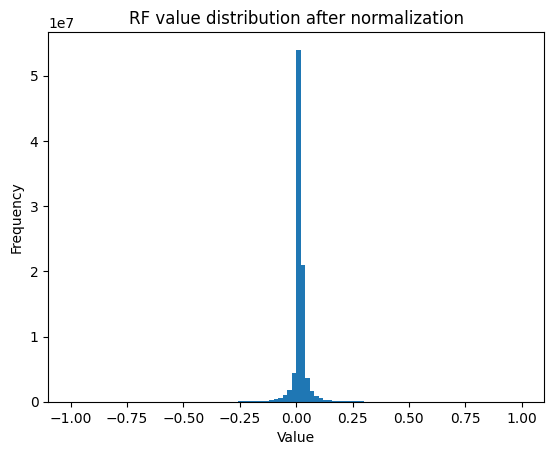

In [7]:
# CORRECT DONT TOUCH
# Gather paths
rf_paths = sorted(glob(os.path.join(CONFIG['data_dir_rf'], 'rf_*.mat')))

# First pass: compute normalization stats
global_min, global_max = compute_global_min_max(rf_paths)

# Second pass: load RF, normalize, pad
rf_tensor = load_rf_stack(rf_paths, TARGET_DEPTH, global_min, global_max)

# Optional: group plane waves if using multiple per image
if PW_PER_IMG != 1:
    rf_tensor = group_plane_waves(rf_tensor, PW_PER_IMG)

# -------------------------------
# 4. Sanity Checks
# -------------------------------
print("RF tensor final shape:", rf_tensor.shape)
print("Value range: ", rf_tensor.min().item(), rf_tensor.max().item())
assert -1.01 <= rf_tensor.min() <= 0.0, "RF min value out of range!"
assert  0.0 <= rf_tensor.max() <= 1.01, "RF max value out of range!"

# Optional histogram to visualize value distribution
plt.hist(rf_tensor.flatten().numpy(), bins=100)
plt.title("RF value distribution after normalization")
plt.xlabel("Value")
plt.ylabel("Frequency")
plt.show()

[INFO] Global max (linear magnitude): 907.6446


100%|██████████| 6/6 [00:00<00:00, 37.25it/s]

We are using 1 waves per reconstructed image!
GT tensor shape: torch.Size([450, 192, 304])


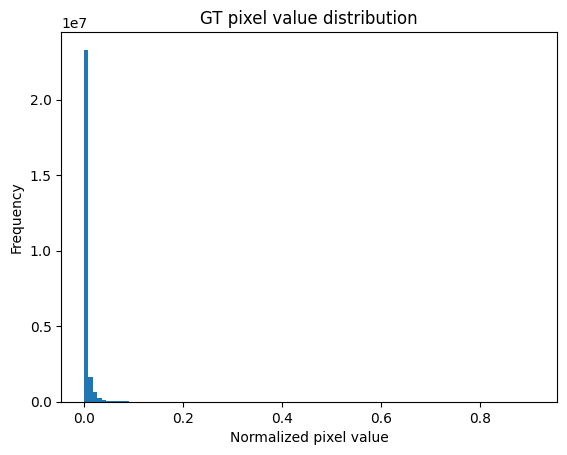

In [8]:
# CORRECT DONT TOUCH
img_paths = sorted(glob(os.path.join(CONFIG['data_dir_img'], 'img_*.mat')))
gt_tensor = load_gt_stack(img_paths, repeats_per_img=75//PW_PER_IMG, downsample_factor=DOWNSAMPLE_FACTOR)  # Output: [N x 192 x 304]

# Sanity check
print(f"We are using {PW_PER_IMG} waves per reconstructed image!")
print("GT tensor shape:", gt_tensor.shape)   # Output: [N x 192 x 304] -> We are working on images downsampled TWICE

assert 0.0 <= gt_tensor.min() <= 1.0
assert 0.0 <= gt_tensor.max() <= 1.0

# Histogram
plt.hist(gt_tensor.flatten().numpy(), bins=100)
plt.title("GT pixel value distribution")
plt.xlabel("Normalized pixel value")
plt.ylabel("Frequency")
plt.show()

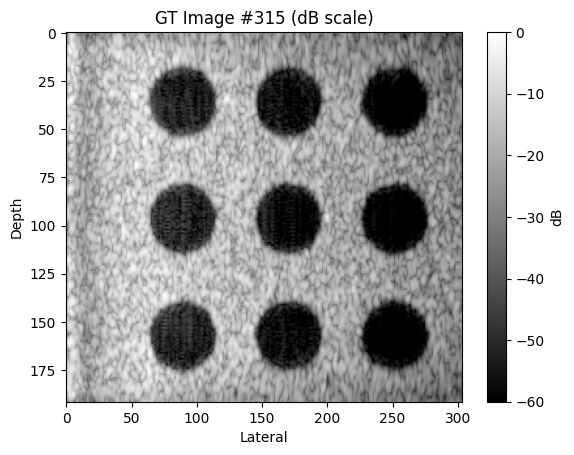

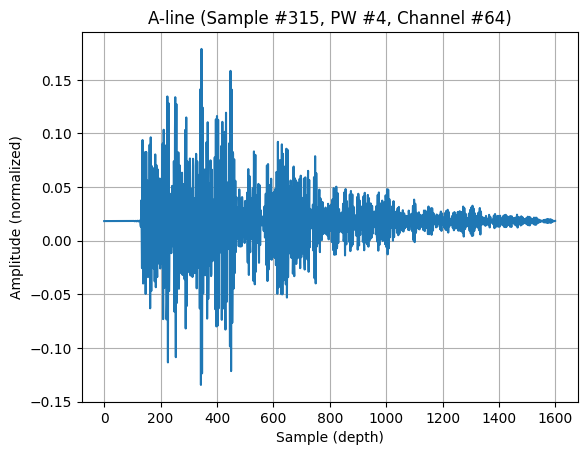

In [9]:
# visualize random image from the ones read WORKS FOR BOTH 3D and 4D RF data
random_index = random.randint(0, gt_tensor.shape[0] - 1)

visualize_gt_db(gt_tensor, idx=random_index)
visualize_rf_line(rf_tensor, file_idx=random_index, pw_idx=4, ch_idx=64)

## Data Augmentation
In this part we create new tensors with augmented GT images and zeroes out transducer channels. Output of this section should be DataLoader.

In [10]:
# First split: 80% train, 20% temp (val + test)
rf_train, rf_temp, gt_train, gt_temp = train_test_split(rf_tensor, gt_tensor, test_size=0.5, random_state=42, shuffle=True)

# Second split: 50% val, 50% test from the remaining 20%
rf_val, rf_test, gt_val, gt_test = train_test_split(rf_temp, gt_temp, test_size=0.5, random_state=42, shuffle=True)

Original shape: torch.Size([225, 192, 304])
Augmented shape: torch.Size([225, 192, 304])
Visualizing index: 114


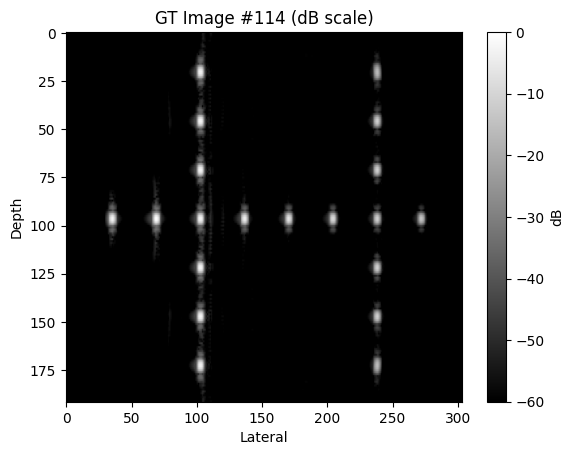

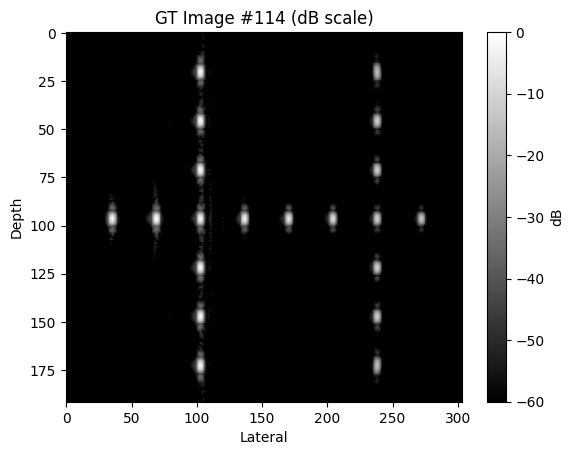

In [11]:
# ==== Test it on gt_train ====
gt_augmented = add_jitter_and_noise(gt_train)

print("Original shape:", gt_train.shape)
print("Augmented shape:", gt_augmented.shape)

# Visual check with a random index
idx_test1 = torch.randint(0, gt_train.shape[0], (1,)).item()
print(f"Visualizing index: {idx_test1}")

visualize_gt_db(gt_train, idx=idx_test1)
visualize_gt_db(gt_augmented, idx=idx_test1)

RF original shape:  torch.Size([225, 1600, 128])
RF augmented shape: torch.Size([225, 1600, 128])
Dropped channel indices: [78, 114, 75, 29, 124, 18, 52, 38, 82, 87, 107, 28]
Visualizing file index: 131, PW: 4, Channel: 78
Original RF slice:


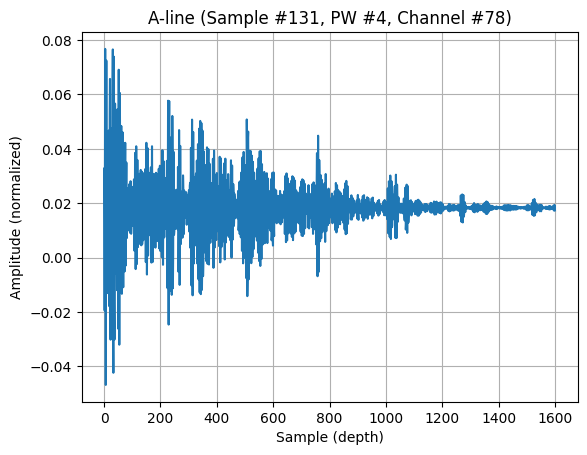

Augmented RF slice:


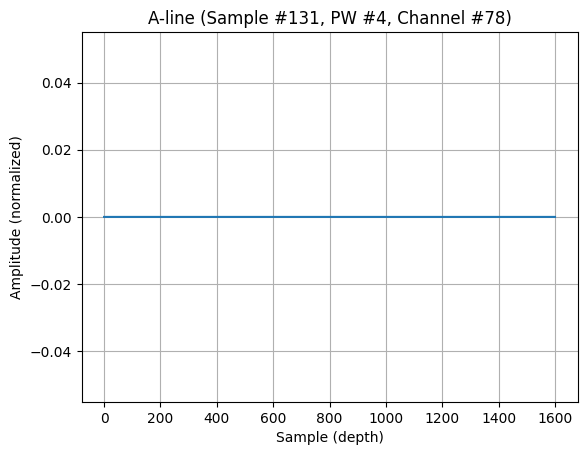

In [12]:
# ==== Test it on rf_train ====
rf_augmented, zeroed_idx = zero_out_rf_channels(rf_train, dropout_rate=0.1)

print("RF original shape: ", rf_train.shape)
print("RF augmented shape:", rf_augmented.shape)
print("Dropped channel indices:", zeroed_idx)

# Choose a random sample index from rf_train
file_idx = torch.randint(0, rf_train.shape[0], (1,)).item()
pw_idx = 4 # can be max 4 if we use 5 plane waves
ch_idx = zeroed_idx[0]

print(f"Visualizing file index: {file_idx}, PW: {pw_idx}, Channel: {ch_idx}")

# Visualize original
print("Original RF slice:")
visualize_rf_line(rf_train, file_idx=file_idx, pw_idx=pw_idx, ch_idx=ch_idx)

# Visualize zeroed
print("Augmented RF slice:")
visualize_rf_line(rf_augmented, file_idx=file_idx, pw_idx=pw_idx, ch_idx=ch_idx)


In [13]:
# print shapes of tensors
print("RF train shape:", rf_train.shape)
print("GT train shape:", gt_train.shape)
print("RF val shape:", rf_val.shape)
print("GT val shape:", gt_val.shape)
print("RF test shape:", rf_test.shape)
print("GT test shape:", gt_test.shape)

RF train shape: torch.Size([225, 1600, 128])
GT train shape: torch.Size([225, 192, 304])
RF val shape: torch.Size([112, 1600, 128])
GT val shape: torch.Size([112, 192, 304])
RF test shape: torch.Size([113, 1600, 128])
GT test shape: torch.Size([113, 192, 304])


## Data Augmentation
This is a short section where I augment the data to artificially increase the dataset size.

In [14]:
# === Augmentation settings for realistic diversity ===
augmentation_presets = [
    {'contrast': 1.002,  'noise': 0.0004, 'dropout': 0.10},
    {'contrast': 0.998,  'noise': 0.0005, 'dropout': 0.15},
    {'contrast': 1.0005, 'noise': 0.0006, 'dropout': 0.20},
    {'contrast': 1.001,  'noise': 0.0003, 'dropout': 0.05},
    {'contrast': 0.999,  'noise': 0.0005, 'dropout': 0.10}
]

NUM_AUGMENTED_SETS = len(augmentation_presets)

In [15]:
# === Augment GT and RF data ===
gt_augmented_list = []
rf_augmented_list = []

for i, preset in enumerate(augmentation_presets):
    # Apply GT jitter & noise
    gt_aug = add_jitter_and_noise(
        gt_tensor=gt_train,
        contrast_factor=preset['contrast'],
        noise_std=preset['noise'],
        prob=1.0
    )

    # Zero out random RF channels
    rf_aug, dropped = zero_out_rf_channels(
        rf_tensor=rf_train,
        dropout_rate=preset['dropout']
    )

    gt_augmented_list.append(gt_aug.unsqueeze(1))        # [N, 1, H, W]
    rf_augmented_list.append(rf_aug.unsqueeze(1))        # [N, 1, D, C]

    print(f"[AUG {i+1}] Contrast={preset['contrast']}, Noise={preset['noise']}, Dropout={preset['dropout']} | Dropped={dropped}")
    print(f"         RF shape: {rf_aug.shape}, GT shape: {gt_aug.shape}\n")

[AUG 1] Contrast=1.002, Noise=0.0004, Dropout=0.1 | Dropped=[13, 59, 110, 92, 30, 58, 123, 78, 89, 83, 79, 84]
         RF shape: torch.Size([225, 1600, 128]), GT shape: torch.Size([225, 192, 304])

[AUG 2] Contrast=0.998, Noise=0.0005, Dropout=0.15 | Dropped=[93, 6, 58, 1, 63, 118, 107, 20, 10, 51, 86, 65, 12, 5, 4, 126, 33, 40, 26]
         RF shape: torch.Size([225, 1600, 128]), GT shape: torch.Size([225, 192, 304])

[AUG 3] Contrast=1.0005, Noise=0.0006, Dropout=0.2 | Dropped=[14, 97, 59, 121, 24, 41, 8, 5, 90, 13, 1, 69, 86, 45, 89, 61, 92, 4, 31, 116, 18, 52, 12, 85, 98]
         RF shape: torch.Size([225, 1600, 128]), GT shape: torch.Size([225, 192, 304])

[AUG 4] Contrast=1.001, Noise=0.0003, Dropout=0.05 | Dropped=[69, 116, 95, 105, 3, 27]
         RF shape: torch.Size([225, 1600, 128]), GT shape: torch.Size([225, 192, 304])

[AUG 5] Contrast=0.999, Noise=0.0005, Dropout=0.1 | Dropped=[65, 76, 104, 117, 25, 106, 64, 82, 78, 2, 98, 28]
         RF shape: torch.Size([225, 1600, 


[AUG 1] — Showing two random GT samples:
 - Sample indices: 40, 201


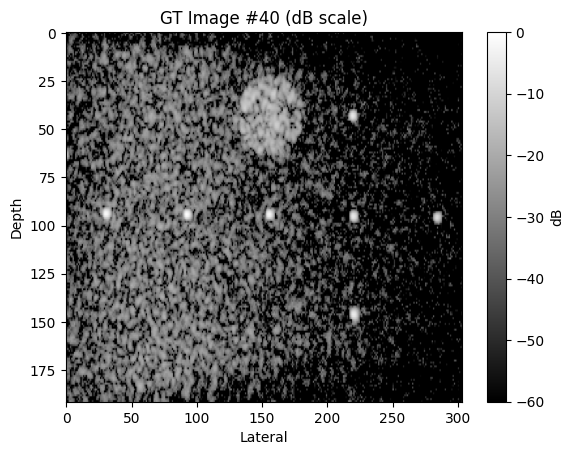

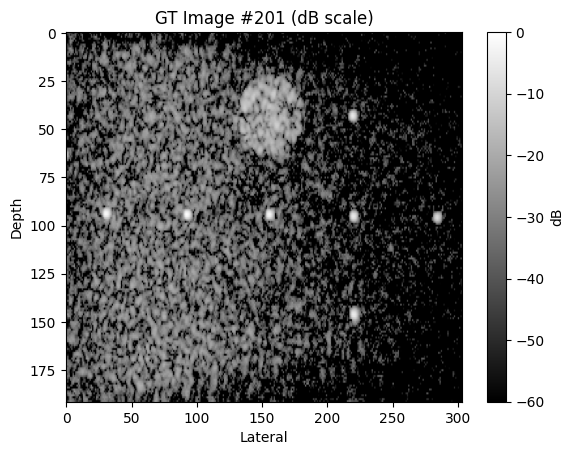


[AUG 2] — Showing two random GT samples:
 - Sample indices: 52, 161


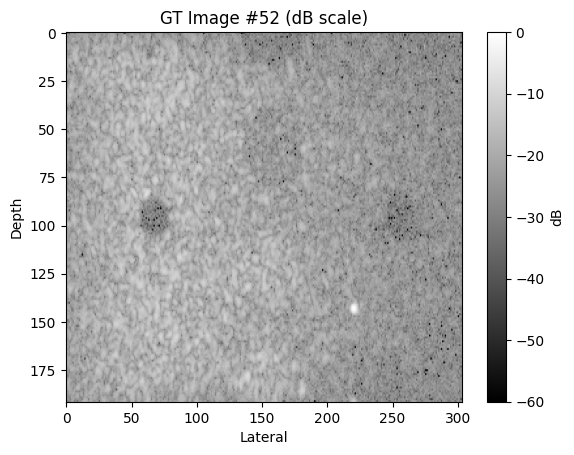

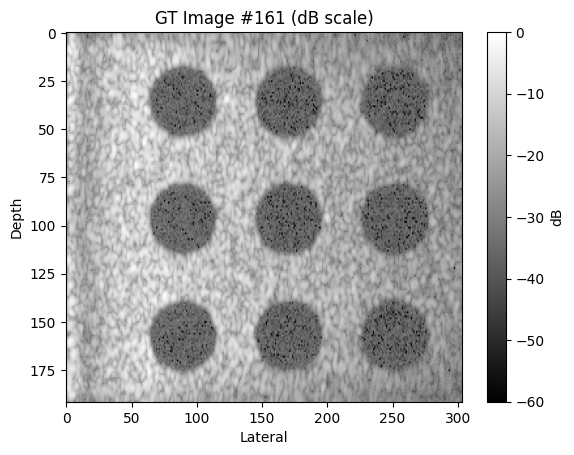


[AUG 3] — Showing two random GT samples:
 - Sample indices: 2, 34


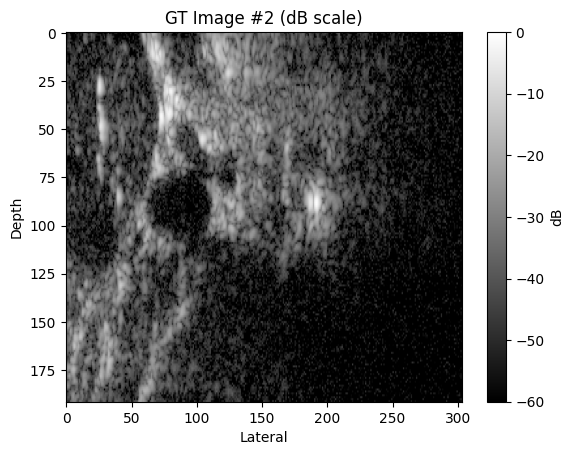

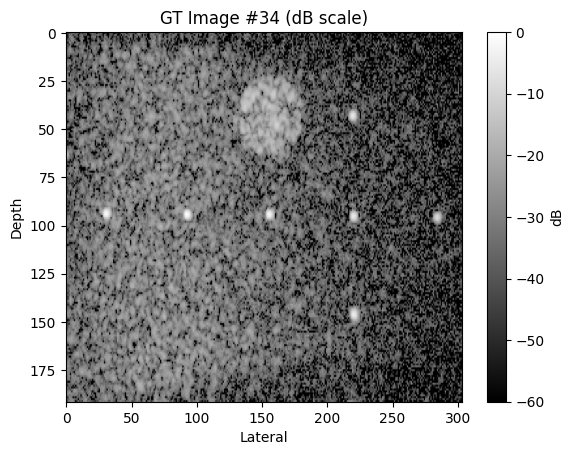


[AUG 4] — Showing two random GT samples:
 - Sample indices: 103, 4


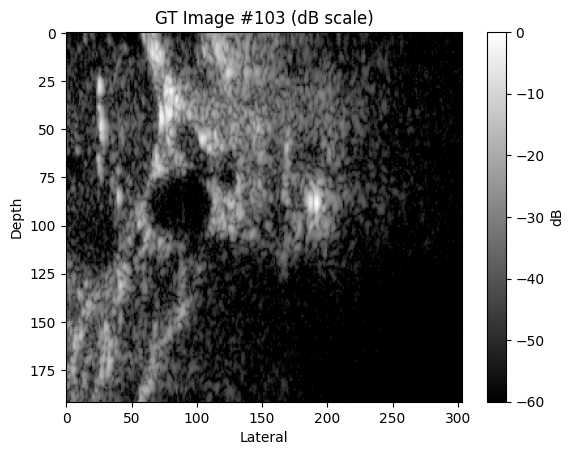

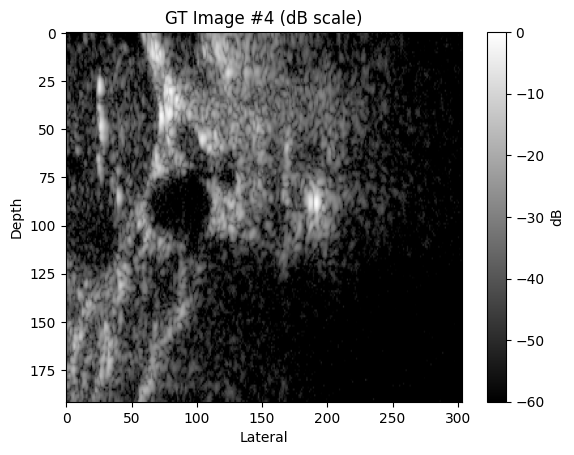


[AUG 5] — Showing two random GT samples:
 - Sample indices: 145, 60


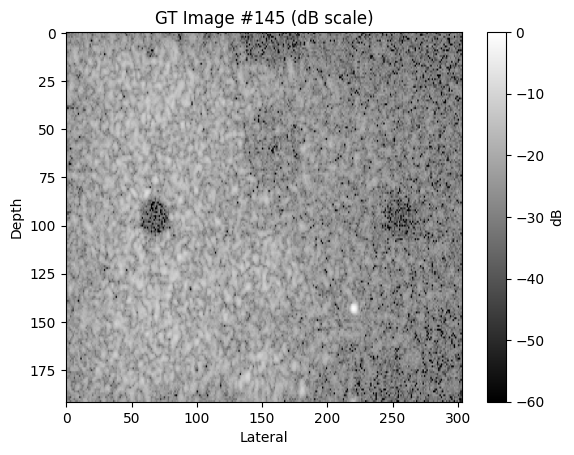

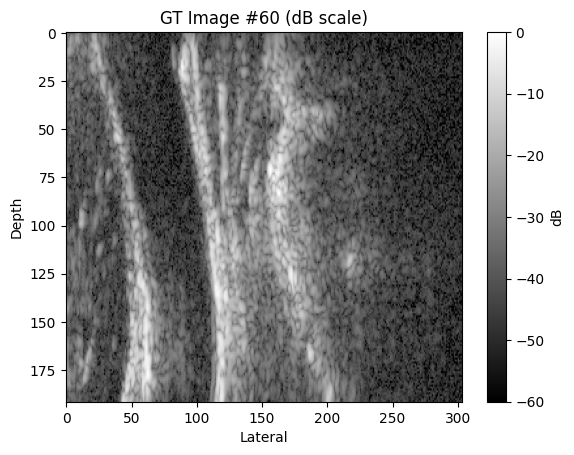

In [16]:
# === Sanity Check: Visualize 2 random GT images from each augmentation ===
for i, gt_aug in enumerate(gt_augmented_list):
    print(f"\n[AUG {i+1}] — Showing two random GT samples:")

    # Pick 2 random indices
    idx1, idx2 = random.sample(range(gt_aug.shape[0]), 2)

    print(f" - Sample indices: {idx1}, {idx2}")

    # Plot both
    visualize_gt_db(gt_aug.squeeze(1), idx1)
    visualize_gt_db(gt_aug.squeeze(1), idx2)


In [17]:
# === Create training datasets from augmented pairs ===
train_datasets = [
    TensorDataset(rf_augmented_list[i], gt_augmented_list[i])
    for i in range(NUM_AUGMENTED_SETS)
]

# Merge into a single large training dataset
train_full_ds = ConcatDataset(train_datasets)

# Validation and test sets (no augmentation)
val_ds  = TensorDataset(rf_val.unsqueeze(1), gt_val.unsqueeze(1))
test_ds = TensorDataset(rf_test.unsqueeze(1), gt_test.unsqueeze(1))


In [18]:
# === Sanity check ===
print("Final dataset sizes:")
for i, ds in enumerate(train_datasets):
    print(f" - Augmented set {i+1}: {len(ds)} samples")
print(f" - Combined train set: {len(train_full_ds)} samples")
print(f" - Validation set: {len(val_ds)} samples")
print(f" - Test set: {len(test_ds)} samples")


Final dataset sizes:
 - Augmented set 1: 225 samples
 - Augmented set 2: 225 samples
 - Augmented set 3: 225 samples
 - Augmented set 4: 225 samples
 - Augmented set 5: 225 samples
 - Combined train set: 1125 samples
 - Validation set: 112 samples
 - Test set: 113 samples


In [19]:
train_combined = ConcatDataset(train_datasets)

train_loader = DataLoader(train_combined, batch_size=CONFIG['batch_size'], shuffle=True)
val_loader   = DataLoader(val_ds, batch_size=CONFIG['batch_size'], shuffle=False)
test_loader  = DataLoader(test_ds, batch_size=CONFIG['batch_size'], shuffle=False)

# Check a single batch from each loader
train_batch = next(iter(train_loader))
val_batch   = next(iter(val_loader))
test_batch  = next(iter(test_loader))

for name, batch in zip(["Train", "Val", "Test"], [train_batch, val_batch, test_batch]):
    rf, gt = batch
    print(f"{name} RF shape: {rf.shape}, GT shape: {gt.shape}")


Train RF shape: torch.Size([16, 1, 1600, 128]), GT shape: torch.Size([16, 1, 192, 304])
Val RF shape: torch.Size([16, 1, 1600, 128]), GT shape: torch.Size([16, 1, 192, 304])
Test RF shape: torch.Size([16, 1, 1600, 128]), GT shape: torch.Size([16, 1, 192, 304])


## Model Architecture
Here we define the model architecture used for training.

In [20]:
import torch
import torch.nn as nn
import torch.nn.functional as F
from torchinfo import summary

# This model contains 1,047,577 trainable params and was the first one developed in the project
class ResidualConvBlock(nn.Module):
    def __init__(self, in_channels, out_channels, use_dropout=False, p=0.1):
        super().__init__()
        self.use_projection = in_channels != out_channels

        self.conv = nn.Sequential(
            nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1, bias=False),
            nn.BatchNorm2d(out_channels),
            nn.LeakyReLU(0.1, inplace=True)
        )
        self.dropout = nn.Dropout2d(p=p) if use_dropout else nn.Identity()
        self.proj = nn.Conv2d(in_channels, out_channels, kernel_size=1) if self.use_projection else nn.Identity()

    def forward(self, x):
        residual = self.proj(x)
        x = self.conv(x)
        x = self.dropout(x)
        return x + residual


class CustomUNet(nn.Module):
    def __init__(self, in_channels=1, base_channels=24):
        super().__init__()

        self.enc1 = ResidualConvBlock(in_channels, base_channels)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = ResidualConvBlock(base_channels, base_channels * 2)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = ResidualConvBlock(base_channels * 2, base_channels * 4)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = nn.Sequential(
            nn.Conv2d(base_channels * 4, base_channels * 8, kernel_size=3, padding=2, dilation=2),
            nn.BatchNorm2d(base_channels * 8),
            nn.LeakyReLU(0.1, inplace=True),
            nn.Conv2d(base_channels * 8, base_channels * 8, kernel_size=3, padding=2, dilation=2),
            nn.BatchNorm2d(base_channels * 8),
            nn.LeakyReLU(0.1, inplace=True)
        )

        self.up3 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(base_channels * 8, base_channels * 4, kernel_size=1)
        )
        self.dec3 = ResidualConvBlock(base_channels * 4 + base_channels * 4, base_channels * 4)

        self.up2 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(base_channels * 4, base_channels * 2, kernel_size=1)
        )
        self.dec2 = ResidualConvBlock(base_channels * 2 + base_channels * 2, base_channels * 2)

        self.up1 = nn.Sequential(
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(base_channels * 2, base_channels, kernel_size=1)
        )
        self.dec1 = ResidualConvBlock(base_channels + base_channels, base_channels)

        self.sharpen = nn.Sequential(
            nn.Conv2d(base_channels, base_channels, kernel_size=3, padding=1),
            nn.LeakyReLU(0.1, inplace=True),
        )
        self.final = nn.Conv2d(base_channels, 1, kernel_size=1)

    def forward(self, x):
        x1 = self.enc1(x)
        x2 = self.enc2(self.pool1(x1))
        x3 = self.enc3(self.pool2(x2))
        x_b = self.bottleneck(self.pool3(x3))

        d3 = self.dec3(torch.cat([self.up3(x_b), x3], dim=1))
        d2 = self.dec2(torch.cat([self.up2(d3), x2], dim=1))
        d1 = self.dec1(torch.cat([self.up1(d2), x1], dim=1))

        out = self.sharpen(d1)
        out = self.final(out)
        return out

In [21]:
# --- Sanity Test ---
model = CustomUNet(in_channels=1, base_channels=24)
model.eval()

dummy_input = torch.randn(1, 1, 1600, 128)
summary(model, input_size=(1, 1, 1600, 128))

Layer (type:depth-idx)                   Output Shape              Param #
CustomUNet                               [1, 1, 1600, 128]         --
├─ResidualConvBlock: 1-1                 [1, 24, 1600, 128]        --
│    └─Conv2d: 2-1                       [1, 24, 1600, 128]        48
│    └─Sequential: 2-2                   [1, 24, 1600, 128]        --
│    │    └─Conv2d: 3-1                  [1, 24, 1600, 128]        216
│    │    └─BatchNorm2d: 3-2             [1, 24, 1600, 128]        48
│    │    └─LeakyReLU: 3-3               [1, 24, 1600, 128]        --
│    │    └─Conv2d: 3-4                  [1, 24, 1600, 128]        5,184
│    │    └─BatchNorm2d: 3-5             [1, 24, 1600, 128]        48
│    │    └─LeakyReLU: 3-6               [1, 24, 1600, 128]        --
│    └─Identity: 2-3                     [1, 24, 1600, 128]        --
├─MaxPool2d: 1-2                         [1, 24, 800, 64]          --
├─ResidualConvBlock: 1-3                 [1, 48, 800, 64]          --
│    └─Conv

In [22]:
if CONFIG['model_name'] == 'unet':
    model = CustomUNet(in_channels=PW_PER_IMG, base_channels=24).to(CONFIG['device'])
elif CONFIG['model_name'] == 'effunet':
    model = CustomEfficientUNet(in_channels=PW_PER_IMG, base_channels=16).to(CONFIG['device'])

In [23]:
optimizer = torch.optim.Adam(model.parameters(), lr=5e-3)
# we changed the scheduler to be able to exit plateaus
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(
    optimizer,
    mode='min',
    factor=0.5,
    patience=5,
    min_lr=1e-5  # prevent it from going too low
)

In [24]:
# Instantiate loss objects if needed DONE
charbonnier = CharbonnierLoss()

# === Custom combined loss (edit freely in notebook) ===
def combined_loss(pred, target):
    loss_charb   = charbonnier(pred, target)
    loss_msssim  = ms_ssim_loss(pred, target)
    loss_fft     = fft_loss(pred, target)
    # loss_edge  = edge_loss(pred, target)

    return (
        0.45 * loss_charb +
        0.45 * loss_msssim +
        0.1 * loss_fft
        # + 0.20 * loss_edge
    ) # 0.45 charb, 0.50 msssim and 0.05 fft gave good results but a bit too smooth
    # 0.45 0.45 0.1 THE BEST

## Train and Validate Functions
Section for train_one_epoch and validate functions to make main training loop easier.

In [25]:
def min_max_normalize(tensor):
    """
    Min-max normalize each sample in the batch to [0, 1].
    Args:
        tensor (torch.Tensor): shape [B, 1, H, W]
    Returns:
        torch.Tensor: normalized tensor
    """
    min_val = tensor.amin(dim=(2, 3), keepdim=True)
    max_val = tensor.amax(dim=(2, 3), keepdim=True)
    return (tensor - min_val) / (max_val - min_val + 1e-8)


In [26]:
def train_one_epoch(model, loader, optimizer):
    model.train()
    epoch_loss = 0.0

    # Select loss function
    if CONFIG['loss_function'] == 'ssim':
        loss_fn = ssim_loss
    elif CONFIG['loss_function'] == 'mae':
        loss_fn = mae_loss
    elif CONFIG['loss_function'] == 'combined':
        loss_fn = combined_loss
    else:
        raise ValueError(f"Unknown loss function: {CONFIG['loss_function']}")

    print("\n===> Starting training epoch")
    print(f"Model is on device: {next(model.parameters()).device}")
    print(f"Loss function: {CONFIG['loss_function']}")
    print(f"Total batches: {len(loader)}")

    for batch_idx, (x, y) in enumerate(tqdm(loader)):
        print(f"\n--- Batch {batch_idx+1}/{len(loader)} ---")
        #print(f"Input shape: {x.shape}, Target shape: {y.shape}") this is fine

        x, y = x.to(CONFIG['device']), y.to(CONFIG['device'])

        if y.ndim == 3:
            y = y.unsqueeze(1)  # Ensure shape [B, 1, H, W]

        print(f"Raw target range: {y.min().item():.4f} to {y.max().item():.4f}")

        optimizer.zero_grad()
        y_pred = model(x)

        # Normalize both prediction and target to [0, 1] per batch
        y_pred = min_max_normalize(y_pred)
        y = min_max_normalize(y)
        print(f"Prediction shape before interpolation: {y_pred.shape}")
        print(f"Normalized prediction range: {y_pred.min().item():.4f} to {y_pred.max().item():.4f}")
        print(f"Normalized target range: {y.min().item():.4f} to {y.max().item():.4f}")

        # IMPORTANT
        # We need to perform bicubic interpolation before the loss is computed
        y_pred = F.interpolate(y_pred, size=(192, 304), mode='bicubic', align_corners=False)
        print(f"Prediction shape after interpolation: {y_pred.shape}")
        loss = loss_fn(y_pred, y)
        print(f"Loss value: {loss.item():.6f}")

        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

    avg_loss = epoch_loss / len(loader)
    print(f"\n===> Epoch finished. Avg loss: {avg_loss:.6f}")
    return avg_loss

In [27]:
def validate(model, loader):
    model.eval()
    val_loss = 0.0
    total_psnr = 0.0
    total_ssim = 0.0
    total_count = 0

    # Select loss function
    if CONFIG['loss_function'] == 'ssim':
        loss_fn = ssim_loss
    elif CONFIG['loss_function'] == 'mae':
        loss_fn = mae_loss
    elif CONFIG['loss_function'] == 'combined':
        loss_fn = combined_loss
    else:
        raise ValueError(f"Unknown loss function: {CONFIG['loss_function']}")

    print("\n===> Starting validation")
    print(f"Loss function: {CONFIG['loss_function']}")
    print(f"Total batches: {len(loader)}")

    with torch.no_grad():
        for batch_idx, (x, y) in enumerate(tqdm(loader, desc="Validating")):
            x, y = x.to(CONFIG['device']), y.to(CONFIG['device'])

            if y.ndim == 3:
                y = y.unsqueeze(1)  # Ensure shape [B, 1, H, W]

            y_pred = model(x)

            # Normalize predictions and targets per batch
            y_pred = min_max_normalize(y_pred)
            y = min_max_normalize(y)

            # IMPORTANT
            # We need to perform bicubic interpolation before the loss is computed
            y_pred = F.interpolate(y_pred, size=(192, 304), mode='bicubic', align_corners=False)

            loss = loss_fn(y_pred, y)
            val_loss += loss.item()

            # Convert to numpy for metric calculation
            preds = y_pred.detach().cpu().float().numpy()
            targets = y.detach().cpu().float().numpy()
            batch_size = preds.shape[0]
            total_count += batch_size

            for i in range(batch_size):
                pred_i = preds[i, 0]    # Remove channel dim: [1, H, W] → [H, W]
                target_i = targets[i, 0]

                psnr, ssim = compute_metrics(target_i, pred_i)
                total_psnr += psnr
                total_ssim += ssim

            print(f"Batch {batch_idx+1}/{len(loader)}: "
                  f"Loss={loss.item():.6f}, "
                  f"PSNR≈{psnr:.2f}, SSIM≈{ssim:.4f}")

    avg_loss = val_loss / len(loader)
    avg_psnr = total_psnr / total_count
    avg_ssim = total_ssim / total_count

    print(f"\n===> Validation finished. Avg Loss: {avg_loss:.6f}, "
          f"Avg PSNR: {avg_psnr:.2f}, Avg SSIM: {avg_ssim:.4f}")

    return avg_loss, avg_psnr, avg_ssim

## Model Training
In this part we set up the training loop, train the model and then save the parameters of the final one.

Training:   0%|          | 0/200 [00:00<?, ?it/s]


===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 1.053054



  1%|▏         | 1/71 [00:04<04:48,  4.12s/it]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.956173



  3%|▎         | 2/71 [00:04<02:32,  2.21s/it]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.755695



  4%|▍         | 3/71 [00:05<01:48,  1.59s/it]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.808666



  6%|▌         | 4/71 [00:06<01:27,  1.31s/it]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.953509



  7%|▋         | 5/71 [00:07<01:15,  1.14s/it]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.849166



  8%|▊         | 6/71 [00:08<01:08,  1.05s/it]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.942979



 10%|▉         | 7/71 [00:09<01:03,  1.01it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.973071



 11%|█▏        | 8/71 [00:10<00:59,  1.06it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690003



 13%|█▎        | 9/71 [00:11<00:57,  1.09it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.808595



 14%|█▍        | 10/71 [00:11<00:55,  1.11it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.862320



 15%|█▌        | 11/71 [00:12<00:53,  1.12it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.876110



 17%|█▋        | 12/71 [00:13<00:52,  1.13it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.773849



 18%|█▊        | 13/71 [00:14<00:50,  1.14it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799612



 20%|█▉        | 14/71 [00:15<00:49,  1.14it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.871116



 21%|██        | 15/71 [00:16<00:48,  1.14it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.786959



 23%|██▎       | 16/71 [00:17<00:47,  1.15it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598612



 24%|██▍       | 17/71 [00:17<00:46,  1.15it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644484



 25%|██▌       | 18/71 [00:18<00:46,  1.15it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.991069



 27%|██▋       | 19/71 [00:19<00:45,  1.14it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.666292



 28%|██▊       | 20/71 [00:20<00:44,  1.14it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698641



 30%|██▉       | 21/71 [00:21<00:43,  1.14it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.633087



 31%|███       | 22/71 [00:22<00:42,  1.15it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.773244



 32%|███▏      | 23/71 [00:23<00:41,  1.15it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709874



 34%|███▍      | 24/71 [00:24<00:40,  1.15it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714048



 35%|███▌      | 25/71 [00:24<00:40,  1.15it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.715640



 37%|███▋      | 26/71 [00:25<00:39,  1.15it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.791119



 38%|███▊      | 27/71 [00:26<00:38,  1.15it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.706942



 39%|███▉      | 28/71 [00:27<00:37,  1.14it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.786976



 41%|████      | 29/71 [00:28<00:36,  1.14it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.726975



 42%|████▏     | 30/71 [00:29<00:36,  1.14it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.732159



 44%|████▎     | 31/71 [00:30<00:35,  1.14it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.857810



 45%|████▌     | 32/71 [00:31<00:34,  1.14it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.787239



 46%|████▋     | 33/71 [00:31<00:33,  1.14it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.842507



 48%|████▊     | 34/71 [00:32<00:32,  1.14it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833390



 49%|████▉     | 35/71 [00:33<00:31,  1.14it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.669336



 51%|█████     | 36/71 [00:34<00:30,  1.14it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.770390



 52%|█████▏    | 37/71 [00:35<00:29,  1.14it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.939934



 54%|█████▎    | 38/71 [00:36<00:29,  1.14it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.726572



 55%|█████▍    | 39/71 [00:37<00:28,  1.13it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.984774



 56%|█████▋    | 40/71 [00:38<00:27,  1.13it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.795363



 58%|█████▊    | 41/71 [00:39<00:26,  1.13it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.794831



 59%|█████▉    | 42/71 [00:39<00:25,  1.13it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.736960



 61%|██████    | 43/71 [00:40<00:24,  1.13it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.936975



 62%|██████▏   | 44/71 [00:41<00:23,  1.13it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.883283



 63%|██████▎   | 45/71 [00:42<00:23,  1.13it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.743803



 65%|██████▍   | 46/71 [00:43<00:22,  1.13it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646667



 66%|██████▌   | 47/71 [00:44<00:21,  1.12it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734382



 68%|██████▊   | 48/71 [00:45<00:20,  1.12it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653291



 69%|██████▉   | 49/71 [00:46<00:19,  1.12it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.674653



 70%|███████   | 50/71 [00:47<00:18,  1.12it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.845652



 72%|███████▏  | 51/71 [00:47<00:17,  1.12it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.692311



 73%|███████▎  | 52/71 [00:48<00:16,  1.12it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.960402



 75%|███████▍  | 53/71 [00:49<00:16,  1.12it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.820386



 76%|███████▌  | 54/71 [00:50<00:15,  1.12it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.763808



 77%|███████▋  | 55/71 [00:51<00:14,  1.12it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615597



 79%|███████▉  | 56/71 [00:52<00:13,  1.12it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.636771



 80%|████████  | 57/71 [00:53<00:12,  1.12it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696374



 82%|████████▏ | 58/71 [00:54<00:11,  1.12it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.876538



 83%|████████▎ | 59/71 [00:55<00:10,  1.11it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721896



 85%|████████▍ | 60/71 [00:55<00:09,  1.12it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.873377



 86%|████████▌ | 61/71 [00:56<00:08,  1.12it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.717216



 87%|████████▋ | 62/71 [00:57<00:08,  1.12it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.751457



 89%|████████▊ | 63/71 [00:58<00:07,  1.12it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.787318



 90%|█████████ | 64/71 [00:59<00:06,  1.12it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.779481



 92%|█████████▏| 65/71 [01:00<00:05,  1.11it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733188



 93%|█████████▎| 66/71 [01:01<00:04,  1.11it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.860177



 94%|█████████▍| 67/71 [01:02<00:03,  1.11it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.749686



 96%|█████████▌| 68/71 [01:03<00:02,  1.11it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655464



 97%|█████████▋| 69/71 [01:04<00:01,  1.11it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646002



 99%|█████████▊| 70/71 [01:04<00:00,  1.11it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])


Loss value: 0.480868


100%|██████████| 71/71 [01:06<00:00,  1.07it/s]



===> Epoch finished. Avg loss: 0.779242

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.720850, PSNR≈18.68, SSIM≈0.2088



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.532625, PSNR≈30.65, SSIM≈0.7788



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.714318, PSNR≈23.30, SSIM≈0.4296



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.83it/s]

Batch 4/7: Loss=0.609955, PSNR≈18.19, SSIM≈0.2219



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.659946, PSNR≈28.05, SSIM≈0.6028



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.96it/s]

Batch 6/7: Loss=0.587129, PSNR≈28.26, SSIM≈0.5622



Training:   0%|          | 1/200 [01:08<3:48:22, 68.86s/it]

Batch 7/7: Loss=0.707965, PSNR≈31.29, SSIM≈0.6382

===> Validation finished. Avg Loss: 0.647541, Avg PSNR: 25.88, Avg SSIM: 0.4600
🔁 Learning Rate for next epoch: 0.005000
Epoch 1/200 | Train: 0.7792 | Val: 0.6475 | PSNR: 25.88 | SSIM: 0.4600
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.845687



  1%|▏         | 1/71 [00:00<01:03,  1.11it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.712037



  3%|▎         | 2/71 [00:01<01:02,  1.11it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694250



  4%|▍         | 3/71 [00:02<01:01,  1.11it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.816875



  6%|▌         | 4/71 [00:03<01:00,  1.10it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.736515



  7%|▋         | 5/71 [00:04<00:59,  1.11it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.878773



  8%|▊         | 6/71 [00:05<00:58,  1.10it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766089



 10%|▉         | 7/71 [00:06<00:57,  1.10it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.980534



 11%|█▏        | 8/71 [00:07<00:57,  1.10it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656509



 13%|█▎        | 9/71 [00:08<00:56,  1.10it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742028



 14%|█▍        | 10/71 [00:09<00:55,  1.10it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.796079



 15%|█▌        | 11/71 [00:09<00:54,  1.10it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.867651



 17%|█▋        | 12/71 [00:10<00:53,  1.09it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.796867



 18%|█▊        | 13/71 [00:11<00:52,  1.09it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591578



 20%|█▉        | 14/71 [00:12<00:52,  1.09it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694080



 21%|██        | 15/71 [00:13<00:51,  1.09it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.763664



 23%|██▎       | 16/71 [00:14<00:50,  1.09it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681746



 24%|██▍       | 17/71 [00:15<00:49,  1.09it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.749105



 25%|██▌       | 18/71 [00:16<00:48,  1.09it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.924435



 27%|██▋       | 19/71 [00:17<00:47,  1.09it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689181



 28%|██▊       | 20/71 [00:18<00:46,  1.09it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.757443



 30%|██▉       | 21/71 [00:19<00:45,  1.09it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699822



 31%|███       | 22/71 [00:20<00:45,  1.09it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629322



 32%|███▏      | 23/71 [00:20<00:44,  1.09it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541891



 34%|███▍      | 24/71 [00:21<00:43,  1.09it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677211



 35%|███▌      | 25/71 [00:22<00:42,  1.09it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752536



 37%|███▋      | 26/71 [00:23<00:41,  1.09it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612224



 38%|███▊      | 27/71 [00:24<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.855716



 39%|███▉      | 28/71 [00:25<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775932



 41%|████      | 29/71 [00:26<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691424



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679170



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.796489



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620779



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.916494



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784463



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.899161



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720590



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585391



 54%|█████▎    | 38/71 [00:34<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.869976



 55%|█████▍    | 39/71 [00:35<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.751553



 56%|█████▋    | 40/71 [00:36<00:29,  1.06it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.748722



 58%|█████▊    | 41/71 [00:37<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.777227



 59%|█████▉    | 42/71 [00:38<00:27,  1.06it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.939104



 61%|██████    | 43/71 [00:39<00:26,  1.06it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.806468



 62%|██████▏   | 44/71 [00:40<00:25,  1.06it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.726987



 63%|██████▎   | 45/71 [00:41<00:24,  1.06it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698685



 65%|██████▍   | 46/71 [00:42<00:23,  1.06it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.804804



 66%|██████▌   | 47/71 [00:43<00:22,  1.06it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639477



 68%|██████▊   | 48/71 [00:44<00:21,  1.06it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735130



 69%|██████▉   | 49/71 [00:45<00:20,  1.06it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709118



 70%|███████   | 50/71 [00:46<00:19,  1.06it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.645972



 72%|███████▏  | 51/71 [00:47<00:18,  1.06it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.614437



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513519



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.849750



 76%|███████▌  | 54/71 [00:49<00:15,  1.06it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.852063



 77%|███████▋  | 55/71 [00:50<00:15,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.770021



 79%|███████▉  | 56/71 [00:51<00:14,  1.06it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.888553



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689463



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.809704



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626117



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.834570



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.860856



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673461



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.747386



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.732776



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714909



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.683571



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621451



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.869220



 97%|█████████▋| 69/71 [01:03<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703629



 99%|█████████▊| 70/71 [01:04<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2487
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.870875



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.748722

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.11it/s]

Batch 1/7: Loss=0.708695, PSNR≈18.48, SSIM≈0.2225



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.09it/s]

Batch 2/7: Loss=0.521502, PSNR≈30.61, SSIM≈0.7410



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.08it/s]

Batch 3/7: Loss=0.710093, PSNR≈23.04, SSIM≈0.5505



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.11it/s]

Batch 4/7: Loss=0.604375, PSNR≈17.08, SSIM≈0.2230



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.09it/s]

Batch 5/7: Loss=0.632917, PSNR≈27.99, SSIM≈0.6662



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.09it/s]

Batch 6/7: Loss=0.582071, PSNR≈30.04, SSIM≈0.6461



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]

Batch 7/7: Loss=0.694914, PSNR≈31.23, SSIM≈0.5516

===> Validation finished. Avg Loss: 0.636367, Avg PSNR: 26.34, Avg SSIM: 0.4887
🔁 Learning Rate for next epoch: 0.005000
Epoch 2/200 | Train: 0.7487 | Val: 0.6364 | PSNR: 26.34 | SSIM: 0.4887
torch.Size([16, 1, 1600, 128])


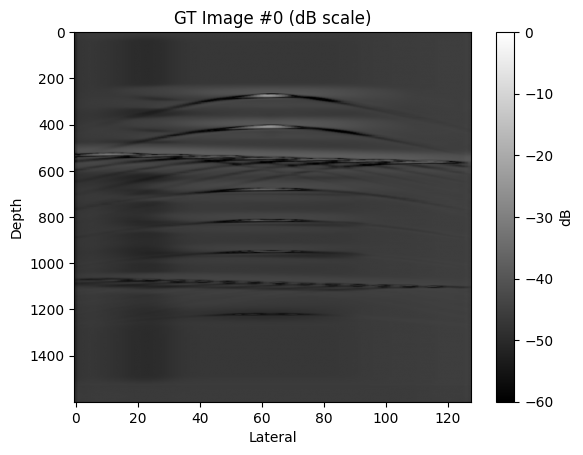

Training:   1%|          | 2/200 [02:16<3:45:38, 68.38s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728139



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.758072



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.669017



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815375



  6%|▌         | 4/71 [00:03<01:01,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.823389



  7%|▋         | 5/71 [00:04<01:00,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.812926



  8%|▊         | 6/71 [00:05<00:59,  1.09it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.804495



 10%|▉         | 7/71 [00:06<00:58,  1.09it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.809236



 11%|█▏        | 8/71 [00:07<00:58,  1.09it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486022



 13%|█▎        | 9/71 [00:08<00:57,  1.09it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.896038



 14%|█▍        | 10/71 [00:09<00:56,  1.09it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626507



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.834871



 17%|█▋        | 12/71 [00:11<00:54,  1.09it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649688



 18%|█▊        | 13/71 [00:11<00:53,  1.09it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.759547



 20%|█▉        | 14/71 [00:12<00:52,  1.09it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635237



 21%|██        | 15/71 [00:13<00:51,  1.09it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.800369



 23%|██▎       | 16/71 [00:14<00:50,  1.09it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681619



 24%|██▍       | 17/71 [00:15<00:49,  1.09it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.898313



 25%|██▌       | 18/71 [00:16<00:48,  1.09it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499480



 27%|██▋       | 19/71 [00:17<00:47,  1.09it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.785107



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655283



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.822771



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833660



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.875831



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689657



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.834408



 37%|███▋      | 26/71 [00:23<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596038



 38%|███▊      | 27/71 [00:24<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.727208



 39%|███▉      | 28/71 [00:25<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.666233



 41%|████      | 29/71 [00:26<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690240



 42%|████▏     | 30/71 [00:27<00:37,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596941



 44%|████▎     | 31/71 [00:28<00:36,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.730339



 45%|████▌     | 32/71 [00:29<00:35,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697788



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.693713



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.832624



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.808959



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.717414



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672171



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560390



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.781799



 56%|█████▋    | 40/71 [00:36<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697043



 58%|█████▊    | 41/71 [00:37<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600619



 59%|█████▉    | 42/71 [00:38<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734706



 61%|██████    | 43/71 [00:39<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628100



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.785401



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688033



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.865457



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.717325



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.758237



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583043



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711326



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.827012



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699245



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.839670



 76%|███████▌  | 54/71 [00:49<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.798055



 77%|███████▋  | 55/71 [00:50<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.763332



 79%|███████▉  | 56/71 [00:51<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.910063



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.637916



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735954



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672044



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.627250



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.992860



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658936



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626160



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728212



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.747905



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 1.003905



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.807277



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.756499



 97%|█████████▋| 69/71 [01:03<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.746098



 99%|█████████▊| 70/71 [01:04<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.507675



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.733976

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.12it/s]

Batch 1/7: Loss=0.691228, PSNR≈19.36, SSIM≈0.2152



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.08it/s]

Batch 2/7: Loss=0.515101, PSNR≈30.81, SSIM≈0.7655



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.04it/s]

Batch 3/7: Loss=0.697345, PSNR≈23.28, SSIM≈0.4788



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.591135, PSNR≈17.23, SSIM≈0.2243



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.625275, PSNR≈27.70, SSIM≈0.4279



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.01it/s]

Batch 6/7: Loss=0.566701, PSNR≈30.80, SSIM≈0.7304



Training:   2%|▏         | 3/200 [03:24<3:43:15, 68.00s/it]

Batch 7/7: Loss=0.679558, PSNR≈31.06, SSIM≈0.4535

===> Validation finished. Avg Loss: 0.623763, Avg PSNR: 26.73, Avg SSIM: 0.5008
🔁 Learning Rate for next epoch: 0.005000
Epoch 3/200 | Train: 0.7340 | Val: 0.6238 | PSNR: 26.73 | SSIM: 0.5008
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.764677



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.692199



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616213



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733844



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734820



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833906



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.759434



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697876



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507268



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.952816



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.910961



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742580



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578938



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.906777



 20%|█▉        | 14/71 [00:12<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.811472



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762882



 23%|██▎       | 16/71 [00:14<00:50,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.593967



 24%|██▍       | 17/71 [00:15<00:49,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.931018



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632275



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630974



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.723264



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.755630



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799746



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.717932



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.757104



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.941020



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525677



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609816



 39%|███▉      | 28/71 [00:25<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722889



 41%|████      | 29/71 [00:26<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.845733



 42%|████▏     | 30/71 [00:27<00:37,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.942785



 44%|████▎     | 31/71 [00:28<00:36,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606607



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592643



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.737090



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670114



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654620



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699668



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.865122



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.877430



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665967



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.751273



 58%|█████▊    | 41/71 [00:37<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.781570



 59%|█████▉    | 42/71 [00:38<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679052



 61%|██████    | 43/71 [00:39<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.903416



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.804926



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752864



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780190



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.680922



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.991521



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664687



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.719555



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.631797



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.795406



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649790



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.770942



 77%|███████▋  | 55/71 [00:50<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.627614



 79%|███████▉  | 56/71 [00:51<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574862



 80%|████████  | 57/71 [00:52<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646016



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603407



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742720



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629924



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652807



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.760780



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.686389



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.798703



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.872633



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641176



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.667919



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655683



 97%|█████████▋| 69/71 [01:03<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696103



 99%|█████████▊| 70/71 [01:04<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.734933



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.730357

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.04it/s]

Batch 1/7: Loss=0.690855, PSNR≈16.16, SSIM≈0.1733



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.06it/s]

Batch 2/7: Loss=0.510468, PSNR≈30.78, SSIM≈0.7775



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.02it/s]

Batch 3/7: Loss=0.701937, PSNR≈23.34, SSIM≈0.4623



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.00it/s]

Batch 4/7: Loss=0.594737, PSNR≈17.00, SSIM≈0.2213



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.636524, PSNR≈28.06, SSIM≈0.5962



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.07it/s]

Batch 6/7: Loss=0.568837, PSNR≈26.21, SSIM≈0.4831



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

Batch 7/7: Loss=0.679273, PSNR≈31.53, SSIM≈0.8453

===> Validation finished. Avg Loss: 0.626090, Avg PSNR: 26.18, Avg SSIM: 0.5469
🔁 Learning Rate for next epoch: 0.005000
Epoch 4/200 | Train: 0.7304 | Val: 0.6261 | PSNR: 26.18 | SSIM: 0.5469
torch.Size([16, 1, 1600, 128])


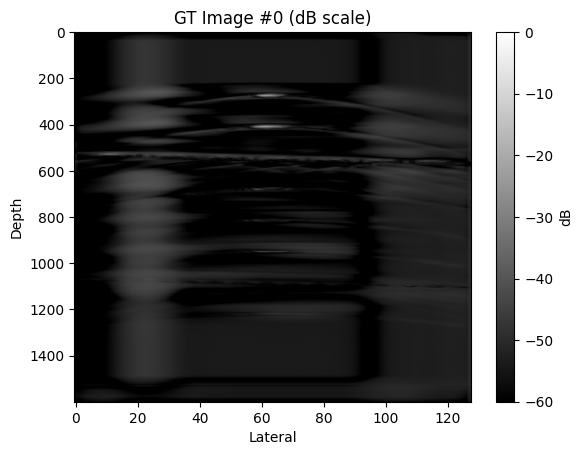

Training:   2%|▏         | 4/200 [04:32<3:42:09, 68.01s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689588



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.817878



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696944



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.942761



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.856154



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679438



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688399



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766516



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3685
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771705



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521520



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.745085



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648672



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705227



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673979



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703543



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612030



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.879099



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720842



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.890181



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.712226



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604052



 30%|██▉       | 21/71 [00:19<00:46,  1.06it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.731440



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.783383



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606439



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.782568



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685330



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.737619



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.669198



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558803



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655345



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677728



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775455



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.675575



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714450



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.636253



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.701836



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.765626



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587405



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527187



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720102



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.746897



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.724705



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630687



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.704094



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.732777



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.845196



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734091



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.659762



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681050



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.811476



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622965



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.861768



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.662744



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646942



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.725259



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762964



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784091



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.708059



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.767808



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.738275



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.836660



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833479



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.875749



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703307



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733974



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670112



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.707365



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655342



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.841900



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639139



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 1.012378



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.723642

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.09it/s]

Batch 1/7: Loss=0.683658, PSNR≈19.68, SSIM≈0.2206



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.04it/s]

Batch 2/7: Loss=0.507198, PSNR≈30.74, SSIM≈0.7462



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.03it/s]

Batch 3/7: Loss=0.692855, PSNR≈22.93, SSIM≈0.6208



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.590642, PSNR≈16.94, SSIM≈0.2271



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.03it/s]

Batch 5/7: Loss=0.619644, PSNR≈28.08, SSIM≈0.5850



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.06it/s]

Batch 6/7: Loss=0.563727, PSNR≈30.67, SSIM≈0.7567



Training:   2%|▎         | 5/200 [05:40<3:40:57, 67.99s/it]

Batch 7/7: Loss=0.672542, PSNR≈31.54, SSIM≈0.8792

===> Validation finished. Avg Loss: 0.618610, Avg PSNR: 26.87, Avg SSIM: 0.5800
🔁 Learning Rate for next epoch: 0.005000
Epoch 5/200 | Train: 0.7236 | Val: 0.6186 | PSNR: 26.87 | SSIM: 0.5800
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.797388



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.795444



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602143



  4%|▍         | 3/71 [00:02<01:04,  1.06it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.887365



  6%|▌         | 4/71 [00:03<01:03,  1.06it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721139



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.842804



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799835



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.702863



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.645225



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.866661



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.822957



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780137



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638896



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711626



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711174



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.680540



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.879273



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.803882



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.816191



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562411



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.608268



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.818495



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.599524



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815389



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.795258



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.753541



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699704



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.898453



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694149



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.680834



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.862525



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696274



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.798274



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632082



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734719



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.667019



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658447



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649202



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668239



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.853178



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.748696



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728626



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649721



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626900



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728145



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681961



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687521



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610423



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588059



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815070



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585824



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762881



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.911380



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780015



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677151



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632007



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.738422



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784165



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690706



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516927



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.778802



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.801006



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649074



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610080



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.872752



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.724810



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603608



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525989



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703793



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564976



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.972864



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.723998

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.13it/s]

Batch 1/7: Loss=0.693794, PSNR≈17.47, SSIM≈0.1860



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.521647, PSNR≈30.79, SSIM≈0.7789



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.706876, PSNR≈23.35, SSIM≈0.4572



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.611370, PSNR≈17.64, SSIM≈0.2362



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.87it/s]

Batch 5/7: Loss=0.636244, PSNR≈28.05, SSIM≈0.5930



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.579315, PSNR≈27.54, SSIM≈0.5437



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]

Batch 7/7: Loss=0.685623, PSNR≈31.37, SSIM≈0.6545

===> Validation finished. Avg Loss: 0.633553, Avg PSNR: 25.98, Avg SSIM: 0.4911
🔁 Learning Rate for next epoch: 0.005000
Epoch 6/200 | Train: 0.7240 | Val: 0.6336 | PSNR: 25.98 | SSIM: 0.4911
torch.Size([16, 1, 1600, 128])


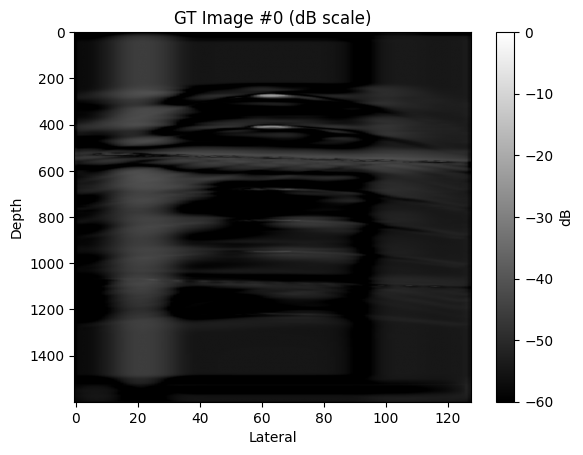

Training:   3%|▎         | 6/200 [06:49<3:40:28, 68.19s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.624377



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628608



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.879267



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677852



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582537



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.768834



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.625541



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.741551



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722796



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815250



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576045



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.857371



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722455



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622436



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.928597



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.819125



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.804916



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592820



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697779



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784293



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752029



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.741007



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621921



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648855



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.794553



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.748026



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638018



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.777827



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.879266



 41%|████      | 29/71 [00:26<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671320



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728216



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762826



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.867000



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592232



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.901810



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833824



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784811



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.684402



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.795530



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600085



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641248



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587339



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.738721



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.704619



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.805595



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.724032



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628327



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.674022



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671594



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.716031



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.812418



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685112



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.676636



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647128



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.831251



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766107



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752878



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.765039



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.755798



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699595



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688856



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722337



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735057



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697379



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592383



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565983



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.500412



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695607



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604114



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.939513



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.531440



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.716234

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.687306, PSNR≈18.65, SSIM≈0.2121



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.512084, PSNR≈29.35, SSIM≈0.6256



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.695803, PSNR≈23.25, SSIM≈0.3319



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.598705, PSNR≈18.68, SSIM≈0.2411



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.87it/s]

Batch 5/7: Loss=0.624441, PSNR≈28.07, SSIM≈0.5607



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.573611, PSNR≈23.79, SSIM≈0.4220



Training:   4%|▎         | 7/200 [07:56<3:38:54, 68.06s/it]

Batch 7/7: Loss=0.675554, PSNR≈31.37, SSIM≈0.6494

===> Validation finished. Avg Loss: 0.623929, Avg PSNR: 25.96, Avg SSIM: 0.4709
🔁 Learning Rate for next epoch: 0.005000
Epoch 7/200 | Train: 0.7162 | Val: 0.6239 | PSNR: 25.96 | SSIM: 0.4709
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711646



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775213



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.907328



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652308



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780452



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.686812



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733774



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.842485



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.737519



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570488



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681406



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606787



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713129



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618012



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665218



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733009



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721567



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742224



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695032



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568099



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565743



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766868



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.810301



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.798876



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720110



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.667599



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639540



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.849471



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.756374



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.633377



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.716335



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780314



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.744221



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.724916



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.839248



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766643



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762180



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587742



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672483



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703906



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679806



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711321



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545933



 61%|██████    | 43/71 [00:39<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582393



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555077



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.789348



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.755198



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691334



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630015



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653994



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609424



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.657500



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.852752



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516437



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.785474



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668571



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578814



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734273



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634204



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.684602



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.718373



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.855120



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734122



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.708668



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.782477



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.820181



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629284



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.684383



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.858796



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735902



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.733901



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.707415

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.80it/s]

Batch 1/7: Loss=0.671507, PSNR≈19.30, SSIM≈0.2359



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.509769, PSNR≈30.97, SSIM≈0.7270



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.99it/s]

Batch 3/7: Loss=0.681648, PSNR≈23.36, SSIM≈0.4774



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.02it/s]

Batch 4/7: Loss=0.597941, PSNR≈17.07, SSIM≈0.2329



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.610094, PSNR≈28.13, SSIM≈0.6073



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.557665, PSNR≈30.15, SSIM≈0.6592



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]

Batch 7/7: Loss=0.660017, PSNR≈31.54, SSIM≈0.8909

===> Validation finished. Avg Loss: 0.612663, Avg PSNR: 26.67, Avg SSIM: 0.5852
🔁 Learning Rate for next epoch: 0.005000
Epoch 8/200 | Train: 0.7074 | Val: 0.6127 | PSNR: 26.67 | SSIM: 0.5852
torch.Size([16, 1, 1600, 128])


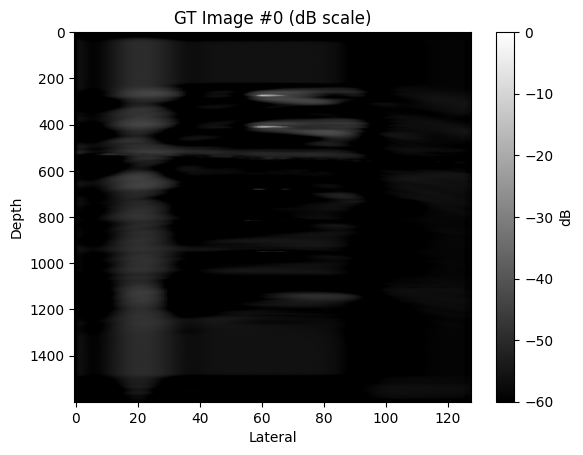

Training:   4%|▍         | 8/200 [09:05<3:37:58, 68.12s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576822



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762227



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.727034



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650213



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621504



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679794



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673330



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622243



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.676789



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521599



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685467



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.750545



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.669792



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638564



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.841670



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.774935



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.773537



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734335



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784939



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721067



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621563



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.710860



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.730846



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799297



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672657



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.731798



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525446



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.757321



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695777



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695707



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.781257



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.678484



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541073



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728413



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672794



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617136



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.790580



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.790723



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613321



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.881840



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.718527



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681562



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735966



 61%|██████    | 43/71 [00:39<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.818297



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.700070



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.660140



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.770176



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735053



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.739823



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714181



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658969



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.782707



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.693736



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.723014



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703860



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.567511



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.743968



 80%|████████  | 57/71 [00:52<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688064



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771338



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703007



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.631079



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575929



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552269



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609847



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629430



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740766



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.809355



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685491



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.774421



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647804



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.647689



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.697709

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.13it/s]

Batch 1/7: Loss=0.673297, PSNR≈19.83, SSIM≈0.2740



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.10it/s]

Batch 2/7: Loss=0.506753, PSNR≈30.57, SSIM≈0.7431



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.10it/s]

Batch 3/7: Loss=0.686308, PSNR≈23.24, SSIM≈0.5563



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.10it/s]

Batch 4/7: Loss=0.599350, PSNR≈16.81, SSIM≈0.2448



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.10it/s]

Batch 5/7: Loss=0.613711, PSNR≈28.15, SSIM≈0.6829



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.10it/s]

Batch 6/7: Loss=0.563706, PSNR≈30.12, SSIM≈0.7533



Training:   4%|▍         | 9/200 [10:12<3:36:20, 67.96s/it]

Batch 7/7: Loss=0.657727, PSNR≈31.53, SSIM≈0.9107

===> Validation finished. Avg Loss: 0.614407, Avg PSNR: 26.56, Avg SSIM: 0.6066
🔁 Learning Rate for next epoch: 0.005000
Epoch 9/200 | Train: 0.6977 | Val: 0.6144 | PSNR: 26.56 | SSIM: 0.6066
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.710320



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.881684



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576671



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549325



  6%|▌         | 4/71 [00:03<01:01,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.675217



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815079



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656559



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.857361



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.725110



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.563177



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.700185



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607025



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552320



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591042



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.875981



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.750882



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771703



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.743163



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.770657



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634312



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535538



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.747878



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583060



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.793250



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766505



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.712751



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714070



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.838951



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.908294



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641494



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.759406



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670777



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.660471



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.855583



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664645



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626013



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.816684



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.806397



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620044



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.745263



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.788042



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607622



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665349



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.730145



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690612



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573081



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.693620



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.727682



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547940



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740356



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705728



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537896



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478544



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.814165



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733490



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687735



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540406



 80%|████████  | 57/71 [00:52<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752306



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.701409



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.633507



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714945



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771971



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722380



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.756508



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.727140



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539525



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615406



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.700929



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.715471



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714578



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.650899



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.696539

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.12it/s]

Batch 1/7: Loss=0.669478, PSNR≈18.78, SSIM≈0.2681



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.10it/s]

Batch 2/7: Loss=0.508558, PSNR≈27.31, SSIM≈0.6179



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.09it/s]

Batch 3/7: Loss=0.682554, PSNR≈23.18, SSIM≈0.3538



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.10it/s]

Batch 4/7: Loss=0.578352, PSNR≈18.57, SSIM≈0.2563



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.10it/s]

Batch 5/7: Loss=0.610680, PSNR≈28.03, SSIM≈0.7331



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.10it/s]

Batch 6/7: Loss=0.558653, PSNR≈26.57, SSIM≈0.5722



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.09it/s]

Batch 7/7: Loss=0.662109, PSNR≈31.54, SSIM≈0.8955

===> Validation finished. Avg Loss: 0.610055, Avg PSNR: 26.61, Avg SSIM: 0.5707
🔁 Learning Rate for next epoch: 0.005000
Epoch 10/200 | Train: 0.6965 | Val: 0.6101 | PSNR: 26.61 | SSIM: 0.5707
torch.Size([16, 1, 1600, 128])


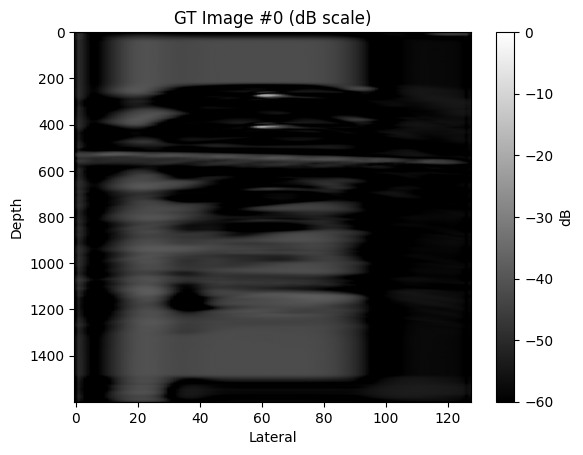

Training:   5%|▌         | 10/200 [11:20<3:35:25, 68.03s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.765348



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.708555



  3%|▎         | 2/71 [00:01<01:03,  1.09it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.811392



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615854



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.675252



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679404



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685228



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.745027



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654857



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.756581



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596417



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592675



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587231



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.741278



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.702552



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705360



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629864



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742823



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.792174



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.820537



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618944



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.787505



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510402



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.785640



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650099



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.877089



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.778290



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553790



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653717



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.669134



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728986



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.692577



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690832



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.640978



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583387



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705766



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.791392



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632638



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672954



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.712551



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.779450



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721682



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.645120



 61%|██████    | 43/71 [00:39<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.715052



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651807



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592280



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699686



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.772202



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.683223



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582839



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.758628



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665847



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649383



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.805421



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.967318



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652295



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695335



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.921829



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677398



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.586874



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443975



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.760160



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.819064



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649678



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591373



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.765117



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.605238



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.726858



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.861482



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556925



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.671363



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.696056

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.11it/s]

Batch 1/7: Loss=0.653827, PSNR≈20.15, SSIM≈0.2573



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.08it/s]

Batch 2/7: Loss=0.498029, PSNR≈30.18, SSIM≈0.7346



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.10it/s]

Batch 3/7: Loss=0.673972, PSNR≈23.54, SSIM≈0.4435



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.11it/s]

Batch 4/7: Loss=0.565474, PSNR≈19.94, SSIM≈0.2595



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.599265, PSNR≈28.19, SSIM≈0.7677



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.09it/s]

Batch 6/7: Loss=0.549013, PSNR≈28.81, SSIM≈0.6674



Training:   6%|▌         | 11/200 [12:28<3:34:06, 67.97s/it]

Batch 7/7: Loss=0.645505, PSNR≈31.54, SSIM≈0.8937

===> Validation finished. Avg Loss: 0.597869, Avg PSNR: 27.03, Avg SSIM: 0.6065
🔁 Learning Rate for next epoch: 0.005000
Epoch 11/200 | Train: 0.6961 | Val: 0.5979 | PSNR: 27.03 | SSIM: 0.6065
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596352



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685900



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696499



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740710



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.880995



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721761



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643006



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.781938



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.666913



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.661547



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703208



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.631413



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558007



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689973



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494592



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653607



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.724979



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.826195



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499541



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799677



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.686855



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630516



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709637



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461015



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.794924



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.799541



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709577



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.657486



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603520



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.689255



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.738774



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650238



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.781358



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.704553



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606562



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655116



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.723047



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696049



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665511



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622477



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.657352



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585636



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679711



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671628



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.867968



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606257



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652882



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.763804



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.661880



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559324



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594306



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740968



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.737729



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720019



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771619



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610504



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.662711



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655013



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688244



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720595



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.731276



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.716899



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.640255



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622036



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.2491
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.878636



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694026



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652695



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613335



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705588



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.717344



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.602409



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.682049

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.08it/s]

Batch 1/7: Loss=0.652759, PSNR≈20.34, SSIM≈0.2729



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.03it/s]

Batch 2/7: Loss=0.495779, PSNR≈29.39, SSIM≈0.6862



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.04it/s]

Batch 3/7: Loss=0.671767, PSNR≈23.10, SSIM≈0.6666



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.06it/s]

Batch 4/7: Loss=0.571579, PSNR≈20.30, SSIM≈0.2648



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.08it/s]

Batch 5/7: Loss=0.601986, PSNR≈27.80, SSIM≈0.7572



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.09it/s]

Batch 6/7: Loss=0.554924, PSNR≈26.94, SSIM≈0.5958



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

Batch 7/7: Loss=0.642070, PSNR≈31.54, SSIM≈0.8931

===> Validation finished. Avg Loss: 0.598695, Avg PSNR: 27.14, Avg SSIM: 0.6395
🔁 Learning Rate for next epoch: 0.005000
Epoch 12/200 | Train: 0.6820 | Val: 0.5987 | PSNR: 27.14 | SSIM: 0.6395
torch.Size([16, 1, 1600, 128])


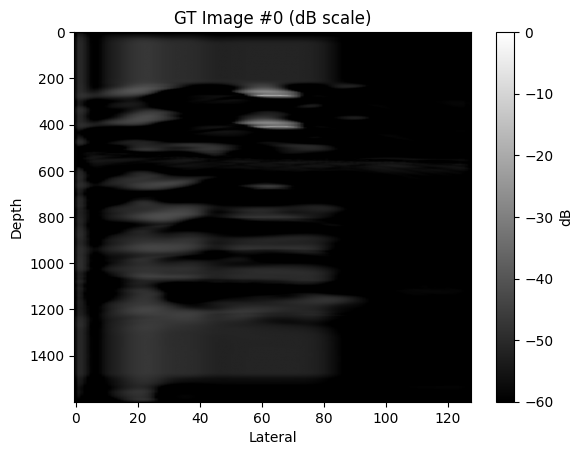

Training:   6%|▌         | 12/200 [13:37<3:33:20, 68.09s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.637544



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697537



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.738161



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652330



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.715007



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.742305



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.778684



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.725503



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735684



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.725560



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612711



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635965



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.719826



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570646



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775707



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.893763



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.680982



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655175



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698343



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654341



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652252



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564140



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673717



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.731228



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655694



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656664



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591853



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594231



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.843218



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610360



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628511



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.735264



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.528949



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643227



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591594



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602580



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695857



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536590



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558248



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554955



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.721052



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698720



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.692581



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688696



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.700485



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644891



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652178



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.642694



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580346



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.761625



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697978



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.725026



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641826



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638516



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.791246



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.716240



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673436



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775312



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647188



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478030



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.780878



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547545



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.729200



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.586244



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598963



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673795



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.818460



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653617



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.772586



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698565



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.456817



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.670136

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.06it/s]

Batch 1/7: Loss=0.626536, PSNR≈20.52, SSIM≈0.3138



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.08it/s]

Batch 2/7: Loss=0.480486, PSNR≈30.90, SSIM≈0.7785



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.09it/s]

Batch 3/7: Loss=0.640903, PSNR≈24.20, SSIM≈0.5113



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.08it/s]

Batch 4/7: Loss=0.546793, PSNR≈20.60, SSIM≈0.3050



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.10it/s]

Batch 5/7: Loss=0.565113, PSNR≈28.39, SSIM≈0.7562



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.11it/s]

Batch 6/7: Loss=0.532165, PSNR≈30.57, SSIM≈0.7572



Training:   6%|▋         | 13/200 [14:44<3:32:00, 68.02s/it]

Batch 7/7: Loss=0.628584, PSNR≈31.55, SSIM≈0.8793

===> Validation finished. Avg Loss: 0.574369, Avg PSNR: 27.44, Avg SSIM: 0.6243
🔁 Learning Rate for next epoch: 0.005000
Epoch 13/200 | Train: 0.6701 | Val: 0.5744 | PSNR: 27.44 | SSIM: 0.6243
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.805119



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677335



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602008



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.954323



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.744027



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694344



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643584



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592653



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690498



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652698



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609623



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652832



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578560



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479718



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525778



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643723



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635009



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.700474



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648016



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668046



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630289



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.676433



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.605369



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.701257



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.734419



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620643



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644894



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.636595



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526324



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527265



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.704154



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560694



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634207



 46%|████▋     | 33/71 [00:30<00:35,  1.06it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.737773



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.676958



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654315



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687137



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.697112



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.682603



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655575



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.678179



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740349



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.590162



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656442



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.746927



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630125



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649559



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696181



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594422



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621478



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610171



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.784501



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630723



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.589608



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.729854



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664492



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.765298



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559231



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649926



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539741



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553469



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668045



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596457



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.732728



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.584855



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.708973



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.729693



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649114



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641554



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617854



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.375826



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.650399

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.08it/s]

Batch 1/7: Loss=0.621245, PSNR≈20.98, SSIM≈0.3294



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.09it/s]

Batch 2/7: Loss=0.473164, PSNR≈31.53, SSIM≈0.7962



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.07it/s]

Batch 3/7: Loss=0.636410, PSNR≈23.90, SSIM≈0.5903



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.07it/s]

Batch 4/7: Loss=0.536162, PSNR≈20.92, SSIM≈0.3109



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.559415, PSNR≈28.68, SSIM≈0.7740



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  2.98it/s]

Batch 6/7: Loss=0.528617, PSNR≈31.52, SSIM≈0.7919



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.98it/s]

Batch 7/7: Loss=0.615499, PSNR≈31.56, SSIM≈0.9331

===> Validation finished. Avg Loss: 0.567216, Avg PSNR: 27.60, Avg SSIM: 0.6749
🔁 Learning Rate for next epoch: 0.005000
Epoch 14/200 | Train: 0.6504 | Val: 0.5672 | PSNR: 27.60 | SSIM: 0.6749
torch.Size([16, 1, 1600, 128])


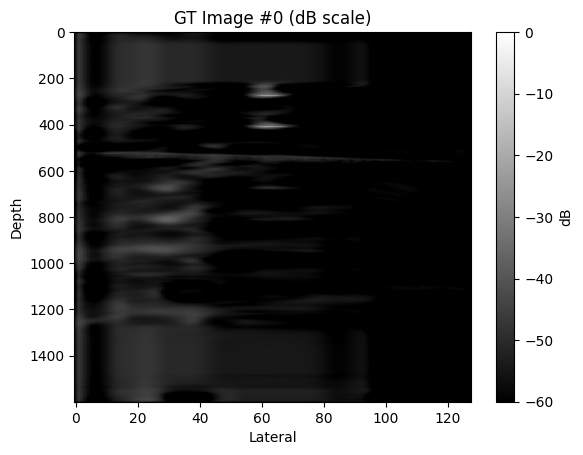

Training:   7%|▋         | 14/200 [15:53<3:31:25, 68.20s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714639



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.640548



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626597



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502439



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714161



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545094



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616251



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549733



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694920



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681735



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.584869



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583239



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552820



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595177



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703174



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546013



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698625



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.745429



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690027



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711785



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.755488



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513264



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.771527



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573797



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658656



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629819



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681038



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591249



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588300



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766317



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691637



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696523



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.708960



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.645407



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553111



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604598



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690674



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705460



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.660342



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740058



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545371



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677582



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.736954



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.773220



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.775092



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.794338



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622337



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.774660



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553056



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691862



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.702262



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.706317



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.674888



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.608370



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560632



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664787



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.693759



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617017



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644809



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.557201



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.682796



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.833252



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571453



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654773



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.743685



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578322



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606492



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720332



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653228



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587214



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2492
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.648267



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.656026

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.13it/s]

Batch 1/7: Loss=0.618342, PSNR≈20.90, SSIM≈0.3245



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.12it/s]

Batch 2/7: Loss=0.472882, PSNR≈31.72, SSIM≈0.7933



Validating:  43%|████▎     | 3/7 [00:00<00:01,  2.98it/s]

Batch 3/7: Loss=0.632555, PSNR≈24.24, SSIM≈0.5116



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.97it/s]

Batch 4/7: Loss=0.535407, PSNR≈20.59, SSIM≈0.3105



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.556435, PSNR≈28.70, SSIM≈0.7300



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.526318, PSNR≈31.45, SSIM≈0.7827



Training:   8%|▊         | 15/200 [17:01<3:30:02, 68.12s/it]

Batch 7/7: Loss=0.616638, PSNR≈31.56, SSIM≈0.8674

===> Validation finished. Avg Loss: 0.565511, Avg PSNR: 27.68, Avg SSIM: 0.6299
🔁 Learning Rate for next epoch: 0.005000
Epoch 15/200 | Train: 0.6560 | Val: 0.5655 | PSNR: 27.68 | SSIM: 0.6299
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671036



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.859544



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.873189



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.791048



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651567



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.719073



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691372



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594871



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621978



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.706905



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.659729



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644332



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505501



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512712



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694788



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703495



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595388



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688626



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579822



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550309



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.500314



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648221



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.812157



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762826



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.624417



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.672616



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554168



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531250



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.673679



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606430



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668202



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569402



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.666563



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635684



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616199



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579795



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585053



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516488



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639363



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621062



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.804915



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.815365



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613717



 61%|██████    | 43/71 [00:39<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.637720



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587195



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677898



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.624088



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.572543



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558328



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527613



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516668



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541540



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556145



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522873



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630203



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.645978



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600815



 80%|████████  | 57/71 [00:52<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607287



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733292



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.567824



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647370



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617089



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651813



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.619891



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620868



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560001



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609903



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656867



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.593344



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571254



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.369703



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.629004

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.06it/s]

Batch 1/7: Loss=0.597497, PSNR≈21.17, SSIM≈0.3475



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.08it/s]

Batch 2/7: Loss=0.456346, PSNR≈31.82, SSIM≈0.7627



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.611746, PSNR≈24.54, SSIM≈0.5869



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.518924, PSNR≈20.96, SSIM≈0.3357



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.532165, PSNR≈29.73, SSIM≈0.8097



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.510715, PSNR≈31.60, SSIM≈0.7756



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.601012, PSNR≈31.66, SSIM≈0.9322

===> Validation finished. Avg Loss: 0.546915, Avg PSNR: 28.03, Avg SSIM: 0.6827
🔁 Learning Rate for next epoch: 0.005000
Epoch 16/200 | Train: 0.6290 | Val: 0.5469 | PSNR: 28.03 | SSIM: 0.6827
torch.Size([16, 1, 1600, 128])


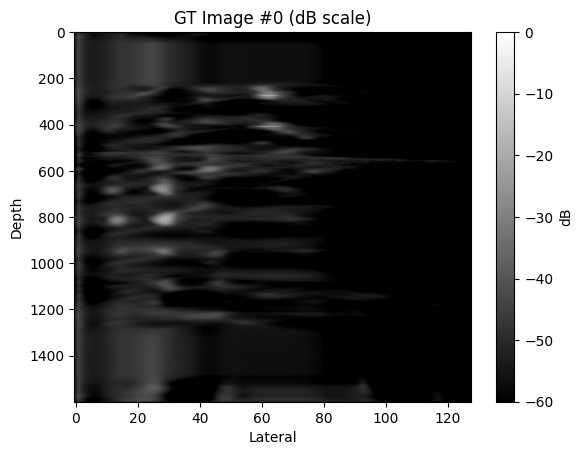

Training:   8%|▊         | 16/200 [18:09<3:29:17, 68.25s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629035



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545288



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612751



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580275



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.750075



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561921



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.627258



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575545



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499054



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555597



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691038



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607592



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566684



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651985



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606649



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520849



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545726



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547147



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.662268



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616760



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538883



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539790



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648906



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641553



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629629



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.741207



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.593202



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505692



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595240



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670402



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639333



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.723971



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.779811



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648421



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496229



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543306



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568009



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685013



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569536



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.633330



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.785313



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646210



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671133



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.722639



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699042



 63%|██████▎   | 45/71 [00:41<00:24,  1.06it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668062



 65%|██████▍   | 46/71 [00:42<00:23,  1.06it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649883



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.611215



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.680730



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647036



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.597467



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.601807



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703940



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592266



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514040



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537141



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499196



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621744



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569976



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.640102



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551223



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622850



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.623689



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585088



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.716030



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.627886



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668800



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695994



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.714318



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579135



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.499528



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.618147

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.09it/s]

Batch 1/7: Loss=0.586725, PSNR≈21.35, SSIM≈0.3655



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.453020, PSNR≈31.74, SSIM≈0.7562



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.610898, PSNR≈24.45, SSIM≈0.6723



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.511079, PSNR≈20.74, SSIM≈0.3606



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.527164, PSNR≈30.46, SSIM≈0.7710



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.513037, PSNR≈31.78, SSIM≈0.7888



Training:   8%|▊         | 17/200 [19:18<3:28:02, 68.21s/it]

Batch 7/7: Loss=0.590164, PSNR≈32.03, SSIM≈0.8981

===> Validation finished. Avg Loss: 0.541727, Avg PSNR: 28.10, Avg SSIM: 0.6849
🔁 Learning Rate for next epoch: 0.005000
Epoch 17/200 | Train: 0.6181 | Val: 0.5417 | PSNR: 28.10 | SSIM: 0.6849
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713859



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.601992



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.707173



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565040



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580694



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571977



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595079



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.627202



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.636565



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620548



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.473644



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468199



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.699077



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.623426



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583066



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484965



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.642421



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613071



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450541



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558216



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.740309



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647083



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604305



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658924



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646463



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.732089



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618645



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522175



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.686069



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647296



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.719153



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687171



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651670



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.605013



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553126



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539038



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.808931



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641590



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598565



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650230



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.789269



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603956



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535506



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574626



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583112



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592962



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.597072



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647055



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464112



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587456



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550486



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618080



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603873



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513377



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654794



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559089



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575568



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559533



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.648908



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647890



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564446



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494231



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581728



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588905



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.677833



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.756822



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516632



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497221



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687267



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472879



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.706724



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.608817

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.07it/s]

Batch 1/7: Loss=0.595487, PSNR≈21.31, SSIM≈0.3383



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.452989, PSNR≈32.15, SSIM≈0.7789



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.614735, PSNR≈24.18, SSIM≈0.6022



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.88it/s]

Batch 4/7: Loss=0.508116, PSNR≈21.08, SSIM≈0.3455



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.527416, PSNR≈31.05, SSIM≈0.7997



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.507506, PSNR≈31.46, SSIM≈0.7716



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.597157, PSNR≈32.17, SSIM≈0.7356

===> Validation finished. Avg Loss: 0.543344, Avg PSNR: 28.39, Avg SSIM: 0.6361
🔁 Learning Rate for next epoch: 0.005000
Epoch 18/200 | Train: 0.6088 | Val: 0.5433 | PSNR: 28.39 | SSIM: 0.6361
torch.Size([16, 1, 1600, 128])


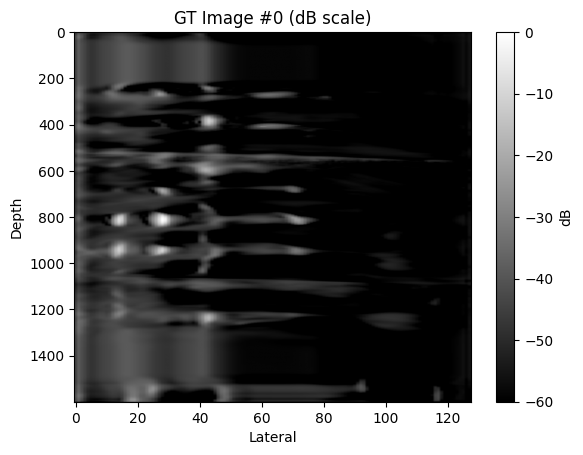

Training:   9%|▉         | 18/200 [20:26<3:27:13, 68.32s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583994



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629207



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616546



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510113



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681930



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.624853



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649296



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520078



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558460



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598750



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.675525



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594890



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.772812



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550650



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.739798



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566823



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595748



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.633593



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671946



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598822



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552296



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540157



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635420



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602985



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.782237



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509620



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620136



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602311



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570462



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607549



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713206



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504032



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465427



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496714



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543549



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694813



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447008



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.736778



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558039



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583932



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585493



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546050



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411900



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602330



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587162



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527501



 65%|██████▍   | 46/71 [00:42<00:23,  1.06it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594830



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617452



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553419



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.706231



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587784



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594945



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622237



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628066



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488297



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547403



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578753



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575186



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643596



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568440



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556610



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554993



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439963



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649323



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600504



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.679749



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504890



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638171



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562667



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685919



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.617254



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.594333

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.86it/s]

Batch 1/7: Loss=0.560416, PSNR≈21.83, SSIM≈0.3682



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.430709, PSNR≈32.27, SSIM≈0.7685



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.579184, PSNR≈25.80, SSIM≈0.5970



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.489618, PSNR≈22.00, SSIM≈0.3904



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.498103, PSNR≈31.68, SSIM≈0.8148



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.488028, PSNR≈30.03, SSIM≈0.7205



Training:  10%|▉         | 19/200 [21:34<3:25:48, 68.22s/it]

Batch 7/7: Loss=0.569235, PSNR≈33.26, SSIM≈0.8467

===> Validation finished. Avg Loss: 0.516470, Avg PSNR: 29.13, Avg SSIM: 0.6799
🔁 Learning Rate for next epoch: 0.005000
Epoch 19/200 | Train: 0.5943 | Val: 0.5165 | PSNR: 29.13 | SSIM: 0.6799
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512850



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.599948



  3%|▎         | 2/71 [00:01<01:04,  1.06it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553491



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664868



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713055



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.584631



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552409



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560953



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709237



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570350



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.733908



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539442



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.500465



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.655568



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711290



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386549



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.589231



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505562



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580968



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.753311



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.608132



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569623



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504670



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.500745



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615497



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571639



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652805



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559061



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499639



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546362



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518556



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525564



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696584



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501691



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.705026



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594274



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521297



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.762524



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694115



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558337



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.577758



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564290



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.614072



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650841



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595788



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564137



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558692



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426842



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.619862



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555703



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691755



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.718224



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713598



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570367



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560914



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559707



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538192



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568063



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550368



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481785



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.617831



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440209



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508413



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530516



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472324



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482344



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546434



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554464



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553787



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524869



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.545552



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.579464

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.540674, PSNR≈22.38, SSIM≈0.3436



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.06it/s]

Batch 2/7: Loss=0.408103, PSNR≈32.76, SSIM≈0.7902



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.98it/s]

Batch 3/7: Loss=0.566745, PSNR≈24.97, SSIM≈0.5549



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.469611, PSNR≈22.08, SSIM≈0.3295



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.479986, PSNR≈32.67, SSIM≈0.8045



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.466594, PSNR≈32.42, SSIM≈0.8025



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]

Batch 7/7: Loss=0.547204, PSNR≈33.82, SSIM≈0.7938

===> Validation finished. Avg Loss: 0.496988, Avg PSNR: 29.71, Avg SSIM: 0.6679
🔁 Learning Rate for next epoch: 0.005000
Epoch 20/200 | Train: 0.5795 | Val: 0.4970 | PSNR: 29.71 | SSIM: 0.6679
torch.Size([16, 1, 1600, 128])


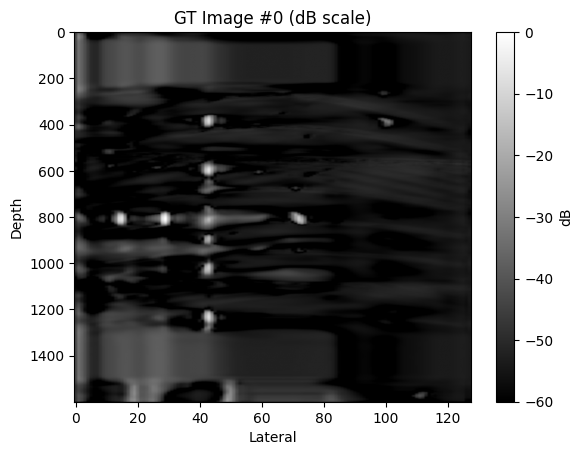

Training:  10%|█         | 20/200 [22:43<3:25:01, 68.34s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554486



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610606



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.642061



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626177



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475907



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592767



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571437



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562086



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546503



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482510



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576019



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445378



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.533182



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.629295



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606754



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453431



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464265



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.619913



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.611009



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482493



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543459



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.766224



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422682



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459180



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509160



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634289



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553531



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.572345



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544975



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632691



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472973



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457038



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519977



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538465



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602469



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502733



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.572611



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.696799



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.661869



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.741495



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544762



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476055



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.584506



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.719497



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587325



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522423



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575268



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503479



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511028



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501511



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.590064



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504773



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477551



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530712



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453263



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523134



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499261



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.701651



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541427



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.752962



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522274



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561580



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.768557



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3680
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620026



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549653



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489806



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626570



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562579



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.698355



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.577918



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.499138



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.564343

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.01it/s]

Batch 1/7: Loss=0.512258, PSNR≈22.97, SSIM≈0.4121



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.89it/s]

Batch 2/7: Loss=0.393039, PSNR≈32.93, SSIM≈0.7736



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.540432, PSNR≈26.79, SSIM≈0.6716



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.88it/s]

Batch 4/7: Loss=0.449924, PSNR≈22.71, SSIM≈0.4091



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.458026, PSNR≈32.28, SSIM≈0.8054



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.449658, PSNR≈32.31, SSIM≈0.7894



Training:  10%|█         | 21/200 [23:51<3:23:39, 68.26s/it]

Batch 7/7: Loss=0.524239, PSNR≈35.27, SSIM≈0.8243

===> Validation finished. Avg Loss: 0.475368, Avg PSNR: 30.35, Avg SSIM: 0.7062
🔁 Learning Rate for next epoch: 0.005000
Epoch 21/200 | Train: 0.5643 | Val: 0.4754 | PSNR: 30.35 | SSIM: 0.7062
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.642832



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568745



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470422



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603683



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.706321



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.589173



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.710479



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481829



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470310



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356938



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526121



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492821



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494021



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482586



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457777



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628670



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524981



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606171



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711138



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.703215



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540410



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492255



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455031



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479033



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588223



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578390



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558163



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603549



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695764



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643879



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579464



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462717



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574577



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468204



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573208



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541261



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544487



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549159



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491991



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518650



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443093



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491321



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.728450



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554771



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612891



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534884



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.667232



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644187



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479096



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.694600



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606283



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502556



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426953



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511164



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544957



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615560



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530264



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.659581



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585527



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.528888



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587372



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553808



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463930



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566047



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582956



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670621



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.632683



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432237



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511458



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429207



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.643685



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.557788

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.529300, PSNR≈22.13, SSIM≈0.4079



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.04it/s]

Batch 2/7: Loss=0.396917, PSNR≈32.29, SSIM≈0.7289



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.05it/s]

Batch 3/7: Loss=0.564839, PSNR≈24.90, SSIM≈0.6841



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.461446, PSNR≈22.17, SSIM≈0.3980



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.473685, PSNR≈33.35, SSIM≈0.8413



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  2.97it/s]

Batch 6/7: Loss=0.459805, PSNR≈32.22, SSIM≈0.7788



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

Batch 7/7: Loss=0.532688, PSNR≈35.65, SSIM≈0.8118

===> Validation finished. Avg Loss: 0.488383, Avg PSNR: 29.96, Avg SSIM: 0.6931
🔁 Learning Rate for next epoch: 0.005000
Epoch 22/200 | Train: 0.5578 | Val: 0.4884 | PSNR: 29.96 | SSIM: 0.6931
torch.Size([16, 1, 1600, 128])


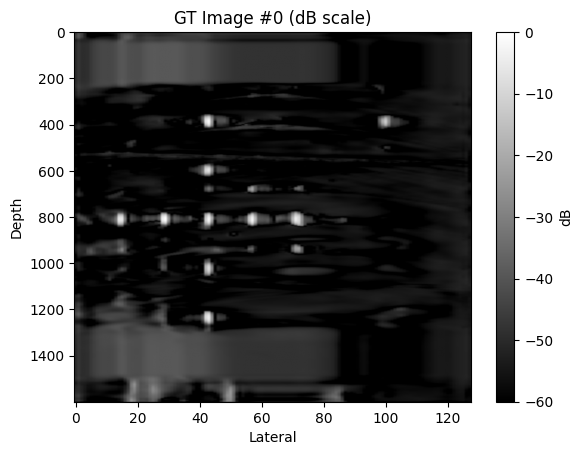

Training:  11%|█         | 22/200 [24:59<3:22:38, 68.30s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468701



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.631577



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501654



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531951



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.611414



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535257



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488016



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509049



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435577



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477439



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371094



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565390



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469077



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494494



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658818



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596828



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536632



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566643



 25%|██▌       | 18/71 [00:16<00:49,  1.06it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588317



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551231



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594034



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620599



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522157



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.567790



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425210



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561830



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.623373



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462418



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.729640



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.529975



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613080



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520074



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489153



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481070



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525641



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.657201



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476434



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507763



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547250



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587960



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486097



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423908



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626529



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546780



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.2505
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.656512



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.529670



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494447



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385743



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495839



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532930



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634945



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491398



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.589568



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544722



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404622



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538620



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530096



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569640



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652030



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423217



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.670756



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576703



 87%|████████▋ | 62/71 [00:57<00:08,  1.06it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554190



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477948



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.688450



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.615705



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518641



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550244



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.643752



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.767041



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.704544



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.548691

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.78it/s]

Batch 1/7: Loss=0.548820, PSNR≈19.36, SSIM≈0.3705



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.402970, PSNR≈32.48, SSIM≈0.7418



Validating:  43%|████▎     | 3/7 [00:01<00:01,  3.01it/s]

Batch 3/7: Loss=0.566619, PSNR≈24.90, SSIM≈0.6425



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.461272, PSNR≈22.32, SSIM≈0.4071



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.473086, PSNR≈33.81, SSIM≈0.8701



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.99it/s]

Batch 6/7: Loss=0.466939, PSNR≈32.15, SSIM≈0.7702



Training:  12%|█▏        | 23/200 [26:07<3:21:12, 68.20s/it]

Batch 7/7: Loss=0.551181, PSNR≈35.15, SSIM≈0.8438

===> Validation finished. Avg Loss: 0.495841, Avg PSNR: 29.57, Avg SSIM: 0.7001
🔁 Learning Rate for next epoch: 0.005000
Epoch 23/200 | Train: 0.5487 | Val: 0.4958 | PSNR: 29.57 | SSIM: 0.7001
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598038



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.623685



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530507



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527528



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479737



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425467



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.563158



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537239



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538273



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.709558



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671822



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.710167



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438068



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.533197



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573000



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.614260



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510166



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607950



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.674368



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531202



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553012



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540325



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641326



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383526



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634461



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550030



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.528967



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.691256



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573458



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598225



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585950



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588978



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.577040



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.637616



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713843



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.743174



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.681518



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507345



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416574



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.584230



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588691



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535572



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516310



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515265



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.786112



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564795



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610219



 66%|██████▌   | 47/71 [00:43<00:22,  1.06it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457949



 68%|██████▊   | 48/71 [00:44<00:21,  1.06it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585709



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.658086



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.659422



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.661272



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489803



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388774



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391394



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.665625



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.684128



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523074



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408505



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465938



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551799



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.662896



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.563320



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668969



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477309



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412463



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.636209



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471101



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570767



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.575791



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.473218



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.568292

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  3.00it/s]

Batch 1/7: Loss=0.523715, PSNR≈22.39, SSIM≈0.3781



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.05it/s]

Batch 2/7: Loss=0.396714, PSNR≈32.47, SSIM≈0.7607



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.07it/s]

Batch 3/7: Loss=0.557803, PSNR≈26.11, SSIM≈0.5956



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.07it/s]

Batch 4/7: Loss=0.459007, PSNR≈21.77, SSIM≈0.3726



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.467802, PSNR≈32.99, SSIM≈0.8066



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.458210, PSNR≈30.69, SSIM≈0.7241



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.07it/s]

Batch 7/7: Loss=0.535972, PSNR≈35.32, SSIM≈0.8572

===> Validation finished. Avg Loss: 0.485603, Avg PSNR: 30.16, Avg SSIM: 0.6763
🔁 Learning Rate for next epoch: 0.005000
Epoch 24/200 | Train: 0.5683 | Val: 0.4856 | PSNR: 30.16 | SSIM: 0.6763
torch.Size([16, 1, 1600, 128])


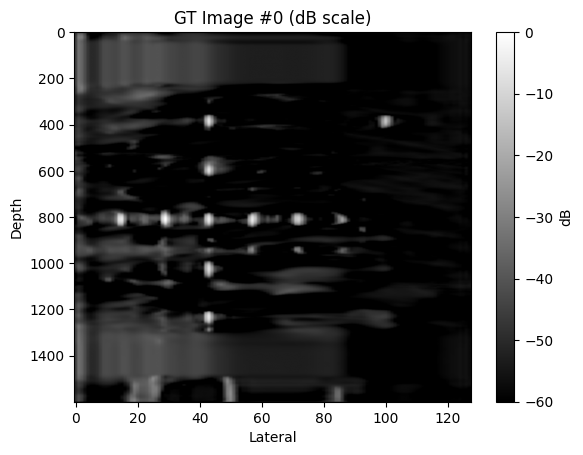

Training:  12%|█▏        | 24/200 [27:16<3:20:17, 68.28s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622778



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432937



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458764



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481041



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558527



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.720574



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647967



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.609311



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558173



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406359



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455540



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455416



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426429



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401235



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553927



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434971



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641045



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580659



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555010



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.590821



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573386



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570119



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527233



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538302



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471464



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630618



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.692198



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616480



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486857



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484489



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470099



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481655



 45%|████▌     | 32/71 [00:29<00:36,  1.06it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600596



 46%|████▋     | 33/71 [00:30<00:35,  1.06it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580699



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561260



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387102



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497006



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.557542



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547923



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.621603



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378881



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486343



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463550



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580346



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.660424



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549715



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416609



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423420



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.630168



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651553



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.685106



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441152



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591684



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571453



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.548093



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.647357



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475675



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578542



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.603249



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439045



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610672



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574366



 87%|████████▋ | 62/71 [00:57<00:08,  1.06it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488049



 89%|████████▊ | 63/71 [00:58<00:07,  1.06it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.635568



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474051



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517444



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.542050



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392350



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469128



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592312



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.287216



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.533714

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.496941, PSNR≈22.94, SSIM≈0.4636



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.04it/s]

Batch 2/7: Loss=0.374842, PSNR≈32.78, SSIM≈0.7546



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.08it/s]

Batch 3/7: Loss=0.526350, PSNR≈26.63, SSIM≈0.7007



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.09it/s]

Batch 4/7: Loss=0.430859, PSNR≈22.94, SSIM≈0.4533



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.09it/s]

Batch 5/7: Loss=0.438659, PSNR≈33.89, SSIM≈0.8674



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.434168, PSNR≈32.77, SSIM≈0.7885



Training:  12%|█▎        | 25/200 [28:24<3:18:55, 68.20s/it]

Batch 7/7: Loss=0.507086, PSNR≈36.17, SSIM≈0.8024

===> Validation finished. Avg Loss: 0.458415, Avg PSNR: 30.80, Avg SSIM: 0.7212
🔁 Learning Rate for next epoch: 0.005000
Epoch 25/200 | Train: 0.5337 | Val: 0.4584 | PSNR: 30.80 | SSIM: 0.7212
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458970



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446832



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465537



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544353



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413394



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638790



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574556



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.587179



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369338



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576809



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.695226



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476575



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530797



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372093



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403919



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554576



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579232



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585586



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.528196



 27%|██▋       | 19/71 [00:17<00:48,  1.06it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620705



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458756



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462008



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628071



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519922



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.574685



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446591



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488849



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534620



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536398



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639545



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463506



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421328



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522035



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579841



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501690



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425399



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.767109



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455464



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478684



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456122



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.641872



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540365



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556302



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466013



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523660



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514378



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602496



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555943



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.498881



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552458



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.601031



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558149



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.2494
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.684876



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335244



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.605772



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535160



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512858



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650381



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442409



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489982



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398459



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493616



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464504



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.711273



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464739



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539817



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502798



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452766



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450571



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444473



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.513630



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.522368

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.91it/s]

Batch 1/7: Loss=0.475444, PSNR≈23.30, SSIM≈0.4592



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.00it/s]

Batch 2/7: Loss=0.362715, PSNR≈34.44, SSIM≈0.8112



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.02it/s]

Batch 3/7: Loss=0.504464, PSNR≈27.36, SSIM≈0.6903



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.02it/s]

Batch 4/7: Loss=0.418058, PSNR≈23.33, SSIM≈0.4752



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.03it/s]

Batch 5/7: Loss=0.421363, PSNR≈34.26, SSIM≈0.8664



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.05it/s]

Batch 6/7: Loss=0.422227, PSNR≈33.30, SSIM≈0.7976



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.04it/s]

Batch 7/7: Loss=0.489585, PSNR≈36.62, SSIM≈0.8535

===> Validation finished. Avg Loss: 0.441979, Avg PSNR: 31.43, Avg SSIM: 0.7231
🔁 Learning Rate for next epoch: 0.005000
Epoch 26/200 | Train: 0.5224 | Val: 0.4420 | PSNR: 31.43 | SSIM: 0.7231
torch.Size([16, 1, 1600, 128])


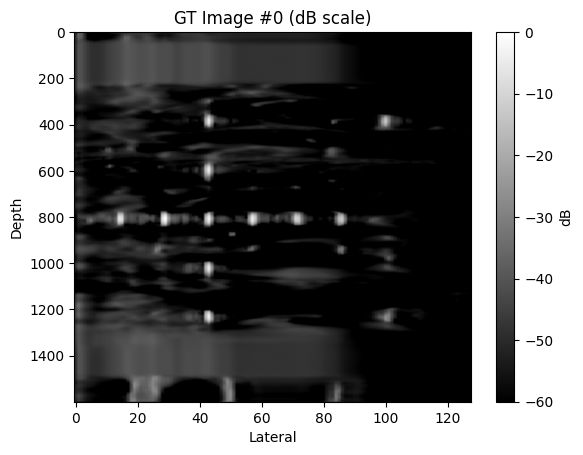

Training:  13%|█▎        | 26/200 [29:32<3:18:00, 68.28s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400804



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581298



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.611163



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425881



  6%|▌         | 4/71 [00:03<01:03,  1.06it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536694



  7%|▋         | 5/71 [00:04<01:02,  1.06it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578178



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450110



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602733



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510777



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521846



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552749



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585639



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380487



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510967



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368374



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470974



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509704



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396046



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.593281



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465736



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554334



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449319



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579224



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543681



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524401



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.601243



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580137



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452508



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538448



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459376



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399021



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546479



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411702



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.597664



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427731



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541533



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471873



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301556



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515443



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553592



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604885



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536583



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.596540



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412827



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472391



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526990



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486612



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.607439



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456932



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.599502



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487809



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616571



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.595318



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.634360



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538460



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551961



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535735



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573735



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569043



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594568



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425759



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.687284



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517872



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444485



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486385



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554255



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458816



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.557468



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509554



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594009



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.367811



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.516967

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.494786, PSNR≈22.78, SSIM≈0.4388



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.01it/s]

Batch 2/7: Loss=0.372679, PSNR≈33.93, SSIM≈0.7817



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.03it/s]

Batch 3/7: Loss=0.524506, PSNR≈26.62, SSIM≈0.6859



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.05it/s]

Batch 4/7: Loss=0.435034, PSNR≈22.61, SSIM≈0.4133



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.06it/s]

Batch 5/7: Loss=0.440172, PSNR≈33.61, SSIM≈0.8119



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.01it/s]

Batch 6/7: Loss=0.435738, PSNR≈33.23, SSIM≈0.7843



Training:  14%|█▎        | 27/200 [30:40<3:16:34, 68.18s/it]

Batch 7/7: Loss=0.506074, PSNR≈36.42, SSIM≈0.8960

===> Validation finished. Avg Loss: 0.458427, Avg PSNR: 31.05, Avg SSIM: 0.7262
🔁 Learning Rate for next epoch: 0.005000
Epoch 27/200 | Train: 0.5170 | Val: 0.4584 | PSNR: 31.05 | SSIM: 0.7262
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376609



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.616542



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459304



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556363



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644088



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.542426



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.592267



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.570598



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532325



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.690531



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565650



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501612



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424239



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.664964



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504563



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451018



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502450



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535747



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422406



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.675034



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.639642



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553745



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461321



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417157



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415280



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539713



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340985



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.586715



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.646641



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485866



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447127



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.713320



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.498236



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480605



 48%|████▊     | 34/71 [00:31<00:34,  1.06it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445041



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477963



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560053



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458569



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610564



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534829



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429338



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488183



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539366



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415547



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504596



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515756



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.605688



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508433



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432855



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526573



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543962



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427067



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508699



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591254



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530509



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413604



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479615



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411289



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499189



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480731



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546269



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454607



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492013



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470121



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.550955



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522366



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448441



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472771



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497502



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350205



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.485463



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.511057

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.466029, PSNR≈23.45, SSIM≈0.5030



Validating:  29%|██▊       | 2/7 [00:00<00:01,  3.06it/s]

Batch 2/7: Loss=0.355831, PSNR≈34.35, SSIM≈0.8032



Validating:  43%|████▎     | 3/7 [00:00<00:01,  3.07it/s]

Batch 3/7: Loss=0.496565, PSNR≈27.68, SSIM≈0.7153



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.08it/s]

Batch 4/7: Loss=0.408471, PSNR≈23.33, SSIM≈0.4941



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.09it/s]

Batch 5/7: Loss=0.414984, PSNR≈34.86, SSIM≈0.8745



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.10it/s]

Batch 6/7: Loss=0.413005, PSNR≈33.58, SSIM≈0.7876



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.08it/s]

Batch 7/7: Loss=0.479508, PSNR≈36.97, SSIM≈0.8700

===> Validation finished. Avg Loss: 0.433485, Avg PSNR: 31.63, Avg SSIM: 0.7412
🔁 Learning Rate for next epoch: 0.005000
Epoch 28/200 | Train: 0.5111 | Val: 0.4335 | PSNR: 31.63 | SSIM: 0.7412
torch.Size([16, 1, 1600, 128])


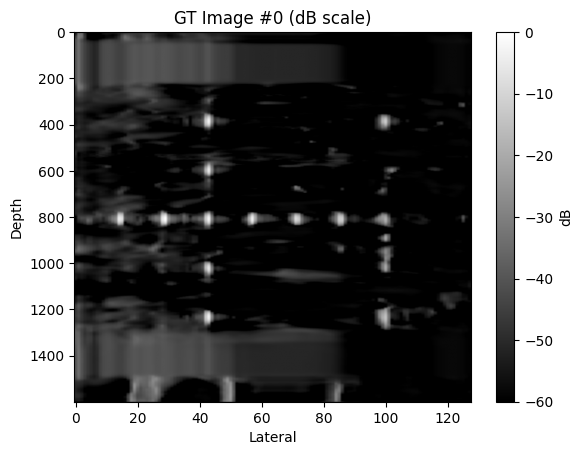

Training:  14%|█▍        | 28/200 [31:49<3:15:40, 68.26s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427129



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594420



  3%|▎         | 2/71 [00:01<01:03,  1.09it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524772



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405170



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435422



  7%|▋         | 5/71 [00:04<01:02,  1.06it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499095



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410815



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419336



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514943



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524178



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489820



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524273



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412133



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436293



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495911



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512189



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.644256



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429835



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503016



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432769



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504772



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464750



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581463



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437888



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581882



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523444



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485544



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445894



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355178



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458519



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446363



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493743



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581025



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433818



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.624399



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459759



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357077



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417253



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522122



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426524



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519063



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610848



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.671641



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526776



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610430



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519096



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346523



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535496



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553193



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604934



 70%|███████   | 50/71 [00:46<00:19,  1.06it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524962



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502755



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450710



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509553



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522861



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491862



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525942



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496253



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525556



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481981



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.483096



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543154



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492746



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346997



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.661503



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472985



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325091



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580793



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459514



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580601



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2484
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.602174



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.497412

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.79it/s]

Batch 1/7: Loss=0.487804, PSNR≈23.10, SSIM≈0.4832



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.370497, PSNR≈33.96, SSIM≈0.8162



Validating:  43%|████▎     | 3/7 [00:01<00:01,  3.01it/s]

Batch 3/7: Loss=0.512575, PSNR≈27.57, SSIM≈0.6793



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.00it/s]

Batch 4/7: Loss=0.428373, PSNR≈22.65, SSIM≈0.4609



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.01it/s]

Batch 5/7: Loss=0.431943, PSNR≈33.45, SSIM≈0.8310



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.05it/s]

Batch 6/7: Loss=0.427746, PSNR≈32.19, SSIM≈0.7870



Training:  14%|█▍        | 29/200 [32:56<3:14:10, 68.13s/it]

Batch 7/7: Loss=0.502198, PSNR≈36.85, SSIM≈0.8898

===> Validation finished. Avg Loss: 0.451591, Avg PSNR: 31.13, Avg SSIM: 0.7351
🔁 Learning Rate for next epoch: 0.005000
Epoch 29/200 | Train: 0.4974 | Val: 0.4516 | PSNR: 31.13 | SSIM: 0.7351
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428080



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419655



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358959



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602460



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.473142



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543957



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535615



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565444



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491254



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342450



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361000



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468678



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.763002



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.649293



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560711



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442276



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519816



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534721



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.602637



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490537



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520917



 30%|██▉       | 21/71 [00:19<00:47,  1.06it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495497



 31%|███       | 22/71 [00:20<00:46,  1.06it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467728



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516837



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493276



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513440



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390330



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504392



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510709



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517254



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373589



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.712270



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571248



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.600001



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.667722



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465381



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536844



 52%|█████▏    | 37/71 [00:34<00:31,  1.06it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366759



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442090



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543965



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491324



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540213



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406199



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413049



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448400



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544426



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539483



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482337



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433717



 69%|██████▉   | 49/71 [00:45<00:20,  1.06it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493391



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.622288



 72%|███████▏  | 51/71 [00:47<00:18,  1.06it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.651818



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.588760



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431035



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445791



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448934



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556560



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556043



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524239



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.614230



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440342



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580285



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613667



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420446



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501656



 92%|█████████▏| 65/71 [01:00<00:05,  1.06it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388262



 93%|█████████▎| 66/71 [01:01<00:04,  1.06it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539460



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526211



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569739



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536242



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.254705



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.506580

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.499153, PSNR≈22.19, SSIM≈0.4452



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.96it/s]

Batch 2/7: Loss=0.375853, PSNR≈34.81, SSIM≈0.8175



Validating:  43%|████▎     | 3/7 [00:01<00:01,  3.01it/s]

Batch 3/7: Loss=0.531911, PSNR≈25.98, SSIM≈0.5886



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.06it/s]

Batch 4/7: Loss=0.440666, PSNR≈22.18, SSIM≈0.4351



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.434385, PSNR≈33.58, SSIM≈0.8490



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.444533, PSNR≈33.59, SSIM≈0.7996



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.05it/s]

Batch 7/7: Loss=0.517614, PSNR≈36.58, SSIM≈0.8357

===> Validation finished. Avg Loss: 0.463445, Avg PSNR: 30.31, Avg SSIM: 0.6994
🔁 Learning Rate for next epoch: 0.005000
Epoch 30/200 | Train: 0.5066 | Val: 0.4634 | PSNR: 30.31 | SSIM: 0.6994
torch.Size([16, 1, 1600, 128])


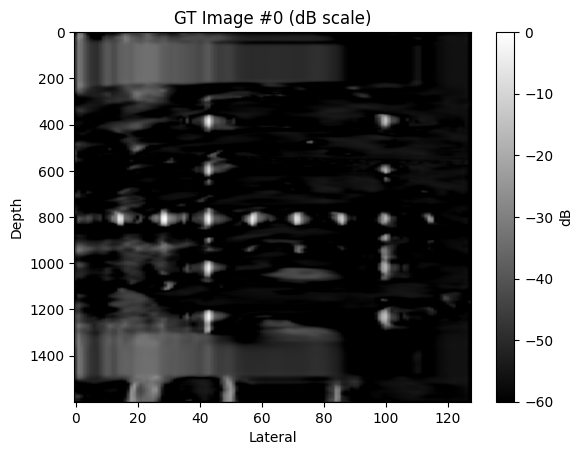

Training:  15%|█▌        | 30/200 [34:05<3:13:32, 68.31s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492016



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425384



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555733



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511740



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530614



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531753



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517163



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490530



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487585



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471673



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.577065



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555413



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.654343



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461365



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381820



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536745



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457297



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534546



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555527



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423548



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552307



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569633



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444386



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409805



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493126



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.653564



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393203



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513662



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.606624



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472774



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502073



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508339



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493706



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522431



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399044



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536793



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479778



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505946



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503366



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437780



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.620558



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531778



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513102



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.2487
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.650830



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618085



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412416



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539948



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412096



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552847



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.529167



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404941



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471170



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496649



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405070



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551076



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359830



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.668935



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426658



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497468



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492676



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406953



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.551635



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346058



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396361



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579940



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519421



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463952



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518085



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523146



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435031



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.473755



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.500279

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.89it/s]

Batch 1/7: Loss=0.441887, PSNR≈24.16, SSIM≈0.5508



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.338929, PSNR≈35.43, SSIM≈0.8265



Validating:  43%|████▎     | 3/7 [00:01<00:01,  3.01it/s]

Batch 3/7: Loss=0.475267, PSNR≈28.07, SSIM≈0.7569



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.05it/s]

Batch 4/7: Loss=0.393714, PSNR≈24.03, SSIM≈0.5321



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.396335, PSNR≈35.19, SSIM≈0.8745



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.398466, PSNR≈33.27, SSIM≈0.7948



Training:  16%|█▌        | 31/200 [35:13<3:12:03, 68.18s/it]

Batch 7/7: Loss=0.455159, PSNR≈37.49, SSIM≈0.9012

===> Validation finished. Avg Loss: 0.414251, Avg PSNR: 32.09, Avg SSIM: 0.7665
🔁 Learning Rate for next epoch: 0.005000
Epoch 31/200 | Train: 0.5003 | Val: 0.4143 | PSNR: 32.09 | SSIM: 0.7665
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479056



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559103



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613747



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459202



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554475



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502261



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.547482



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421452



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554823



 13%|█▎        | 9/71 [00:08<00:58,  1.06it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468507



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539257



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478037



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520982



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402592



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416942



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440583



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582665



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.666335



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560123



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515663



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462297



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463005



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389838



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454156



 34%|███▍      | 24/71 [00:22<00:44,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492297



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450940



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480416



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469387



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576303



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.506773



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517636



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434154



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419857



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520265



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453217



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425794



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502391



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490782



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513272



 55%|█████▍    | 39/71 [00:36<00:30,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482957



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413113



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555822



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516079



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403553



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417520



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465055



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359567



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442208



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392908



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416737



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.591657



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403964



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488059



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527478



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426023



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512103



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513873



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530542



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311385



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352412



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495741



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497570



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475424



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365164



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464286



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412323



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521912



 94%|█████████▍| 67/71 [01:02<00:03,  1.06it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366306



 96%|█████████▌| 68/71 [01:03<00:02,  1.06it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495963



 97%|█████████▋| 69/71 [01:04<00:01,  1.06it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436032



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2492
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.451476



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.476215

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.83it/s]

Batch 1/7: Loss=0.440763, PSNR≈24.47, SSIM≈0.5852



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.339257, PSNR≈35.90, SSIM≈0.8283



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.99it/s]

Batch 3/7: Loss=0.473244, PSNR≈28.13, SSIM≈0.7758



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.396924, PSNR≈24.13, SSIM≈0.5647



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.05it/s]

Batch 5/7: Loss=0.395363, PSNR≈34.38, SSIM≈0.8455



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.07it/s]

Batch 6/7: Loss=0.398575, PSNR≈32.85, SSIM≈0.7661



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.03it/s]

Batch 7/7: Loss=0.454115, PSNR≈37.23, SSIM≈0.8916

===> Validation finished. Avg Loss: 0.414035, Avg PSNR: 32.10, Avg SSIM: 0.7667
🔁 Learning Rate for next epoch: 0.005000
Epoch 32/200 | Train: 0.4762 | Val: 0.4140 | PSNR: 32.10 | SSIM: 0.7667
torch.Size([16, 1, 1600, 128])


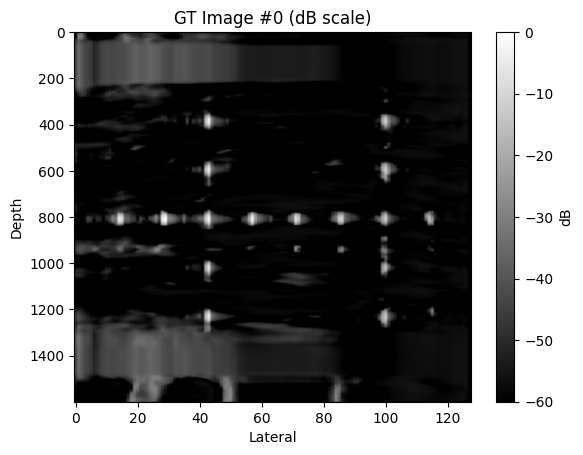

Training:  16%|█▌        | 32/200 [36:22<3:11:12, 68.29s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447319



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388091



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403864



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537833



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450508



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585247



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469030



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.593527



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540174



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488569



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373023



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414593



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424135



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450310



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531641



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400981



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576904



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472230



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463864



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519383



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320433



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555308



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.533224



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.578027



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480463



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461285



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363946



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502316



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440056



 41%|████      | 29/71 [00:27<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522907



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400923



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386801



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361837



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435475



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455509



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582109



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507761



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564682



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.576827



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564420



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458032



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561400



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443245



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.638169



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502927



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.569309



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.544798



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507371



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.533327



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568933



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414683



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452198



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421742



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464162



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398736



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526913



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429732



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456517



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469903



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480268



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374284



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420964



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490908



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476624



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489724



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.527748



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518856



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453036



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460354



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543337



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.360620



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.480061

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.462981, PSNR≈23.57, SSIM≈0.5152



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.351366, PSNR≈35.55, SSIM≈0.8012



Validating:  43%|████▎     | 3/7 [00:01<00:01,  3.00it/s]

Batch 3/7: Loss=0.503290, PSNR≈27.01, SSIM≈0.6519



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.05it/s]

Batch 4/7: Loss=0.411614, PSNR≈23.59, SSIM≈0.5276



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.07it/s]

Batch 5/7: Loss=0.415260, PSNR≈34.18, SSIM≈0.8440



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.08it/s]

Batch 6/7: Loss=0.418317, PSNR≈33.51, SSIM≈0.8019



Training:  16%|█▋        | 33/200 [37:29<3:09:36, 68.12s/it]

Batch 7/7: Loss=0.478728, PSNR≈37.20, SSIM≈0.9171

===> Validation finished. Avg Loss: 0.434508, Avg PSNR: 31.70, Avg SSIM: 0.7459
🔁 Learning Rate for next epoch: 0.005000
Epoch 33/200 | Train: 0.4801 | Val: 0.4345 | PSNR: 31.70 | SSIM: 0.7459
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521843



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417461



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387088



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463985



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543826



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451197



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580738



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509880



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.561869



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481638



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447066



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480121



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460832



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518962



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582527



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446588



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566119



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496234



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511528



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379683



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480304



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523434



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478095



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380233



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.608965



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455946



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511020



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364143



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420209



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492028



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452282



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348446



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421935



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515393



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478637



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367344



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379846



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435211



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454130



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460805



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562525



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484884



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426730



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414612



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472968



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537411



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509220



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480740



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391792



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566429



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358222



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.483315



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532140



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467336



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378517



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434033



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407202



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485263



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511085



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444887



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566581



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461049



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426900



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475003



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365990



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387201



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408895



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453597



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421532



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447855



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.393020



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.464712

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.83it/s]

Batch 1/7: Loss=0.428170, PSNR≈24.66, SSIM≈0.5970



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.78it/s]

Batch 2/7: Loss=0.335565, PSNR≈35.17, SSIM≈0.8166



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.80it/s]

Batch 3/7: Loss=0.469834, PSNR≈28.24, SSIM≈0.6873



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.77it/s]

Batch 4/7: Loss=0.389330, PSNR≈24.65, SSIM≈0.5724



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.82it/s]

Batch 5/7: Loss=0.390529, PSNR≈34.17, SSIM≈0.8588



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.396664, PSNR≈32.83, SSIM≈0.7819



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

Batch 7/7: Loss=0.444533, PSNR≈37.47, SSIM≈0.8982

===> Validation finished. Avg Loss: 0.407803, Avg PSNR: 32.23, Avg SSIM: 0.7618
🔁 Learning Rate for next epoch: 0.005000
Epoch 34/200 | Train: 0.4647 | Val: 0.4078 | PSNR: 32.23 | SSIM: 0.7618
torch.Size([16, 1, 1600, 128])


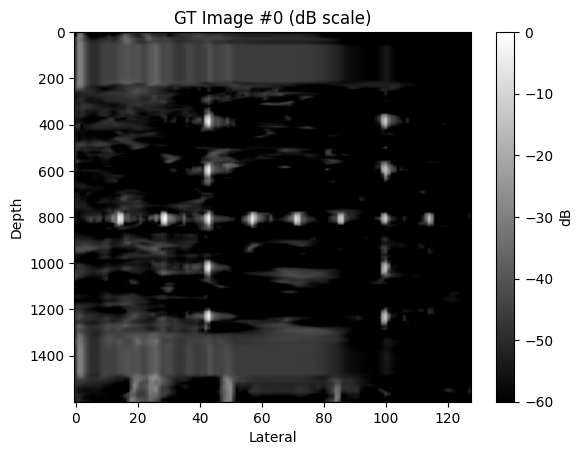

Training:  17%|█▋        | 34/200 [38:38<3:08:54, 68.28s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.565635



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446836



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508491



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463266



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448882



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540259



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336706



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545446



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381696



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417393



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455183



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450958



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604338



 18%|█▊        | 13/71 [00:12<00:54,  1.06it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463621



 20%|█▉        | 14/71 [00:13<00:53,  1.06it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406293



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425491



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431186



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504109



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397102



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481908



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405367



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431992



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312818



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553385



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422457



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555969



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391490



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462486



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446560



 41%|████      | 29/71 [00:27<00:39,  1.06it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419585



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453441



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418372



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532530



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485124



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319618



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466850



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479188



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482441



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347725



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364886



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.628710



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345605



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447499



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491190



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475720



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.2499
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.548142



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396946



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474034



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366092



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369964



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604517



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493694



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474145



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402051



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429265



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573030



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510263



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503228



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441840



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.506614



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343817



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510495



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443512



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418957



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.674561



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379096



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543855



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383874



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541222



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461108



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0714
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.835730



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.465435

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.77it/s]

Batch 1/7: Loss=0.438973, PSNR≈23.32, SSIM≈0.5693



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.78it/s]

Batch 2/7: Loss=0.341715, PSNR≈33.78, SSIM≈0.7418



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.77it/s]

Batch 3/7: Loss=0.471509, PSNR≈28.57, SSIM≈0.7541



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.83it/s]

Batch 4/7: Loss=0.391630, PSNR≈23.91, SSIM≈0.5731



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.396160, PSNR≈35.45, SSIM≈0.8851



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.86it/s]

Batch 6/7: Loss=0.399371, PSNR≈33.34, SSIM≈0.7762



Training:  18%|█▊        | 35/200 [39:46<3:07:30, 68.18s/it]

Batch 7/7: Loss=0.455306, PSNR≈37.62, SSIM≈0.9196

===> Validation finished. Avg Loss: 0.413523, Avg PSNR: 32.02, Avg SSIM: 0.7741
🔁 Learning Rate for next epoch: 0.005000
Epoch 35/200 | Train: 0.4654 | Val: 0.4135 | PSNR: 32.02 | SSIM: 0.7741
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314205



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425195



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504725



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484801



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.506723



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509279



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366864



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422296



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549648



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482622



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432242



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443903



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.619233



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.498147



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442646



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432601



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455438



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403355



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.2505
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.580990



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489101



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539593



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405421



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432738



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488914



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456237



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.582811



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.611340



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.614235



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439746



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401854



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397569



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441224



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.626584



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536758



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407062



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330828



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480959



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459460



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345889



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502624



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392858



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525839



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442172



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568448



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475012



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486731



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449073



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434089



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486379



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585015



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432645



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.507843



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501571



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361002



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.572813



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421704



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.521636



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376652



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328477



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501753



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387007



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540093



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.568670



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464448



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.542504



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446488



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435922



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450378



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517567



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406866



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.607350



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.473308

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.91it/s]

Batch 1/7: Loss=0.430271, PSNR≈24.37, SSIM≈0.5787



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.334683, PSNR≈33.51, SSIM≈0.7138



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.467596, PSNR≈28.17, SSIM≈0.7572



Validating:  57%|█████▋    | 4/7 [00:01<00:00,  3.03it/s]

Batch 4/7: Loss=0.383887, PSNR≈24.30, SSIM≈0.5653



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.06it/s]

Batch 5/7: Loss=0.388988, PSNR≈35.73, SSIM≈0.8915



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.07it/s]

Batch 6/7: Loss=0.391918, PSNR≈33.13, SSIM≈0.7574



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.99it/s]

Batch 7/7: Loss=0.445459, PSNR≈37.83, SSIM≈0.9262

===> Validation finished. Avg Loss: 0.406114, Avg PSNR: 32.16, Avg SSIM: 0.7659
🔁 Learning Rate for next epoch: 0.005000
Epoch 36/200 | Train: 0.4733 | Val: 0.4061 | PSNR: 32.16 | SSIM: 0.7659
torch.Size([16, 1, 1600, 128])


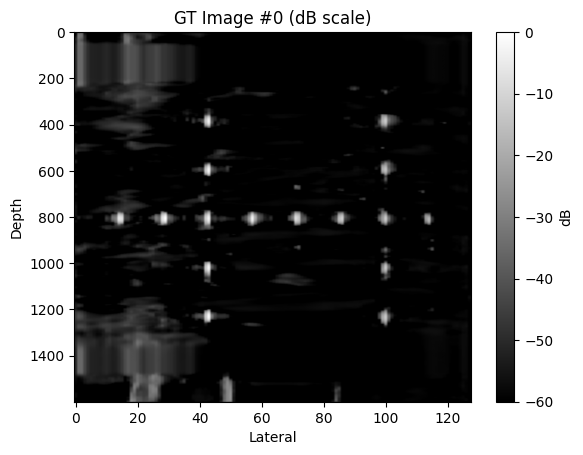

Training:  18%|█▊        | 36/200 [40:54<3:06:40, 68.29s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503492



  1%|▏         | 1/71 [00:00<01:05,  1.06it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484683



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335226



  4%|▍         | 3/71 [00:02<01:03,  1.06it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448780



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459805



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519968



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.567539



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472440



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318324



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426346



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.533180



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383650



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.555046



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.640924



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476265



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.618211



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333904



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469567



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.566499



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513640



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391339



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412657



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549468



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494139



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393123



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461282



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438682



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.581806



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.510737



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424759



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389459



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530779



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558486



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352552



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386192



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.506184



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379224



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520504



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.483499



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502984



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412616



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474537



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541048



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.613155



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457534



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420747



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505511



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401476



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375835



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371728



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.541315



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324401



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315501



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338934



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417301



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.589094



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421531



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479569



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465632



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490114



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422931



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308339



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375768



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433134



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478643



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403111



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388980



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371572



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413193



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.473651



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0726
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.810009



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.461018

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.99it/s]

Batch 1/7: Loss=0.417081, PSNR≈24.91, SSIM≈0.5569



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.96it/s]

Batch 2/7: Loss=0.323226, PSNR≈35.98, SSIM≈0.8339



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.96it/s]

Batch 3/7: Loss=0.455008, PSNR≈27.74, SSIM≈0.6838



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.98it/s]

Batch 4/7: Loss=0.381447, PSNR≈24.28, SSIM≈0.5548



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.03it/s]

Batch 5/7: Loss=0.382423, PSNR≈35.81, SSIM≈0.8922



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.05it/s]

Batch 6/7: Loss=0.383516, PSNR≈33.99, SSIM≈0.8127



Training:  18%|█▊        | 37/200 [42:02<3:05:15, 68.19s/it]

Batch 7/7: Loss=0.428910, PSNR≈37.77, SSIM≈0.9148

===> Validation finished. Avg Loss: 0.395945, Avg PSNR: 32.45, Avg SSIM: 0.7680
🔁 Learning Rate for next epoch: 0.005000
Epoch 37/200 | Train: 0.4610 | Val: 0.3959 | PSNR: 32.45 | SSIM: 0.7680
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415233



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461278



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445417



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425761



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417437



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396227



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.577072



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494223



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495538



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484163



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368645



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470846



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449172



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.573771



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.501317



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479399



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460421



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523525



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382711



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.564535



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.562434



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356847



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463848



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463988



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403998



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456924



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340252



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397704



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451349



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.473868



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421483



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389677



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367478



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502000



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459438



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479316



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478375



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405669



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457226



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364261



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401763



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421184



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352337



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.585362



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469772



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472805



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429791



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453403



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412091



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334583



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402435



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336716



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478432



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433664



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451439



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461245



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364244



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.652069



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400418



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429843



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408728



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444117



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437517



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495432



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320526



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535055



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383780



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.567291



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411792



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519542



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2479
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.398705



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.447168

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.405708, PSNR≈25.40, SSIM≈0.6657



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.319875, PSNR≈34.77, SSIM≈0.7919



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.87it/s]

Batch 3/7: Loss=0.444806, PSNR≈28.24, SSIM≈0.7963



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.97it/s]

Batch 4/7: Loss=0.368282, PSNR≈25.33, SSIM≈0.6390



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  3.04it/s]

Batch 5/7: Loss=0.370779, PSNR≈35.47, SSIM≈0.8958



Validating:  86%|████████▌ | 6/7 [00:01<00:00,  3.06it/s]

Batch 6/7: Loss=0.373533, PSNR≈34.16, SSIM≈0.7886



Validating: 100%|██████████| 7/7 [00:02<00:00,  3.01it/s]

Batch 7/7: Loss=0.420500, PSNR≈37.73, SSIM≈0.8979

===> Validation finished. Avg Loss: 0.386212, Avg PSNR: 32.61, Avg SSIM: 0.7963
🔁 Learning Rate for next epoch: 0.005000
Epoch 38/200 | Train: 0.4472 | Val: 0.3862 | PSNR: 32.61 | SSIM: 0.7963
torch.Size([16, 1, 1600, 128])


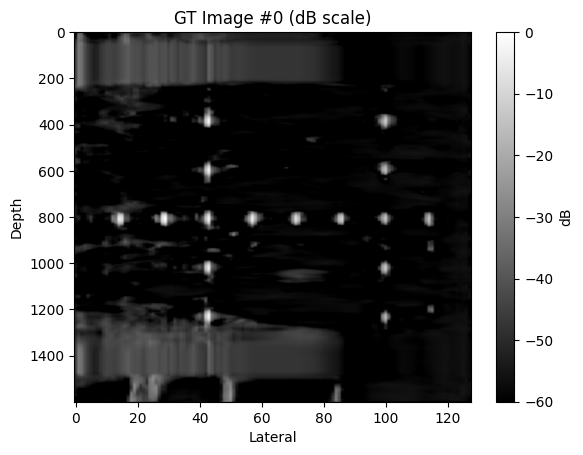

Training:  19%|█▉        | 38/200 [43:11<3:04:20, 68.27s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428764



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425873



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443345



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450769



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445829



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350022



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454551



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.560771



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612686



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525349



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421296



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423809



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424051



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428055



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460291



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452837



 23%|██▎       | 16/71 [00:14<00:50,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358226



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472485



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452071



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449834



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379008



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520545



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440051



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.512705



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.556887



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516567



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.506201



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454163



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412717



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423271



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297135



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465676



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407154



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470103



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327448



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416818



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459058



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464837



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391258



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460345



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453919



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452333



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419353



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357708



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397412



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397208



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450403



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464142



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402675



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494608



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495046



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367346



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477804



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429540



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412639



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348560



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428350



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482609



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459927



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316415



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472826



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465392



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417587



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351874



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387816



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496357



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432891



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449753



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379606



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422631



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.366917



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.437669

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.97it/s]

Batch 1/7: Loss=0.407287, PSNR≈24.94, SSIM≈0.6595



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.327738, PSNR≈34.69, SSIM≈0.7949



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.446776, PSNR≈28.50, SSIM≈0.7700



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.379732, PSNR≈25.13, SSIM≈0.6486



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.98it/s]

Batch 5/7: Loss=0.381650, PSNR≈34.68, SSIM≈0.8823



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  3.02it/s]

Batch 6/7: Loss=0.383913, PSNR≈33.88, SSIM≈0.7832



Training:  20%|█▉        | 39/200 [44:19<3:02:49, 68.13s/it]

Batch 7/7: Loss=0.425590, PSNR≈37.86, SSIM≈0.9174

===> Validation finished. Avg Loss: 0.393241, Avg PSNR: 32.47, Avg SSIM: 0.7945
🔁 Learning Rate for next epoch: 0.005000
Epoch 39/200 | Train: 0.4377 | Val: 0.3932 | PSNR: 32.47 | SSIM: 0.7945
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481191



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379739



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325157



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417504



  6%|▌         | 4/71 [00:03<01:01,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435116



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433697



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489587



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383852



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466572



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401509



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428286



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486685



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455628



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370689



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522654



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401446



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422834



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442311



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428573



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.612845



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411872



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441002



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414460



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416543



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525093



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425165



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359444



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457965



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369288



 41%|████      | 29/71 [00:26<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413259



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487269



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454025



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486317



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433740



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435421



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400185



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351128



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496306



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433687



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414829



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366789



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419223



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453212



 61%|██████    | 43/71 [00:39<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332023



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515987



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478578



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383326



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417409



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411595



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450890



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449490



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387495



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.610755



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380773



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446530



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402403



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460372



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448510



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319349



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396086



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388815



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461956



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467788



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390925



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406316



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432553



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.538780



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356643



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465711



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421669



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.518559



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.433710

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.420681, PSNR≈24.92, SSIM≈0.6648



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.89it/s]

Batch 2/7: Loss=0.345907, PSNR≈34.81, SSIM≈0.7881



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.488494, PSNR≈26.77, SSIM≈0.6819



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.83it/s]

Batch 4/7: Loss=0.399913, PSNR≈24.76, SSIM≈0.6352



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.395944, PSNR≈36.09, SSIM≈0.9036



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.429194, PSNR≈33.75, SSIM≈0.7810



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

Batch 7/7: Loss=0.449110, PSNR≈37.47, SSIM≈0.8945

===> Validation finished. Avg Loss: 0.418463, Avg PSNR: 31.71, Avg SSIM: 0.7674
🔁 Learning Rate for next epoch: 0.005000
Epoch 40/200 | Train: 0.4337 | Val: 0.4185 | PSNR: 31.71 | SSIM: 0.7674
torch.Size([16, 1, 1600, 128])


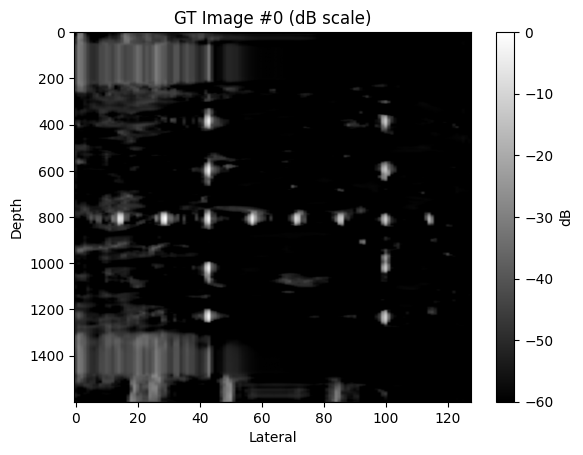

Training:  20%|██        | 40/200 [45:27<3:01:54, 68.21s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353761



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532681



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449890



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.2499
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.543449



  6%|▌         | 4/71 [00:03<01:01,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479950



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401406



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446998



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430332



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429285



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398273



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444812



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502773



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451846



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464391



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494788



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410321



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312530



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438801



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314020



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380398



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.579363



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461448



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351326



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515413



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451574



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.583650



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387633



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385220



 39%|███▉      | 28/71 [00:26<00:40,  1.06it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.518277



 41%|████      | 29/71 [00:27<00:39,  1.06it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361468



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373856



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.2494
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.559103



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392620



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424356



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360006



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412433



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371327



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408438



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403151



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377391



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424744



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.530774



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439013



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458888



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428256



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486702



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485456



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.499075



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.523600



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.594529



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471989



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319470



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392772



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354653



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.2496
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.536217



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461131



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485072



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377305



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540012



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380881



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436345



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431717



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436324



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378275



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317720



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328247



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508763



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460837



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524964



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437255



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.479697



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.440696

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.78it/s]

Batch 1/7: Loss=0.411206, PSNR≈25.47, SSIM≈0.6622



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.332286, PSNR≈35.74, SSIM≈0.8267



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.465645, PSNR≈27.09, SSIM≈0.6731



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.379949, PSNR≈25.33, SSIM≈0.6419



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.387872, PSNR≈36.66, SSIM≈0.9059



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.385184, PSNR≈34.07, SSIM≈0.8123



Training:  20%|██        | 41/200 [46:35<3:00:32, 68.13s/it]

Batch 7/7: Loss=0.433094, PSNR≈37.53, SSIM≈0.9010

===> Validation finished. Avg Loss: 0.399319, Avg PSNR: 31.94, Avg SSIM: 0.7730
🔁 Learning Rate for next epoch: 0.005000
Epoch 41/200 | Train: 0.4407 | Val: 0.3993 | PSNR: 31.94 | SSIM: 0.7730
No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.548296



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461426



  3%|▎         | 2/71 [00:01<01:04,  1.06it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397825



  4%|▍         | 3/71 [00:02<01:03,  1.06it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514019



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472943



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540541



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395674



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484768



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372969



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356463



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416900



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396158



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354861



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409301



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336854



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.604804



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387288



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.484207



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463447



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443990



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449400



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321390



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493705



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411117



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.516177



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.558093



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366294



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349501



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456588



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438583



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367642



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370189



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.2500
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508836



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476194



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392496



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374624



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338066



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485809



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.488316



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411905



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346301



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475852



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453994



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472608



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407699



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395110



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435764



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411705



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329255



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486554



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350846



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375291



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475378



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513317



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383857



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571262



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432769



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341542



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389966



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456412



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414175



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460447



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401888



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416870



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416471



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402625



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.563643



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405925



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.549476



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399224



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.396062



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.433098

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.86it/s]

Batch 1/7: Loss=0.398786, PSNR≈24.88, SSIM≈0.6521



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.317053, PSNR≈35.23, SSIM≈0.8279



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.437307, PSNR≈28.54, SSIM≈0.7548



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.363902, PSNR≈24.91, SSIM≈0.6311



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.363333, PSNR≈36.34, SSIM≈0.9013



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.94it/s]

Batch 6/7: Loss=0.372591, PSNR≈34.11, SSIM≈0.7862



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.95it/s]

Batch 7/7: Loss=0.414193, PSNR≈37.51, SSIM≈0.8817

===> Validation finished. Avg Loss: 0.381024, Avg PSNR: 32.74, Avg SSIM: 0.7896
🔁 Learning Rate for next epoch: 0.005000
Epoch 42/200 | Train: 0.4331 | Val: 0.3810 | PSNR: 32.74 | SSIM: 0.7896
torch.Size([16, 1, 1600, 128])


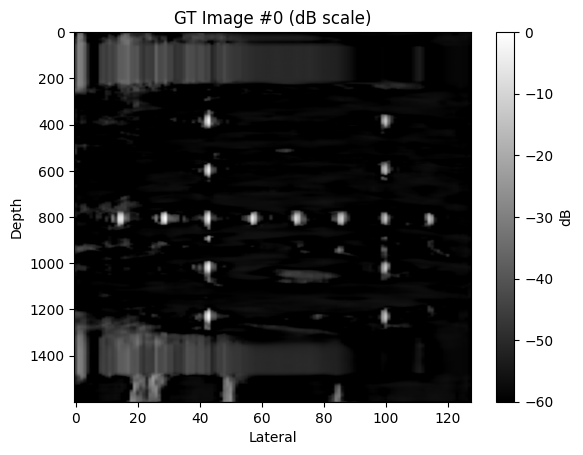

Training:  21%|██        | 42/200 [47:43<2:59:39, 68.23s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495487



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402295



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492551



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374312



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349729



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365027



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359899



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346085



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504312



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451784



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464542



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324941



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509988



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497521



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424353



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.554026



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363184



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470971



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398187



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432988



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358313



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420459



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490220



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429967



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508825



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437979



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.539446



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426940



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400999



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419843



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432746



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314354



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487990



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341253



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290793



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410307



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332739



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413235



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475314



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441387



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.513983



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.531347



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417040



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471159



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.557626



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377661



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413757



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449902



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389376



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412605



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493381



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364688



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411166



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392922



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411462



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391127



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374965



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371413



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471435



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370467



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466736



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404615



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465532



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438212



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384668



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400442



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490632



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319794



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455669



 97%|█████████▋| 69/71 [01:04<00:01,  1.06it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402677



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.368131



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.424505

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.392391, PSNR≈25.79, SSIM≈0.6609



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.320782, PSNR≈36.13, SSIM≈0.8388



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.443622, PSNR≈28.75, SSIM≈0.7480



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.372894, PSNR≈25.47, SSIM≈0.6615



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.362992, PSNR≈36.23, SSIM≈0.9017



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.377310, PSNR≈34.52, SSIM≈0.7886



Training:  22%|██▏       | 43/200 [48:51<2:58:20, 68.15s/it]

Batch 7/7: Loss=0.414689, PSNR≈37.85, SSIM≈0.9243

===> Validation finished. Avg Loss: 0.383526, Avg PSNR: 32.45, Avg SSIM: 0.7960
🔁 Learning Rate for next epoch: 0.005000
Epoch 43/200 | Train: 0.4245 | Val: 0.3835 | PSNR: 32.45 | SSIM: 0.7960
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511236



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389781



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520608



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451819



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353702



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421474



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519349



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376390



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390853



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412503



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479188



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427871



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318205



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456394



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519113



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398742



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326039



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370754



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296343



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469980



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455860



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471000



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464006



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424048



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408489



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402923



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395641



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.540960



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408908



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383358



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.552193



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478829



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430826



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296852



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.598784



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423907



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295685



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.526792



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443772



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281537



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508736



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464630



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460913



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462329



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432520



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359702



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.486622



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397967



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349616



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365800



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436233



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465405



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419677



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426050



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423565



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453850



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418209



 80%|████████  | 57/71 [00:52<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326591



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441009



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471803



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390310



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374858



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346481



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438688



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297953



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439971



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380104



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414454



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377462



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375105



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.494069



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.422470

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.394861, PSNR≈25.05, SSIM≈0.6886



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.322006, PSNR≈35.69, SSIM≈0.7923



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.87it/s]

Batch 3/7: Loss=0.444664, PSNR≈28.17, SSIM≈0.7246



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.376659, PSNR≈24.61, SSIM≈0.6734



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.78it/s]

Batch 5/7: Loss=0.370136, PSNR≈34.21, SSIM≈0.8666



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.78it/s]

Batch 6/7: Loss=0.375190, PSNR≈34.06, SSIM≈0.7875



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.80it/s]

Batch 7/7: Loss=0.412711, PSNR≈37.73, SSIM≈0.8959

===> Validation finished. Avg Loss: 0.385175, Avg PSNR: 32.32, Avg SSIM: 0.7903
🔁 Learning Rate for next epoch: 0.005000
Epoch 44/200 | Train: 0.4225 | Val: 0.3852 | PSNR: 32.32 | SSIM: 0.7903
torch.Size([16, 1, 1600, 128])


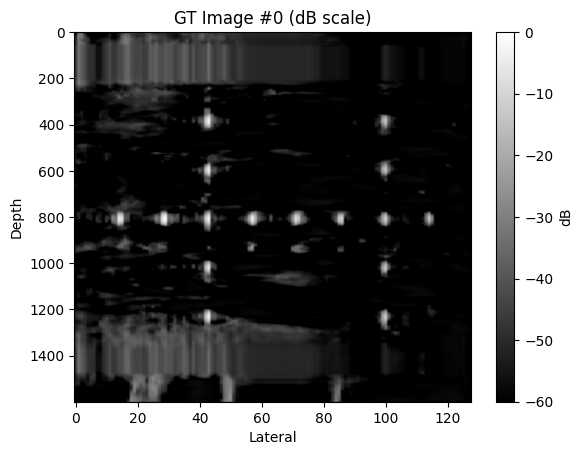

Training:  22%|██▏       | 44/200 [50:00<2:57:26, 68.25s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502690



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347471



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423250



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306879



  6%|▌         | 4/71 [00:03<01:01,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337388



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377361



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452266



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420413



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320600



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456287



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496903



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378012



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451495



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411939



 20%|█▉        | 14/71 [00:12<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477237



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446751



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505053



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441009



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420897



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326130



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413978



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417634



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415055



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341841



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391597



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.525260



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462077



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.502963



 39%|███▉      | 28/71 [00:25<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398147



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451283



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456787



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400914



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369229



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411405



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424406



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455365



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405668



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405946



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433808



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369378



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302814



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425745



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365307



 61%|██████    | 43/71 [00:39<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387651



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470166



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443395



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.476995



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459799



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396920



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424892



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470587



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453590



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365464



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454245



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359656



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313078



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370381



 80%|████████  | 57/71 [00:52<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367113



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451571



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.490482



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475954



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378800



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384784



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438739



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376650



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403925



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342565



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321700



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388758



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402135



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.526484



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.414692

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.371154, PSNR≈26.01, SSIM≈0.7204



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.298121, PSNR≈36.94, SSIM≈0.8577



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.408652, PSNR≈29.68, SSIM≈0.7700



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.344514, PSNR≈26.47, SSIM≈0.7022



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.343667, PSNR≈35.98, SSIM≈0.9137



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.353652, PSNR≈34.74, SSIM≈0.7872



Training:  22%|██▎       | 45/200 [51:08<2:56:02, 68.15s/it]

Batch 7/7: Loss=0.385285, PSNR≈38.09, SSIM≈0.9188

===> Validation finished. Avg Loss: 0.357864, Avg PSNR: 33.46, Avg SSIM: 0.8178
🔁 Learning Rate for next epoch: 0.005000
Epoch 45/200 | Train: 0.4147 | Val: 0.3579 | PSNR: 33.46 | SSIM: 0.8178
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363864



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438251



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339165



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461431



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435014



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462078



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455291



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427511



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340286



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383113



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448400



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339700



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396621



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413783



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404136



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399431



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401357



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417312



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382170



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361656



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419258



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421383



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437669



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401383



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392840



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424059



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409962



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405953



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337333



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332107



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411765



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381610



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440557



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448708



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268929



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398864



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375601



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296824



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504641



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405508



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505366



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437401



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373292



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430124



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333719



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409557



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413269



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481652



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443882



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374211



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412389



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479397



 73%|███████▎  | 52/71 [00:48<00:17,  1.06it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358093



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420876



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390128



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427461



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455540



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.522083



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445342



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392981



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423872



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415724



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396646



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407927



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437805



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352273



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362014



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358597



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356878



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449376



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.367260



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.405925

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.88it/s]

Batch 1/7: Loss=0.389861, PSNR≈26.26, SSIM≈0.7234



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.325898, PSNR≈34.62, SSIM≈0.7973



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.439080, PSNR≈27.96, SSIM≈0.7921



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.386823, PSNR≈25.80, SSIM≈0.7070



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.376379, PSNR≈34.37, SSIM≈0.8966



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.383490, PSNR≈33.24, SSIM≈0.7631



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.407700, PSNR≈37.90, SSIM≈0.9368

===> Validation finished. Avg Loss: 0.387033, Avg PSNR: 32.25, Avg SSIM: 0.8070
🔁 Learning Rate for next epoch: 0.005000
Epoch 46/200 | Train: 0.4059 | Val: 0.3870 | PSNR: 32.25 | SSIM: 0.8070
torch.Size([16, 1, 1600, 128])


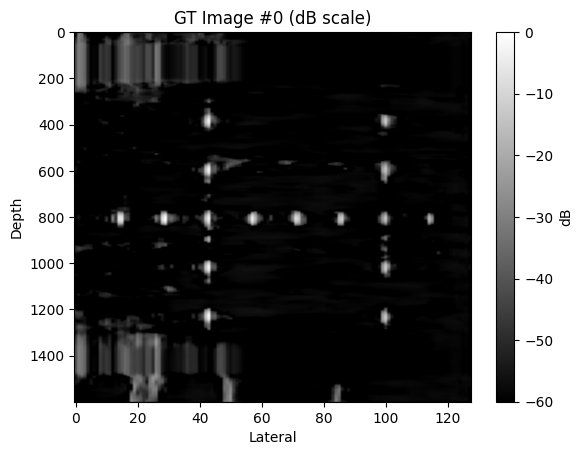

Training:  23%|██▎       | 46/200 [52:16<2:55:16, 68.29s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465916



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392607



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380625



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316018



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439125



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340691



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468431



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430282



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351620



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463506



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.553914



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422394



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407376



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342302



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417467



 21%|██        | 15/71 [00:13<00:51,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299933



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359383



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427753



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323174



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324223



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494231



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.494514



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385632



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416958



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405594



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463060



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487063



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505984



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302652



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425427



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411024



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444717



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371751



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524409



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441549



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325695



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398672



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471072



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313397



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489223



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398215



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495639



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373161



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332749



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456279



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403575



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368296



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352180



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355958



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434596



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436910



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382511



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384227



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428741



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491179



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312971



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452000



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418484



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386006



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344398



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448765



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329776



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406351



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301238



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397649



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.483242



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404387



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326516



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.493429



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388495



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.275150



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.405105

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.77it/s]

Batch 1/7: Loss=0.372365, PSNR≈26.05, SSIM≈0.7179



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.79it/s]

Batch 2/7: Loss=0.302488, PSNR≈36.42, SSIM≈0.8491



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.80it/s]

Batch 3/7: Loss=0.422559, PSNR≈28.71, SSIM≈0.7508



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.79it/s]

Batch 4/7: Loss=0.349673, PSNR≈26.12, SSIM≈0.7095



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.347068, PSNR≈35.94, SSIM≈0.9144



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.372986, PSNR≈34.07, SSIM≈0.7775



Training:  24%|██▎       | 47/200 [53:24<2:53:53, 68.19s/it]

Batch 7/7: Loss=0.387564, PSNR≈38.15, SSIM≈0.9312

===> Validation finished. Avg Loss: 0.364957, Avg PSNR: 33.11, Avg SSIM: 0.8215
🔁 Learning Rate for next epoch: 0.005000
Epoch 47/200 | Train: 0.4051 | Val: 0.3650 | PSNR: 33.11 | SSIM: 0.8215
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413000



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465993



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366051



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314400



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.500365



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310184



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349370



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342833



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372856



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458453



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466399



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303946



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399013



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405792



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367250



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351499



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405081



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426101



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352895



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.509854



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324234



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422533



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366926



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358064



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456509



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357066



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405492



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417407



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312594



 41%|████      | 29/71 [00:27<00:39,  1.06it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345710



 42%|████▏     | 30/71 [00:27<00:38,  1.06it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457368



 44%|████▎     | 31/71 [00:28<00:37,  1.06it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391435



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479356



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428469



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437954



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394629



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371715



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532014



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402822



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439927



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492796



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425471



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470698



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367712



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451919



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465110



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387987



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318084



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365267



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388500



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401059



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458550



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417350



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326137



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496358



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535397



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424757



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413279



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377116



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504912



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458261



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362226



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492509



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457314



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446588



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358909



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324790



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414043



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432034



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420654



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.419167



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.409275

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.372812, PSNR≈26.07, SSIM≈0.6878



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.303483, PSNR≈35.98, SSIM≈0.8470



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.417298, PSNR≈29.31, SSIM≈0.7937



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.347806, PSNR≈26.07, SSIM≈0.7000



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.344906, PSNR≈36.30, SSIM≈0.9137



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.358739, PSNR≈34.82, SSIM≈0.8135



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]

Batch 7/7: Loss=0.389656, PSNR≈37.94, SSIM≈0.9241

===> Validation finished. Avg Loss: 0.362100, Avg PSNR: 33.18, Avg SSIM: 0.8190
🔁 Learning Rate for next epoch: 0.005000
Epoch 48/200 | Train: 0.4093 | Val: 0.3621 | PSNR: 33.18 | SSIM: 0.8190
torch.Size([16, 1, 1600, 128])


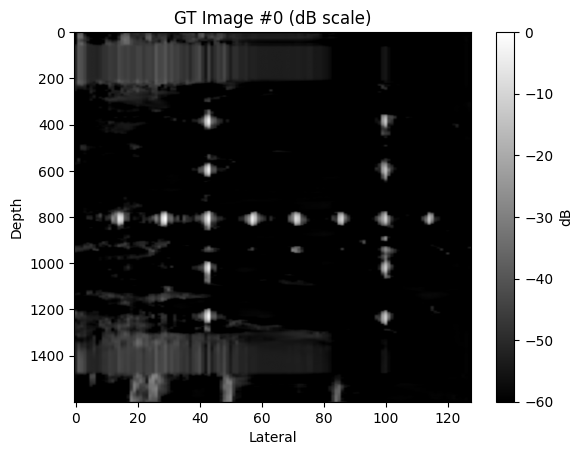

Training:  24%|██▍       | 48/200 [54:33<2:53:05, 68.33s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399299



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424381



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420031



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332797



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467957



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394182



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455740



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449870



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323719



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412119



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447715



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399890



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416932



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416916



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436912



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346172



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335533



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313715



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422059



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320390



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457422



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320170



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380993



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417942



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373040



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322395



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416577



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315451



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382934



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408452



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330130



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367204



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433257



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445744



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398174



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489854



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.534874



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383357



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474893



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428224



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426028



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422532



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343630



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389941



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345498



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378350



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373002



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381925



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373320



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405835



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467484



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410678



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380608



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362601



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344280



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332788



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390501



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329270



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378923



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413416



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452075



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402790



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383103



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314323



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374445



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451105



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381351



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409068



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327775



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413446



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.437192



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.394573

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.353027, PSNR≈27.30, SSIM≈0.7358



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.291727, PSNR≈36.76, SSIM≈0.8607



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.398919, PSNR≈29.38, SSIM≈0.8186



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.337291, PSNR≈27.20, SSIM≈0.7561



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.334859, PSNR≈35.47, SSIM≈0.9136



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.343840, PSNR≈34.85, SSIM≈0.8080



Training:  24%|██▍       | 49/200 [55:41<2:51:41, 68.22s/it]

Batch 7/7: Loss=0.370223, PSNR≈38.20, SSIM≈0.9180

===> Validation finished. Avg Loss: 0.347127, Avg PSNR: 33.60, Avg SSIM: 0.8346
🔁 Learning Rate for next epoch: 0.005000
Epoch 49/200 | Train: 0.3946 | Val: 0.3471 | PSNR: 33.60 | SSIM: 0.8346
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415971



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312850



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330470



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457552



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346412



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307776



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458491



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318483



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436313



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400791



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339588



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421577



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446605



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439527



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385155



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384530



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481253



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340014



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381490



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385477



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351912



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387701



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442432



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354860



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335661



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382519



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381372



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426229



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440369



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279206



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364795



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.461460



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311209



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325251



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.508582



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360653



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369153



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398471



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381901



 55%|█████▍    | 39/71 [00:36<00:30,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491522



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317569



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341191



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358290



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350378



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338071



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365438



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464755



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393303



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376065



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.462204



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426573



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393095



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401201



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447719



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409380



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389091



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.517089



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.448637



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343262



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399503



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424910



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411633



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348169



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282416



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349055



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349975



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395470



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482767



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411412



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309091



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.454390



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.390249

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.376103, PSNR≈26.06, SSIM≈0.7205



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.84it/s]

Batch 2/7: Loss=0.312122, PSNR≈35.75, SSIM≈0.8389



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.84it/s]

Batch 3/7: Loss=0.430227, PSNR≈28.58, SSIM≈0.7443



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.360751, PSNR≈26.24, SSIM≈0.7033



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.355939, PSNR≈35.99, SSIM≈0.9064



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.372476, PSNR≈34.50, SSIM≈0.8011



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

Batch 7/7: Loss=0.399166, PSNR≈37.80, SSIM≈0.9082

===> Validation finished. Avg Loss: 0.372398, Avg PSNR: 32.96, Avg SSIM: 0.8066
🔁 Learning Rate for next epoch: 0.005000
Epoch 50/200 | Train: 0.3902 | Val: 0.3724 | PSNR: 32.96 | SSIM: 0.8066
torch.Size([16, 1, 1600, 128])


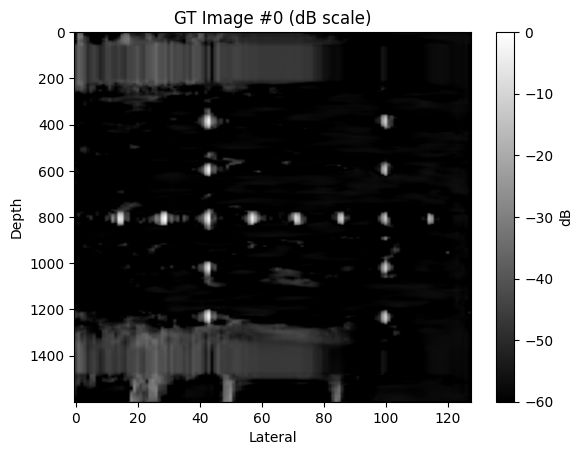

Training:  25%|██▌       | 50/200 [56:50<2:50:56, 68.38s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409956



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381035



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405437



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.471413



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441007



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.503090



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364432



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392052



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391193



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303395



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341240



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359453



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440296



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393396



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415156



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312561



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412697



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395219



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474226



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356283



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358321



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419590



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481615



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338376



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311163



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435184



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306828



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.498402



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355784



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317186



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301273



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437675



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359383



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418663



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365544



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341274



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332389



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408571



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312920



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371789



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354453



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408319



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316902



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445866



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410594



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393543



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380742



 66%|██████▌   | 47/71 [00:43<00:22,  1.06it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293189



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428332



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.474450



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407385



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389049



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407941



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433365



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416909



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311104



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399714



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438982



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441252



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423712



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271179



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.505003



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379982



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338976



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377298



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399544



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357703



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358838



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325921



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463479



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.430096



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.389004

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.360870, PSNR≈26.34, SSIM≈0.7459



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.300195, PSNR≈36.17, SSIM≈0.8261



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.408475, PSNR≈29.31, SSIM≈0.8042



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.345957, PSNR≈26.68, SSIM≈0.7449



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.343289, PSNR≈36.21, SSIM≈0.9219



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.356048, PSNR≈33.48, SSIM≈0.7846



Training:  26%|██▌       | 51/200 [57:58<2:49:30, 68.26s/it]

Batch 7/7: Loss=0.377227, PSNR≈37.77, SSIM≈0.9171

===> Validation finished. Avg Loss: 0.356009, Avg PSNR: 33.27, Avg SSIM: 0.8226
🔁 Learning Rate for next epoch: 0.005000
Epoch 51/200 | Train: 0.3890 | Val: 0.3560 | PSNR: 33.27 | SSIM: 0.8226
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.571759



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433192



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386538



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402026



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301292



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387977



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.483869



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310560



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479172



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417748



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492636



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322345



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272265



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358356



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.479283



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470895



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326624



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332857



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325043



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444779



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409004



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.475888



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405986



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418262



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367421



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357517



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349622



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.546734



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339271



 41%|████      | 29/71 [00:27<00:38,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399413



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358681



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452016



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403563



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415944



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364237



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348731



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383659



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398751



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383549



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470705



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411961



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341892



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327674



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422288



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312882



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393212



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369744



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419446



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380474



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424627



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339759



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317678



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362470



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349726



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.537730



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387617



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377804



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378051



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350878



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420905



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296566



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323710



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336150



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353879



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314322



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369873



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324878



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399496



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374484



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396542



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.482030



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.389393

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.91it/s]

Batch 1/7: Loss=0.344657, PSNR≈27.20, SSIM≈0.7620



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.282773, PSNR≈36.91, SSIM≈0.8558



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.391153, PSNR≈29.37, SSIM≈0.8429



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.327260, PSNR≈27.27, SSIM≈0.7720



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.328670, PSNR≈37.15, SSIM≈0.9208



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.337608, PSNR≈34.45, SSIM≈0.7964



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.359148, PSNR≈38.61, SSIM≈0.9184

===> Validation finished. Avg Loss: 0.338753, Avg PSNR: 33.79, Avg SSIM: 0.8386
🔁 Learning Rate for next epoch: 0.005000
Epoch 52/200 | Train: 0.3894 | Val: 0.3388 | PSNR: 33.79 | SSIM: 0.8386
torch.Size([16, 1, 1600, 128])


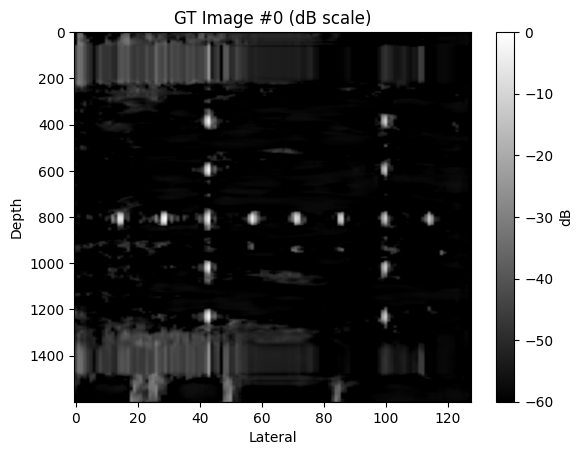

Training:  26%|██▌       | 52/200 [59:06<2:48:40, 68.38s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392094



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444449



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350631



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313676



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393433



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326274



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291888



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394689



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492295



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435264



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.496293



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.504895



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434772



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391094



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377444



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447853



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364185



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514613



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354906



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.532323



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358030



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336483



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.524493



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320741



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355665



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373766



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.454565



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374065



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376109



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354365



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396331



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361215



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385895



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355776



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438339



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407950



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314254



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378969



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325288



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344160



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385823



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.498663



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412806



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408867



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276593



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416981



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399896



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329424



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.482322



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322179



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392933



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.473502



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408097



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.478862



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447738



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399098



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338764



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375489



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423197



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338007



 85%|████████▍ | 60/71 [00:55<00:10,  1.06it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333773



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306050



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369319



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408896



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276083



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357745



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431635



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367661



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415766



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341122



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.240544



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.389399

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.81it/s]

Batch 1/7: Loss=0.353628, PSNR≈27.11, SSIM≈0.7610



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.288126, PSNR≈36.34, SSIM≈0.8434



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.400757, PSNR≈28.90, SSIM≈0.8087



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.337735, PSNR≈26.89, SSIM≈0.7558



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.335487, PSNR≈36.25, SSIM≈0.9191



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.349224, PSNR≈34.84, SSIM≈0.7808



Training:  26%|██▋       | 53/200 [1:00:14<2:47:14, 68.26s/it]

Batch 7/7: Loss=0.366123, PSNR≈38.29, SSIM≈0.9355

===> Validation finished. Avg Loss: 0.347297, Avg PSNR: 33.54, Avg SSIM: 0.8336
🔁 Learning Rate for next epoch: 0.005000
Epoch 53/200 | Train: 0.3894 | Val: 0.3473 | PSNR: 33.54 | SSIM: 0.8336
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355047



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441833



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419339



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365679



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352853



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363613



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290706



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456207



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464654



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410802



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432875



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456559



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456233



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316040



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405977



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318791



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459168



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408706



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296967



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388951



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295626



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339870



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364324



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432013



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352935



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378704



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433909



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324163



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422328



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328804



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464161



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376321



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359242



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373753



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417380



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384369



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318904



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407864



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334425



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416133



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.519107



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378224



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344793



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329259



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381085



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380517



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361979



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415541



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318890



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442916



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312297



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430595



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385839



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280987



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315901



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384630



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326356



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301774



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409240



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445067



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.481904



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332936



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353988



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418235



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431766



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431501



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336586



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256659



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311131



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449602



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.364422



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.380563

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.367749, PSNR≈26.72, SSIM≈0.7157



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.85it/s]

Batch 2/7: Loss=0.302235, PSNR≈35.72, SSIM≈0.8165



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.87it/s]

Batch 3/7: Loss=0.425725, PSNR≈27.81, SSIM≈0.7141



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.355420, PSNR≈26.40, SSIM≈0.7218



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.351658, PSNR≈36.96, SSIM≈0.9027



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.361029, PSNR≈34.02, SSIM≈0.7993



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.379551, PSNR≈38.07, SSIM≈0.9293

===> Validation finished. Avg Loss: 0.363338, Avg PSNR: 32.89, Avg SSIM: 0.8121
🔁 Learning Rate for next epoch: 0.005000
Epoch 54/200 | Train: 0.3806 | Val: 0.3633 | PSNR: 32.89 | SSIM: 0.8121
torch.Size([16, 1, 1600, 128])


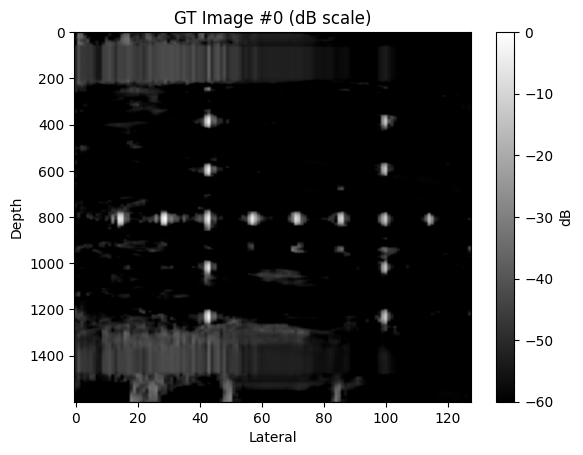

Training:  27%|██▋       | 54/200 [1:01:23<2:46:19, 68.35s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392407



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365229



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343391



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352918



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419368



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424097



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348246



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329173



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394837



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284550



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366982



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446860



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342579



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416574



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383116



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402576



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374826



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376354



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378410



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381841



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353417



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407911



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308373



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406951



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385235



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372007



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356456



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418374



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.491831



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389769



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342056



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310723



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423180



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332018



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413086



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413482



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334960



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470663



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386702



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339012



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306240



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396322



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425068



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312098



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372908



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407062



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413402



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292261



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426480



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407866



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422777



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511080



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276374



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326852



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417122



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401084



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370333



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291758



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357454



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393263



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381109



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440224



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339310



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376792



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289566



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369710



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344563



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317945



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3683
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403758



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438292



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2492
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.475088



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.378658

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.352801, PSNR≈27.36, SSIM≈0.7238



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.84it/s]

Batch 2/7: Loss=0.296717, PSNR≈36.62, SSIM≈0.8592



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.409873, PSNR≈28.81, SSIM≈0.7822



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.81it/s]

Batch 4/7: Loss=0.344852, PSNR≈27.24, SSIM≈0.7605



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.85it/s]

Batch 5/7: Loss=0.340597, PSNR≈35.65, SSIM≈0.8881



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.86it/s]

Batch 6/7: Loss=0.355680, PSNR≈34.40, SSIM≈0.8169



Training:  28%|██▊       | 55/200 [1:02:31<2:44:56, 68.26s/it]

Batch 7/7: Loss=0.370957, PSNR≈37.82, SSIM≈0.9128

===> Validation finished. Avg Loss: 0.353068, Avg PSNR: 33.15, Avg SSIM: 0.8195
🔁 Learning Rate for next epoch: 0.005000
Epoch 55/200 | Train: 0.3787 | Val: 0.3531 | PSNR: 33.15 | SSIM: 0.8195
No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395461



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.489959



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374861



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438177



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359955



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373710



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355336



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384979



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370205



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433174



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395123



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380268



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294768



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357452



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386959



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402279



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407515



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373666



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406413



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445157



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472014



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.485056



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373114



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.514935



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342484



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350231



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362589



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379912



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372810



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327835



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363714



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344930



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359886



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333575



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344069



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393302



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383438



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360380



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418783



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382814



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439847



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318965



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426338



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372787



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285697



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387912



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322914



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371817



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378437



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362744



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394672



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376450



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409196



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326189



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328588



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403129



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345282



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371745



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334976



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416254



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367001



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403203



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438036



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313175



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272242



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422091



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392567



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393031



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374939



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374938



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.266401



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.378632

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.343485, PSNR≈27.49, SSIM≈0.7717



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.288922, PSNR≈36.23, SSIM≈0.8363



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.400087, PSNR≈29.82, SSIM≈0.8028



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.338649, PSNR≈27.24, SSIM≈0.7722



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.85it/s]

Batch 5/7: Loss=0.330130, PSNR≈36.81, SSIM≈0.9236



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.350629, PSNR≈34.36, SSIM≈0.7844



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.367720, PSNR≈38.06, SSIM≈0.9337

===> Validation finished. Avg Loss: 0.345660, Avg PSNR: 33.48, Avg SSIM: 0.8371
🔁 Learning Rate for next epoch: 0.005000
Epoch 56/200 | Train: 0.3786 | Val: 0.3457 | PSNR: 33.48 | SSIM: 0.8371
torch.Size([16, 1, 1600, 128])


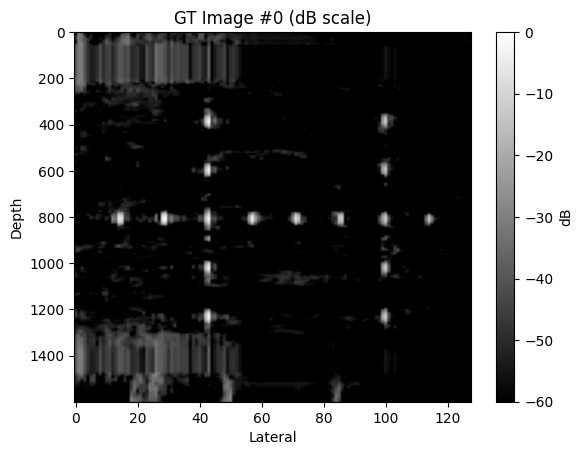

Training:  28%|██▊       | 56/200 [1:03:40<2:44:01, 68.34s/it]

No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368724



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384021



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391943



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343064



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356452



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385566



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292780



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376315



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350008



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362904



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398684



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431237



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332299



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261255



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372386



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257972



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460057



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369272



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413020



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334214



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451670



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357697



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363167



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351192



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356012



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.520231



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337420



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354544



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419321



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409923



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451417



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378580



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320676



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402585



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386341



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441908



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.470125



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329964



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429183



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.465361



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338936



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368037



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423326



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330832



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350796



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403850



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415451



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355558



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423259



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421900



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394360



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387470



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363218



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387134



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305409



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402918



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385025



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415313



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426128



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385657



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360190



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394670



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341884



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412947



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407959



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431859



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371180



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359610



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369437



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335771



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.397126



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.381784

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.80it/s]

Batch 1/7: Loss=0.345442, PSNR≈27.21, SSIM≈0.7716



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.76it/s]

Batch 2/7: Loss=0.285044, PSNR≈35.99, SSIM≈0.8120



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.389441, PSNR≈29.86, SSIM≈0.8363



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.75it/s]

Batch 4/7: Loss=0.331456, PSNR≈27.19, SSIM≈0.7662



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.80it/s]

Batch 5/7: Loss=0.327426, PSNR≈37.34, SSIM≈0.9136



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.338890, PSNR≈34.51, SSIM≈0.7940



Training:  28%|██▊       | 57/200 [1:04:48<2:42:38, 68.24s/it]

Batch 7/7: Loss=0.359975, PSNR≈38.10, SSIM≈0.9451

===> Validation finished. Avg Loss: 0.339668, Avg PSNR: 33.43, Avg SSIM: 0.8268
🔁 Learning Rate for next epoch: 0.005000
Epoch 57/200 | Train: 0.3818 | Val: 0.3397 | PSNR: 33.43 | SSIM: 0.8268
No improvement (5/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378056



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359518



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439058



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370930



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431586



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356991



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298049



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343355



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421892



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458249



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334477



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350940



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328868



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.545489



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353136



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349138



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337380



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415027



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289588



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325264



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294218



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337184



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442003



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.442219



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348845



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400233



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361555



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359094



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422969



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455732



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348127



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395286



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294427



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373609



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.472199



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.535924



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316369



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327004



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451987



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445622



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466585



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320965



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411124



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419016



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400334



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397341



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371063



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341177



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342187



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.487398



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290252



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394233



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301373



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340419



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319528



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337844



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.453807



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381899



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374034



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319997



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410113



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308501



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378163



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413622



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345447



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.492853



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406233



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314707



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.495291



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.464911



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.412758



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.383448

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.358920, PSNR≈26.55, SSIM≈0.7521



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.298362, PSNR≈36.46, SSIM≈0.8563



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.409079, PSNR≈29.79, SSIM≈0.8087



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.344537, PSNR≈26.59, SSIM≈0.7552



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.339787, PSNR≈35.79, SSIM≈0.9252



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.352440, PSNR≈33.87, SSIM≈0.7957



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]

Batch 7/7: Loss=0.378226, PSNR≈38.08, SSIM≈0.9195

===> Validation finished. Avg Loss: 0.354479, Avg PSNR: 33.30, Avg SSIM: 0.8301
🔁 Learning Rate for next epoch: 0.002500
Epoch 58/200 | Train: 0.3834 | Val: 0.3545 | PSNR: 33.30 | SSIM: 0.8301
torch.Size([16, 1, 1600, 128])


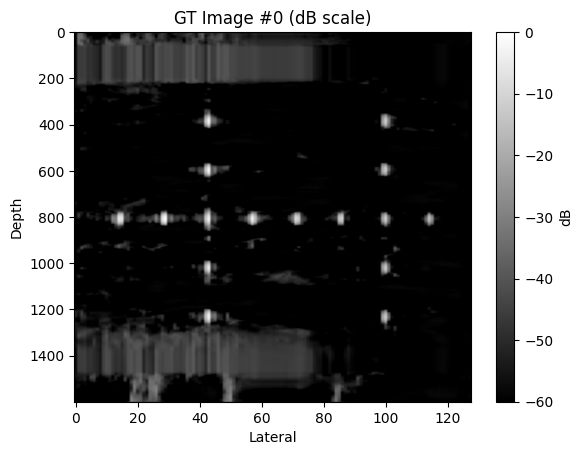

Training:  29%|██▉       | 58/200 [1:05:56<2:41:46, 68.36s/it]

No improvement (6/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.511247



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455866



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434059



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433552



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340746



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310644



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382213



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391426



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396011



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371715



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380099



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354208



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323568



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409672



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363180



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.455029



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252675



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.457356



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384170



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352482



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319849



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343745



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354098



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325417



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.480034



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335811



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423332



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371317



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349926



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352116



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282917



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379761



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421961



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426651



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296904



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326333



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352362



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296867



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344330



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342711



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450675



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350295



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353870



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304385



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313949



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333051



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402529



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369305



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436330



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294909



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330269



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352844



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330544



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392881



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325775



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383114



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292659



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428589



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339148



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392488



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319339



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357961



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369615



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347879



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257331



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395686



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340494



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422391



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426045



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302562



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.299607



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.364829

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.327103, PSNR≈28.07, SSIM≈0.7953



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.273908, PSNR≈36.94, SSIM≈0.8496



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.375346, PSNR≈29.84, SSIM≈0.7949



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.318989, PSNR≈27.97, SSIM≈0.8069



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.313025, PSNR≈35.96, SSIM≈0.9142



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.326886, PSNR≈34.82, SSIM≈0.8042



Training:  30%|██▉       | 59/200 [1:07:04<2:40:27, 68.28s/it]

Batch 7/7: Loss=0.342062, PSNR≈38.24, SSIM≈0.9327

===> Validation finished. Avg Loss: 0.325331, Avg PSNR: 34.11, Avg SSIM: 0.8497
🔁 Learning Rate for next epoch: 0.002500
Epoch 59/200 | Train: 0.3648 | Val: 0.3253 | PSNR: 34.11 | SSIM: 0.8497
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344183



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446691



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331940



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331596



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354255



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331800



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301398



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282040



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381198



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314228



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398920



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407496



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374804



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347580



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381361



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345863



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330273



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348537



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349311



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400146



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392519



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433037



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366400



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313850



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410070



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351843



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306371



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302364



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392817



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340109



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317536



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303525



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389149



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359274



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307164



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330318



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310444



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277622



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341920



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389202



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407418



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245118



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362118



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.451199



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374231



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305959



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378065



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355945



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304119



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355297



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318828



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371383



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407982



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346995



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385964



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391036



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366689



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342275



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262714



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384375



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321333



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380428



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361100



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341971



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348058



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.460208



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398637



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317270



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285348



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384497



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.302725



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.352936

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.99it/s]

Batch 1/7: Loss=0.321171, PSNR≈28.34, SSIM≈0.8108



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.266710, PSNR≈37.75, SSIM≈0.8835



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.363325, PSNR≈30.86, SSIM≈0.8555



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.313623, PSNR≈28.29, SSIM≈0.8108



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.307124, PSNR≈35.69, SSIM≈0.9156



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.318174, PSNR≈34.87, SSIM≈0.7983



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.335357, PSNR≈38.36, SSIM≈0.9405

===> Validation finished. Avg Loss: 0.317926, Avg PSNR: 34.31, Avg SSIM: 0.8632
🔁 Learning Rate for next epoch: 0.002500
Epoch 60/200 | Train: 0.3529 | Val: 0.3179 | PSNR: 34.31 | SSIM: 0.8632
torch.Size([16, 1, 1600, 128])


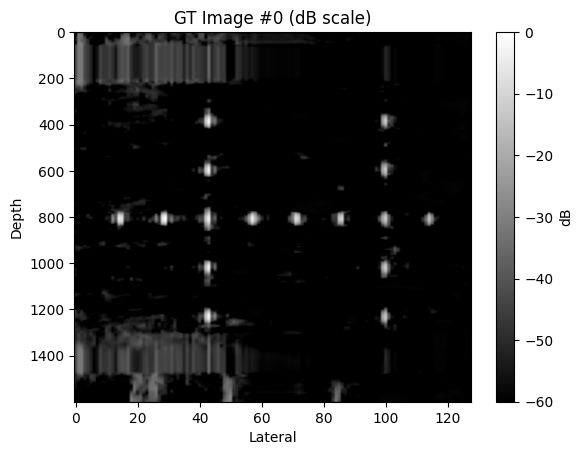

Training:  30%|███       | 60/200 [1:08:13<2:39:33, 68.38s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408982



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303424



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304352



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324404



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368240



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327298



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287875



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305406



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398650



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287402



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437025



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297463



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417367



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362282



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312376



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257388



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319888



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243279



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338031



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433118



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400140



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447486



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389946



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338226



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332583



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368471



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312401



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397121



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355329



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424192



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410569



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370822



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317239



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326889



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358912



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410916



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305770



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317492



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278618



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305494



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384995



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293555



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400112



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353082



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323613



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348374



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368137



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345694



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340027



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310863



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317537



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346848



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404010



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438841



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425986



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412752



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264320



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.447812



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378380



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338582



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276465



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291857



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389490



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402051



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372551



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343193



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361835



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382723



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347289



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345030



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0731
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.601676



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.355782

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.86it/s]

Batch 1/7: Loss=0.353840, PSNR≈26.59, SSIM≈0.7696



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.77it/s]

Batch 2/7: Loss=0.307679, PSNR≈36.06, SSIM≈0.8615



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.81it/s]

Batch 3/7: Loss=0.414178, PSNR≈29.21, SSIM≈0.8437



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.359564, PSNR≈27.40, SSIM≈0.7777



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.352775, PSNR≈35.61, SSIM≈0.9042



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.370177, PSNR≈33.81, SSIM≈0.7894



Training:  30%|███       | 61/200 [1:09:21<2:38:09, 68.27s/it]

Batch 7/7: Loss=0.380774, PSNR≈38.00, SSIM≈0.9394

===> Validation finished. Avg Loss: 0.362713, Avg PSNR: 32.78, Avg SSIM: 0.8395
🔁 Learning Rate for next epoch: 0.002500
Epoch 61/200 | Train: 0.3558 | Val: 0.3627 | PSNR: 32.78 | SSIM: 0.8395
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374390



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362951



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351579



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.204696



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344672



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376781



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388850



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323429



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343817



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350005



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399038



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415361



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441367



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272818



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262808



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400029



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.441741



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317984



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408595



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326597



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327979



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384878



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396038



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333653



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322285



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.497365



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318329



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324574



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357972



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411457



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364051



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398470



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335352



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364287



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358017



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346215



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340480



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391709



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433938



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280320



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402794



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382498



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321183



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348680



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291282



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371221



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415965



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349643



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275032



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373934



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369229



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264628



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366323



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380763



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331086



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316619



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415110



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399256



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317462



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333171



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333363



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357658



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339487



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344588



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292328



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383020



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376076



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331169



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380062



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286801



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2484
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.431444



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.356011

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.97it/s]

Batch 1/7: Loss=0.322766, PSNR≈28.14, SSIM≈0.8187



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.269064, PSNR≈37.06, SSIM≈0.8703



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.368911, PSNR≈30.33, SSIM≈0.8407



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.315588, PSNR≈27.82, SSIM≈0.8068



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.85it/s]

Batch 5/7: Loss=0.310323, PSNR≈36.36, SSIM≈0.9260



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.321902, PSNR≈34.71, SSIM≈0.7834



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]

Batch 7/7: Loss=0.336115, PSNR≈38.46, SSIM≈0.9494

===> Validation finished. Avg Loss: 0.320667, Avg PSNR: 34.19, Avg SSIM: 0.8609
🔁 Learning Rate for next epoch: 0.002500
Epoch 62/200 | Train: 0.3560 | Val: 0.3207 | PSNR: 34.19 | SSIM: 0.8609
torch.Size([16, 1, 1600, 128])


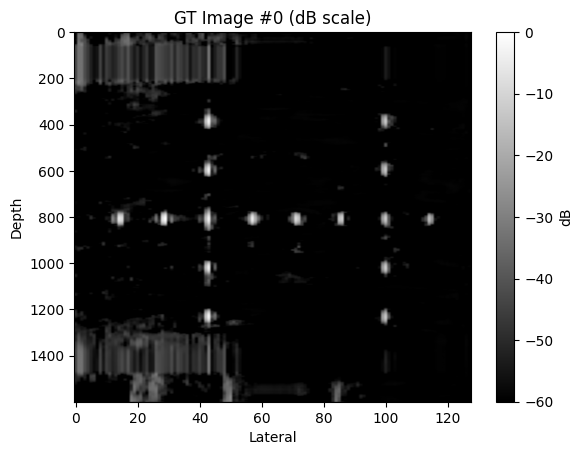

Training:  31%|███       | 62/200 [1:10:29<2:37:15, 68.37s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350462



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262170



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418918



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272549



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347654



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312409



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400388



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363127



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309830



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346760



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391169



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303946



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335168



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339596



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404330



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381932



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350322



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365852



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300377



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359253



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305270



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325533



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351110



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376977



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339630



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374172



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275000



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304914



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376081



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289897



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334041



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391493



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333261



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325505



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357761



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.449825



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329615



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368237



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321856



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341773



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413682



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267138



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425430



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372740



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468700



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399504



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404034



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361162



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355305



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329551



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357032



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376661



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334505



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276148



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396851



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365010



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388002



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318613



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406766



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414907



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262337



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320890



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327745



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375494



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270883



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329642



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.437742



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254931



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374509



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395038



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.311479



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.350431

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.321015, PSNR≈28.22, SSIM≈0.7958



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.81it/s]

Batch 2/7: Loss=0.267499, PSNR≈37.54, SSIM≈0.8801



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.82it/s]

Batch 3/7: Loss=0.368484, PSNR≈30.30, SSIM≈0.8376



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.313455, PSNR≈28.12, SSIM≈0.8122



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.307941, PSNR≈35.97, SSIM≈0.9230



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.321815, PSNR≈34.64, SSIM≈0.7884



Training:  32%|███▏      | 63/200 [1:11:38<2:35:53, 68.28s/it]

Batch 7/7: Loss=0.335316, PSNR≈38.72, SSIM≈0.9408

===> Validation finished. Avg Loss: 0.319361, Avg PSNR: 34.32, Avg SSIM: 0.8630
🔁 Learning Rate for next epoch: 0.002500
Epoch 63/200 | Train: 0.3504 | Val: 0.3194 | PSNR: 34.32 | SSIM: 0.8630
No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253006



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353828



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371875



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360126



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368086



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379220



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267268



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321925



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317723



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342751



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308214



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388622



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273235



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365225



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422360



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313717



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397351



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375265



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326192



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362384



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339337



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331444



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443573



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353550



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388014



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330242



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346482



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358492



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318203



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352828



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306559



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413533



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382324



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340384



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319624



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328634



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299227



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321222



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291874



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356386



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367595



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316042



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403109



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242794



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413880



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361735



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303527



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405544



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358277



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369775



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393208



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409130



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407275



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341362



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350147



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406531



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362728



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450076



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385438



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297993



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312946



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450241



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316072



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266534



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356269



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360825



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353200



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365106



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301389



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357644



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.217686



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.349217

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.76it/s]

Batch 1/7: Loss=0.321629, PSNR≈27.56, SSIM≈0.8173



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.73it/s]

Batch 2/7: Loss=0.265819, PSNR≈37.01, SSIM≈0.8505



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.82it/s]

Batch 3/7: Loss=0.364616, PSNR≈30.43, SSIM≈0.8375



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.311372, PSNR≈27.52, SSIM≈0.8070



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.307149, PSNR≈36.24, SSIM≈0.9300



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.318304, PSNR≈34.78, SSIM≈0.8000



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

Batch 7/7: Loss=0.334343, PSNR≈38.45, SSIM≈0.9510

===> Validation finished. Avg Loss: 0.317605, Avg PSNR: 34.15, Avg SSIM: 0.8614
🔁 Learning Rate for next epoch: 0.002500
Epoch 64/200 | Train: 0.3492 | Val: 0.3176 | PSNR: 34.15 | SSIM: 0.8614
torch.Size([16, 1, 1600, 128])


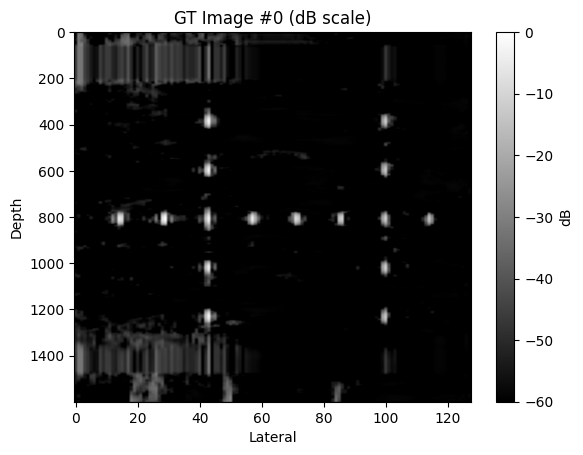

Training:  32%|███▏      | 64/200 [1:12:46<2:35:02, 68.40s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351719



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326262



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364571



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241950



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281463



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331000



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375815



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450408



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373441



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283063



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371854



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367740



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389527



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318466



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403169



 21%|██        | 15/71 [00:14<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369211



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351636



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391836



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251482



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360430



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316081



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424373



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381424



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365555



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319038



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268865



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396701



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350135



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.466001



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356723



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329713



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282851



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377314



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.426867



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326920



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383335



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274157



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290284



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254301



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298346



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343040



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357312



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289741



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368229



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332259



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321361



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263116



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324806



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402997



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321444



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292969



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380242



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309330



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323374



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361072



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298075



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319371



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412760



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396547



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392768



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309257



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354666



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374666



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384655



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314008



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357946



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389153



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352838



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378623



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368432



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.483917



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.348211

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.321018, PSNR≈28.12, SSIM≈0.7915



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.86it/s]

Batch 2/7: Loss=0.270196, PSNR≈36.59, SSIM≈0.8464



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.85it/s]

Batch 3/7: Loss=0.366301, PSNR≈30.96, SSIM≈0.8409



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.312174, PSNR≈28.11, SSIM≈0.7982



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.306869, PSNR≈36.88, SSIM≈0.9312



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.319488, PSNR≈34.82, SSIM≈0.8012



Training:  32%|███▎      | 65/200 [1:13:54<2:33:36, 68.27s/it]

Batch 7/7: Loss=0.335207, PSNR≈38.35, SSIM≈0.9397

===> Validation finished. Avg Loss: 0.318750, Avg PSNR: 34.09, Avg SSIM: 0.8530
🔁 Learning Rate for next epoch: 0.002500
Epoch 65/200 | Train: 0.3482 | Val: 0.3188 | PSNR: 34.09 | SSIM: 0.8530
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324558



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363971



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292916



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354426



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.432408



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372559



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430387



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458282



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408889



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340328



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367665



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360950



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295403



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363112



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333116



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334214



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371374



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369262



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381936



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375337



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324860



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394808



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313244



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342126



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385502



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355045



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310350



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370655



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329133



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369432



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346550



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345907



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326158



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343301



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355976



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374694



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295119



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372998



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384571



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344770



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371179



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348434



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281802



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357926



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342298



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360431



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282650



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263135



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342022



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434539



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344161



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329622



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301853



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280107



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386099



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365529



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377130



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260762



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352982



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352678



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323541



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337927



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286370



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297461



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275514



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310235



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419446



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320948



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316457



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282177



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.395570



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.346722

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.325566, PSNR≈28.07, SSIM≈0.8119



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.82it/s]

Batch 2/7: Loss=0.269413, PSNR≈36.85, SSIM≈0.8638



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.70it/s]

Batch 3/7: Loss=0.367959, PSNR≈30.14, SSIM≈0.8560



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.79it/s]

Batch 4/7: Loss=0.315884, PSNR≈27.95, SSIM≈0.8020



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.79it/s]

Batch 5/7: Loss=0.313406, PSNR≈36.20, SSIM≈0.9254



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.81it/s]

Batch 6/7: Loss=0.321646, PSNR≈34.90, SSIM≈0.7902



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

Batch 7/7: Loss=0.336803, PSNR≈38.22, SSIM≈0.9461

===> Validation finished. Avg Loss: 0.321525, Avg PSNR: 34.12, Avg SSIM: 0.8609
🔁 Learning Rate for next epoch: 0.002500
Epoch 66/200 | Train: 0.3467 | Val: 0.3215 | PSNR: 34.12 | SSIM: 0.8609
torch.Size([16, 1, 1600, 128])


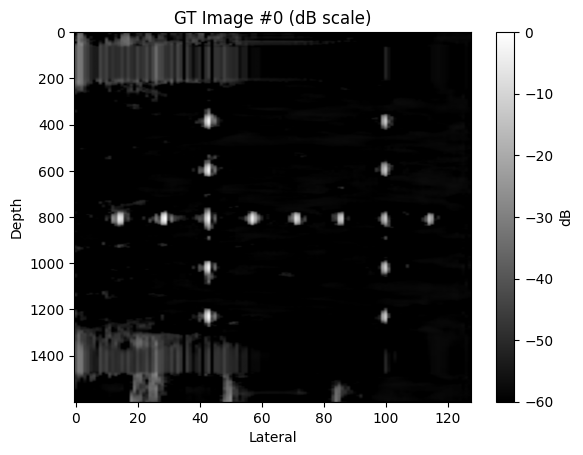

Training:  33%|███▎      | 66/200 [1:15:03<2:32:43, 68.38s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321238



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369991



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286666



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318045



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368149



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390916



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308405



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297482



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356341



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363198



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354003



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298690



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414054



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360490



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340683



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311439



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379661



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282348



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357579



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371978



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346522



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382250



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390506



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300235



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260188



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406276



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402366



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348444



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277249



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305234



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312265



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287122



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317690



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342406



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352459



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326515



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392005



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375475



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347529



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422463



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345914



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396646



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330693



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283635



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315070



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317786



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369126



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367594



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352443



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414904



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319146



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392100



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392152



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376450



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374709



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313802



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286981



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370366



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382192



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403275



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268441



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387851



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340317



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326539



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387095



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319665



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281139



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398451



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307258



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307767



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.287542



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.344558

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.71it/s]

Batch 1/7: Loss=0.315997, PSNR≈28.40, SSIM≈0.8187



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.67it/s]

Batch 2/7: Loss=0.263278, PSNR≈37.30, SSIM≈0.8802



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.67it/s]

Batch 3/7: Loss=0.359886, PSNR≈30.62, SSIM≈0.8598



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.70it/s]

Batch 4/7: Loss=0.309975, PSNR≈28.23, SSIM≈0.8207



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.76it/s]

Batch 5/7: Loss=0.304116, PSNR≈35.93, SSIM≈0.9122



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.80it/s]

Batch 6/7: Loss=0.316216, PSNR≈34.81, SSIM≈0.7970



Training:  34%|███▎      | 67/200 [1:16:11<2:31:23, 68.30s/it]

Batch 7/7: Loss=0.329482, PSNR≈38.91, SSIM≈0.9428

===> Validation finished. Avg Loss: 0.314136, Avg PSNR: 34.43, Avg SSIM: 0.8646
🔁 Learning Rate for next epoch: 0.002500
Epoch 67/200 | Train: 0.3446 | Val: 0.3141 | PSNR: 34.43 | SSIM: 0.8646
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312396



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354053



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390189



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360811



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384343



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324697



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300589



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335046



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348983



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347584



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358703



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406382



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434425



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347775



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407107



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292503



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387396



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308683



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381115



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328086



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422295



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289118



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400094



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397228



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362401



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377923



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391532



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255035



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356383



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370779



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295518



 44%|████▎     | 31/71 [00:28<00:37,  1.06it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315278



 45%|████▌     | 32/71 [00:29<00:36,  1.06it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332332



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291873



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327059



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.440829



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270488



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415991



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286812



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326627



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318960



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324816



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356962



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368734



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371902



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375003



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347258



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389480



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368644



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293003



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264202



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354873



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346486



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302364



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317776



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403974



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309785



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401910



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288059



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404167



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327820



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334385



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320605



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349258



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289477



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317391



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286078



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297914



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324535



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332459



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.370820



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.345008

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.91it/s]

Batch 1/7: Loss=0.317002, PSNR≈28.33, SSIM≈0.8074



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.84it/s]

Batch 2/7: Loss=0.265130, PSNR≈37.71, SSIM≈0.8849



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.84it/s]

Batch 3/7: Loss=0.364515, PSNR≈30.64, SSIM≈0.8670



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.312783, PSNR≈28.43, SSIM≈0.8195



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.305714, PSNR≈35.80, SSIM≈0.9145



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.321913, PSNR≈35.01, SSIM≈0.7907



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.332093, PSNR≈38.71, SSIM≈0.9512

===> Validation finished. Avg Loss: 0.317021, Avg PSNR: 34.34, Avg SSIM: 0.8667
🔁 Learning Rate for next epoch: 0.002500
Epoch 68/200 | Train: 0.3450 | Val: 0.3170 | PSNR: 34.34 | SSIM: 0.8667
torch.Size([16, 1, 1600, 128])


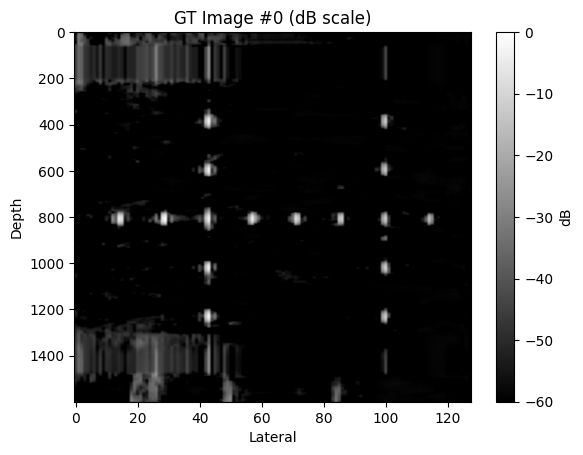

Training:  34%|███▍      | 68/200 [1:17:20<2:30:30, 68.41s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352748



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295930



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393869



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342922



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450459



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252336



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322433



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278884



 11%|█▏        | 8/71 [00:07<00:59,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364842



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288637



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359443



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340532



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333725



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352495



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358799



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397205



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357956



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326688



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341279



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339009



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391624



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405669



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322842



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345133



 34%|███▍      | 24/71 [00:22<00:44,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357496



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350093



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265419



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370152



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317738



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421465



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334878



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333976



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380273



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341556



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355890



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435238



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341598



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357211



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367033



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264357



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234540



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345594



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369582



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368345



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369241



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376610



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348626



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310116



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369073



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294397



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323134



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303952



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291220



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366443



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347356



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391595



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263297



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345078



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283748



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428844



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325720



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343852



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396075



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271061



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368710



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303908



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304222



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324422



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294796



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382300



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.309843



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.341768

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.316154, PSNR≈28.25, SSIM≈0.8212



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.263716, PSNR≈38.12, SSIM≈0.8859



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.85it/s]

Batch 3/7: Loss=0.360068, PSNR≈30.32, SSIM≈0.8700



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.311869, PSNR≈28.35, SSIM≈0.8207



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.78it/s]

Batch 5/7: Loss=0.306102, PSNR≈35.65, SSIM≈0.8953



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.317014, PSNR≈34.85, SSIM≈0.8185



Training:  34%|███▍      | 69/200 [1:18:28<2:29:09, 68.32s/it]

Batch 7/7: Loss=0.328955, PSNR≈38.50, SSIM≈0.9500

===> Validation finished. Avg Loss: 0.314840, Avg PSNR: 34.36, Avg SSIM: 0.8656
🔁 Learning Rate for next epoch: 0.002500
Epoch 69/200 | Train: 0.3418 | Val: 0.3148 | PSNR: 34.36 | SSIM: 0.8656
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354109



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240396



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332891



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357057



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370291



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334691



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.2494
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446809



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325166



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341878



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356483



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321633



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301300



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302658



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271708



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321080



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335477



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263701



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366834



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357150



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342289



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361289



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313914



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335301



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309492



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377800



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341209



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338634



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266968



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324654



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291862



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341070



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344325



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313826



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324992



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354734



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322175



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290645



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343142



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367815



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279371



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346087



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336109



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361899



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349388



 62%|██████▏   | 44/71 [00:41<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384167



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321242



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400945



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324827



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349653



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391280



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376816



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311509



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352709



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377923



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388861



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259938



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342244



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283805



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431727



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321652



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332075



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392058



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366315



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421916



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317447



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379205



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370420



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326186



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360340



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389116



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.249039



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.339489

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.83it/s]

Batch 1/7: Loss=0.325538, PSNR≈28.18, SSIM≈0.8233



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.89it/s]

Batch 2/7: Loss=0.281736, PSNR≈37.17, SSIM≈0.8733



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.84it/s]

Batch 3/7: Loss=0.385546, PSNR≈29.02, SSIM≈0.7889



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.322344, PSNR≈28.19, SSIM≈0.8121



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.87it/s]

Batch 5/7: Loss=0.316970, PSNR≈37.79, SSIM≈0.9310



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.333332, PSNR≈33.92, SSIM≈0.7947



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

Batch 7/7: Loss=0.345122, PSNR≈38.17, SSIM≈0.9285

===> Validation finished. Avg Loss: 0.330084, Avg PSNR: 33.84, Avg SSIM: 0.8531
🔁 Learning Rate for next epoch: 0.002500
Epoch 70/200 | Train: 0.3395 | Val: 0.3301 | PSNR: 33.84 | SSIM: 0.8531
torch.Size([16, 1, 1600, 128])


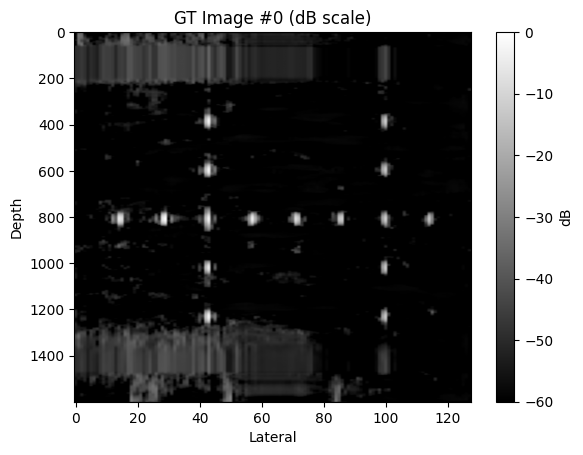

Training:  35%|███▌      | 70/200 [1:19:36<2:28:16, 68.43s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326737



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332579



  3%|▎         | 2/71 [00:01<01:03,  1.09it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417224



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240776



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305044



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366544



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.438702



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331286



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323681



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353906



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302237



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390801



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.445989



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339399



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298557



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.2491
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463131



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280348



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333001



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320427



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340442



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354109



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348903



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239024



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311076



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318259



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397800



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313082



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309802



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342640



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291178



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279184



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393721



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313054



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301439



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304701



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348212



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318123



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389518



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303552



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307507



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364661



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391253



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396389



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355505



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414656



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367500



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270481



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354187



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299820



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300918



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364488



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278800



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391447



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367280



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314148



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360594



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358522



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379910



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282108



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.469606



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370544



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314912



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357792



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319552



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299124



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293039



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347352



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357147



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296858



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396457



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2496
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.387509



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.341666

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.312349, PSNR≈28.66, SSIM≈0.8178



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.262013, PSNR≈37.99, SSIM≈0.8890



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.354353, PSNR≈30.89, SSIM≈0.8688



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.306226, PSNR≈28.66, SSIM≈0.8253



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.300607, PSNR≈36.49, SSIM≈0.9282



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.311542, PSNR≈34.92, SSIM≈0.8101



Training:  36%|███▌      | 71/200 [1:20:44<2:26:52, 68.32s/it]

Batch 7/7: Loss=0.325469, PSNR≈38.25, SSIM≈0.9479

===> Validation finished. Avg Loss: 0.310366, Avg PSNR: 34.50, Avg SSIM: 0.8702
🔁 Learning Rate for next epoch: 0.002500
Epoch 71/200 | Train: 0.3417 | Val: 0.3104 | PSNR: 34.50 | SSIM: 0.8702
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398794



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348088



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270794



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386743



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407530



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312885



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322236



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285135



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390721



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346891



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354935



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411266



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319519



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328148



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348089



 21%|██        | 15/71 [00:14<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286317



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381041



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335620



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424572



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276526



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295924



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312898



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335602



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313603



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377773



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332412



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327733



 38%|███▊      | 27/71 [00:25<00:41,  1.06it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342086



 39%|███▉      | 28/71 [00:26<00:40,  1.06it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300047



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355856



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280781



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337681



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283487



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318454



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349508



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302063



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381010



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356155



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267574



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288472



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340990



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395155



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257581



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295279



 62%|██████▏   | 44/71 [00:41<00:25,  1.06it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377939



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377144



 65%|██████▍   | 46/71 [00:42<00:23,  1.06it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322315



 66%|██████▌   | 47/71 [00:43<00:22,  1.06it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374318



 68%|██████▊   | 48/71 [00:44<00:21,  1.06it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343126



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362655



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365710



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320320



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302623



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367926



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408116



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353073



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317726



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261175



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328350



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317863



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477153



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404867



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265830



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396441



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304587



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343889



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366085



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276121



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325656



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387520



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.202732



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.337116

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.89it/s]

Batch 1/7: Loss=0.313503, PSNR≈28.54, SSIM≈0.8049



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.263661, PSNR≈38.13, SSIM≈0.8907



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.85it/s]

Batch 3/7: Loss=0.359040, PSNR≈30.55, SSIM≈0.8640



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.311247, PSNR≈28.47, SSIM≈0.8175



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.305136, PSNR≈35.58, SSIM≈0.9118



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.86it/s]

Batch 6/7: Loss=0.315943, PSNR≈34.54, SSIM≈0.8294



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]

Batch 7/7: Loss=0.327099, PSNR≈39.05, SSIM≈0.9399

===> Validation finished. Avg Loss: 0.313661, Avg PSNR: 34.45, Avg SSIM: 0.8653
🔁 Learning Rate for next epoch: 0.002500
Epoch 72/200 | Train: 0.3371 | Val: 0.3137 | PSNR: 34.45 | SSIM: 0.8653
torch.Size([16, 1, 1600, 128])


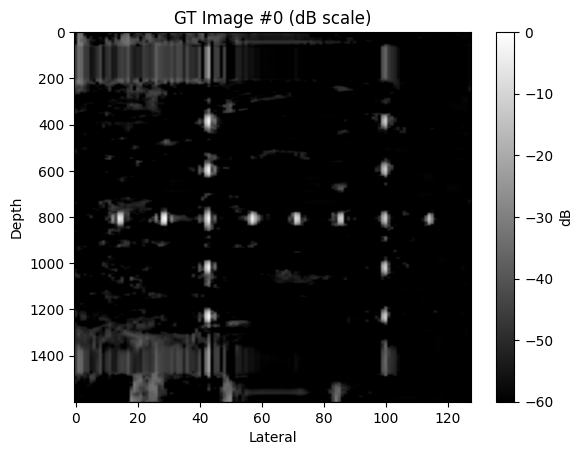

Training:  36%|███▌      | 72/200 [1:21:53<2:26:01, 68.45s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352738



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428140



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407665



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339883



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328137



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324738



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429738



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317779



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242937



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296785



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356214



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306620



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381221



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264528



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379065



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318119



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319722



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424833



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398039



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324965



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443993



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352016



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319642



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289702



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369192



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294522



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289282



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290841



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357157



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313544



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332663



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296057



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292589



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351899



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338396



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327911



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316962



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343064



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290574



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348809



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351275



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352538



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331310



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229795



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.444338



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361958



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314491



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393701



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398927



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367952



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400499



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329667



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416184



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291182



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350236



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257174



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436854



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.213519



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367551



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349030



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330803



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328269



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291617



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408567



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369445



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351921



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277076



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300257



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324662



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358542



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0676
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.384829



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.340632

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.332802, PSNR≈27.42, SSIM≈0.7993



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.78it/s]

Batch 2/7: Loss=0.279751, PSNR≈35.50, SSIM≈0.8427



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.378216, PSNR≈30.47, SSIM≈0.8516



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.323202, PSNR≈27.15, SSIM≈0.7952



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.79it/s]

Batch 5/7: Loss=0.318257, PSNR≈36.12, SSIM≈0.9206



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.83it/s]

Batch 6/7: Loss=0.329704, PSNR≈34.43, SSIM≈0.7710



Training:  36%|███▋      | 73/200 [1:23:01<2:24:37, 68.33s/it]

Batch 7/7: Loss=0.348213, PSNR≈37.78, SSIM≈0.9341

===> Validation finished. Avg Loss: 0.330021, Avg PSNR: 33.52, Avg SSIM: 0.8482
🔁 Learning Rate for next epoch: 0.002500
Epoch 73/200 | Train: 0.3406 | Val: 0.3300 | PSNR: 33.52 | SSIM: 0.8482
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317977



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349934



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.2491
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.515212



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393516



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439798



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413701



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371060



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327277



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418169



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296427



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336625



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361347



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327934



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390071



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424197



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283589



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304539



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443291



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375682



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375306



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378732



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317744



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349597



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383464



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346534



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340016



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412765



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319696



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335779



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272856



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335311



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290439



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372786



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370127



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401673



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317300



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300889



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315364



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318062



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332666



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411133



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318730



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291056



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282711



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357717



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257865



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357490



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325442



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359479



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309377



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.446861



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356342



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318185



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272444



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412547



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312360



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286627



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370695



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416110



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357636



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308009



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377044



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342937



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358609



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343298



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284742



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316631



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320656



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309773



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358531



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2482
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.444530



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.350183

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.89it/s]

Batch 1/7: Loss=0.314070, PSNR≈28.26, SSIM≈0.8358



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.265261, PSNR≈37.81, SSIM≈0.8862



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.359063, PSNR≈30.88, SSIM≈0.8649



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.307643, PSNR≈28.43, SSIM≈0.8302



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.303830, PSNR≈36.87, SSIM≈0.9274



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.313752, PSNR≈35.06, SSIM≈0.8310



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.330641, PSNR≈38.47, SSIM≈0.9335

===> Validation finished. Avg Loss: 0.313466, Avg PSNR: 34.46, Avg SSIM: 0.8686
🔁 Learning Rate for next epoch: 0.002500
Epoch 74/200 | Train: 0.3502 | Val: 0.3135 | PSNR: 34.46 | SSIM: 0.8686
torch.Size([16, 1, 1600, 128])


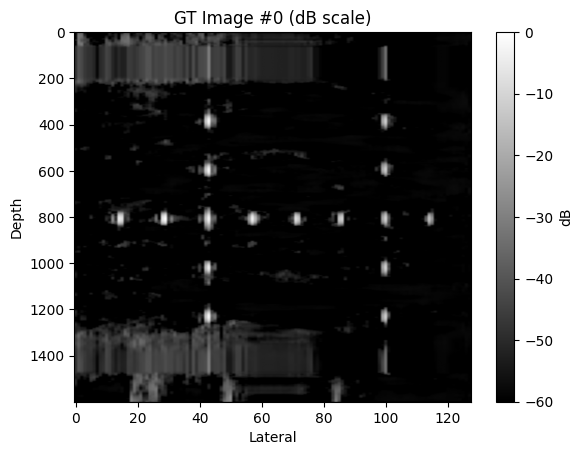

Training:  37%|███▋      | 74/200 [1:24:10<2:23:49, 68.49s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404034



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415020



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379136



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311128



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336149



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.417860



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339296



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300402



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359240



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349353



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288185



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379660



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290823



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393585



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303777



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296919



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340875



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372771



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287736



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329435



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345085



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283545



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313802



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322252



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398062



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349499



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340682



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331772



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334266



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302993



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281508



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356364



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376451



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284302



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369413



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308734



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401282



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343159



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291281



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305318



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314525



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259296



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323968



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261780



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330130



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367634



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360063



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310615



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386592



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274015



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338452



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356327



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468822



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350051



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379646



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416320



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356159



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354412



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298116



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383970



 85%|████████▍ | 60/71 [00:55<00:10,  1.06it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313824



 86%|████████▌ | 61/71 [00:56<00:09,  1.06it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279608



 87%|████████▋ | 62/71 [00:57<00:08,  1.06it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347786



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317333



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371657



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329505



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266190



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384646



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327402



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289058



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.268478



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.336923

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.312526, PSNR≈27.94, SSIM≈0.8151



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.260336, PSNR≈37.81, SSIM≈0.8869



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.90it/s]

Batch 3/7: Loss=0.354309, PSNR≈30.92, SSIM≈0.8706



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.302799, PSNR≈28.56, SSIM≈0.8320



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.297925, PSNR≈37.01, SSIM≈0.9304



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.308983, PSNR≈34.83, SSIM≈0.7866



Training:  38%|███▊      | 75/200 [1:25:18<2:22:25, 68.37s/it]

Batch 7/7: Loss=0.326247, PSNR≈38.39, SSIM≈0.9486

===> Validation finished. Avg Loss: 0.309018, Avg PSNR: 34.47, Avg SSIM: 0.8706
🔁 Learning Rate for next epoch: 0.002500
Epoch 75/200 | Train: 0.3369 | Val: 0.3090 | PSNR: 34.47 | SSIM: 0.8706
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372757



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350212



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355241



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347576



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287543



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402045



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354792



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300278



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355330



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293208



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272761



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321996



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307720



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388469



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356214



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381670



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379770



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320495



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352340



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352875



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307277



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337556



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342182



 32%|███▏      | 23/71 [00:21<00:45,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434686



 34%|███▍      | 24/71 [00:22<00:44,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336081



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371655



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350153



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327301



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361541



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319372



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289442



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349571



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315568



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262301



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304885



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259401



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339383



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397810



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352904



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434335



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413286



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277932



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308385



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374500



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456715



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344005



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345149



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267168



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397176



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383995



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340716



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326186



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304874



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314646



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327190



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348180



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317177



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276650



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346380



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301659



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289341



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318320



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300025



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332586



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364778



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321458



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243376



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291750



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338154



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396654



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.327121



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.337215

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.73it/s]

Batch 1/7: Loss=0.311679, PSNR≈28.50, SSIM≈0.8028



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.77it/s]

Batch 2/7: Loss=0.259888, PSNR≈37.86, SSIM≈0.8900



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.84it/s]

Batch 3/7: Loss=0.358290, PSNR≈30.43, SSIM≈0.8736



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.88it/s]

Batch 4/7: Loss=0.308000, PSNR≈28.50, SSIM≈0.8280



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.301666, PSNR≈35.96, SSIM≈0.9134



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.313262, PSNR≈34.74, SSIM≈0.7868



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

Batch 7/7: Loss=0.324484, PSNR≈39.06, SSIM≈0.9519

===> Validation finished. Avg Loss: 0.311038, Avg PSNR: 34.46, Avg SSIM: 0.8705
🔁 Learning Rate for next epoch: 0.002500
Epoch 76/200 | Train: 0.3372 | Val: 0.3110 | PSNR: 34.46 | SSIM: 0.8705
torch.Size([16, 1, 1600, 128])


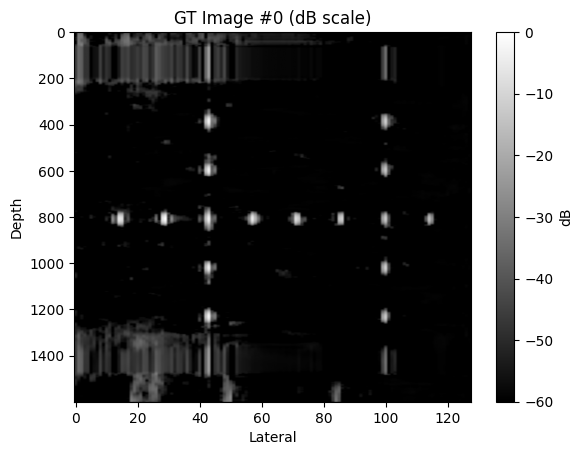

Training:  38%|███▊      | 76/200 [1:26:27<2:21:33, 68.50s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316711



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286391



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403484



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370682



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308480



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311633



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296504



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354069



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271920



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374695



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418375



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341911



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339193



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392558



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310500



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322816



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349945



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267693



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309349



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274416



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292998



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343130



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317799



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391796



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382229



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265962



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371190



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322617



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340125



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320878



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319828



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429367



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298417



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345754



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406535



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334021



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345515



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310062



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295469



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362492



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337662



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337151



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393428



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350256



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322461



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.427418



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365896



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286069



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320196



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321282



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263228



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235704



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362733



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328147



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301042



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386140



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398128



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308967



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381200



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366322



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316932



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315621



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294102



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336462



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354679



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379770



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386249



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326168



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306353



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369748



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.325961



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.336943

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.309962, PSNR≈28.65, SSIM≈0.7855



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.259003, PSNR≈37.92, SSIM≈0.8879



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.352755, PSNR≈30.93, SSIM≈0.8542



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.302393, PSNR≈28.67, SSIM≈0.7948



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.296317, PSNR≈36.58, SSIM≈0.9248



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.309320, PSNR≈34.51, SSIM≈0.8009



Training:  38%|███▊      | 77/200 [1:27:35<2:20:06, 68.35s/it]

Batch 7/7: Loss=0.323378, PSNR≈38.38, SSIM≈0.9439

===> Validation finished. Avg Loss: 0.307590, Avg PSNR: 34.55, Avg SSIM: 0.8702
🔁 Learning Rate for next epoch: 0.002500
Epoch 77/200 | Train: 0.3369 | Val: 0.3076 | PSNR: 34.55 | SSIM: 0.8702
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320845



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272101



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325650



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317217



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301995



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352077



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345068



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314852



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335951



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340233



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296564



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341398



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270685



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323775



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250483



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.468674



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356982



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380775



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414335



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406450



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308964



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334012



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295788



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352270



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364907



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308068



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304324



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374526



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362858



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392476



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266506



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274698



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275113



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287002



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369578



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301293



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342616



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280003



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223614



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257335



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289704



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359147



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318088



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309129



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279573



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316657



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385466



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314892



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369609



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307029



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364551



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384529



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404298



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362499



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381203



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342750



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335072



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306045



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302406



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321338



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343187



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333674



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336891



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313660



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341360



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450129



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352479



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404379



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371543



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376942



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.301555



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.333688

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.307698, PSNR≈28.68, SSIM≈0.8223



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.260166, PSNR≈37.15, SSIM≈0.8644



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.353173, PSNR≈30.97, SSIM≈0.8436



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.302152, PSNR≈28.77, SSIM≈0.8156



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.295890, PSNR≈36.68, SSIM≈0.9345



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.309036, PSNR≈34.73, SSIM≈0.8160



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.322504, PSNR≈38.49, SSIM≈0.9470

===> Validation finished. Avg Loss: 0.307231, Avg PSNR: 34.53, Avg SSIM: 0.8695
🔁 Learning Rate for next epoch: 0.002500
Epoch 78/200 | Train: 0.3337 | Val: 0.3072 | PSNR: 34.53 | SSIM: 0.8695
torch.Size([16, 1, 1600, 128])


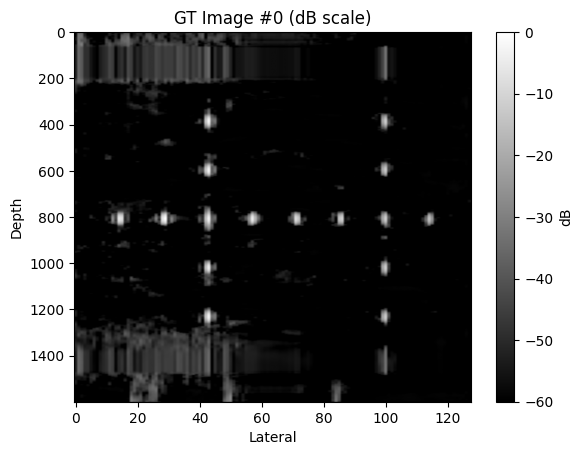

Training:  39%|███▉      | 78/200 [1:28:44<2:19:11, 68.46s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342086



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301160



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352480



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338796



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365675



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330514



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398844



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375025



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321160



 13%|█▎        | 9/71 [00:08<00:58,  1.06it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296526



 14%|█▍        | 10/71 [00:09<00:57,  1.06it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374983



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389481



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320276



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299366



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316640



 21%|██        | 15/71 [00:14<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385687



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317919



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387856



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378969



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389709



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338677



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386599



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284409



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302583



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319626



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301267



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311078



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325908



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302637



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261099



 42%|████▏     | 30/71 [00:28<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318346



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326561



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275536



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342813



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330828



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421848



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316039



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324333



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239745



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334206



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249089



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348297



 59%|█████▉    | 42/71 [00:39<00:27,  1.06it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357909



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364964



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408557



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428686



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280706



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274247



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310560



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350563



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352263



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331819



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319690



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314789



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374904



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347952



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354214



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295389



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299419



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351866



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346119



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323914



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379246



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321289



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251851



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263677



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367751



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277789



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349036



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336169



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.347356



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.332780

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.81it/s]

Batch 1/7: Loss=0.309749, PSNR≈28.77, SSIM≈0.8423



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.71it/s]

Batch 2/7: Loss=0.260976, PSNR≈38.01, SSIM≈0.8873



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.75it/s]

Batch 3/7: Loss=0.353818, PSNR≈30.59, SSIM≈0.8448



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.303485, PSNR≈28.80, SSIM≈0.8118



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.87it/s]

Batch 5/7: Loss=0.298384, PSNR≈36.97, SSIM≈0.9332



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.310078, PSNR≈34.93, SSIM≈0.8088



Training:  40%|███▉      | 79/200 [1:29:52<2:17:52, 68.37s/it]

Batch 7/7: Loss=0.325280, PSNR≈38.08, SSIM≈0.9307

===> Validation finished. Avg Loss: 0.308824, Avg PSNR: 34.53, Avg SSIM: 0.8703
🔁 Learning Rate for next epoch: 0.002500
Epoch 79/200 | Train: 0.3328 | Val: 0.3088 | PSNR: 34.53 | SSIM: 0.8703
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317358



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346084



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350708



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353559



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318400



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269509



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352824



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310705



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305890



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359560



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291997



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392951



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258101



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358535



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436654



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368826



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354337



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244407



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291610



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308896



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384548



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312349



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384193



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413911



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393126



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343507



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326514



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287101



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327347



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348836



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340835



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311772



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288602



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306324



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283854



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310246



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304520



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257035



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286786



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336171



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318239



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342133



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370405



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421031



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396153



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285701



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381352



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320959



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332446



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304059



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387172



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293801



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332943



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278260



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263150



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294559



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285826



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349008



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391891



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345782



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337006



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288737



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293501



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384323



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392377



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331293



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279465



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278402



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329941



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391685



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0712
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.491510



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.332839

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.80it/s]

Batch 1/7: Loss=0.323858, PSNR≈27.84, SSIM≈0.7727



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.291309, PSNR≈37.01, SSIM≈0.8505



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.77it/s]

Batch 3/7: Loss=0.391536, PSNR≈29.78, SSIM≈0.8605



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.342145, PSNR≈27.77, SSIM≈0.7739



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.342266, PSNR≈35.62, SSIM≈0.8393



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.83it/s]

Batch 6/7: Loss=0.341600, PSNR≈33.56, SSIM≈0.8221



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

Batch 7/7: Loss=0.351188, PSNR≈38.68, SSIM≈0.9459

===> Validation finished. Avg Loss: 0.340557, Avg PSNR: 33.16, Avg SSIM: 0.8252
🔁 Learning Rate for next epoch: 0.002500
Epoch 80/200 | Train: 0.3328 | Val: 0.3406 | PSNR: 33.16 | SSIM: 0.8252
torch.Size([16, 1, 1600, 128])


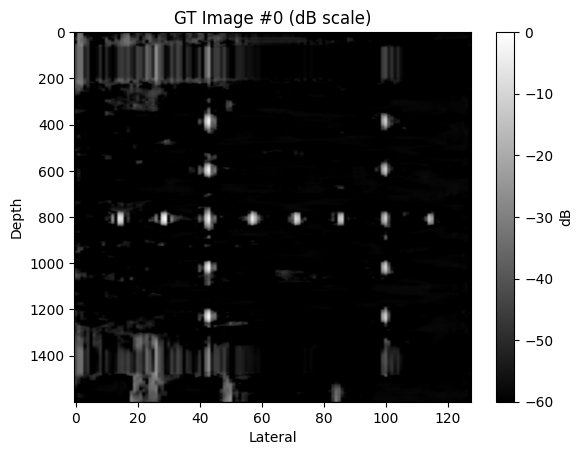

Training:  40%|████      | 80/200 [1:31:00<2:16:50, 68.42s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334821



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463766



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341485



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409251



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355673



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328014



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259103



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319121



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428435



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367648



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375703



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383290



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388389



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398263



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315386



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316709



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357066



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315792



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306329



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425717



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280079



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393350



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307569



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276479



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301158



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387659



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336475



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.2505
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362340



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292360



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330849



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383388



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354145



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367188



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300576



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282067



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302839



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371069



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307303



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325758



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358619



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360670



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307106



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383764



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302352



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326637



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252743



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406160



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365099



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392335



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301898



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289583



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375385



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362597



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341831



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370537



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307571



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292492



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302330



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257260



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321185



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295157



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255747



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296533



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381452



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334024



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266610



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343981



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308149



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379617



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310975



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.315587



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.336882

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.304302, PSNR≈28.63, SSIM≈0.8283



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.253708, PSNR≈38.09, SSIM≈0.8908



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.348314, PSNR≈30.96, SSIM≈0.8751



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.301283, PSNR≈28.54, SSIM≈0.8363



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.295327, PSNR≈36.62, SSIM≈0.9212



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.305429, PSNR≈34.71, SSIM≈0.7960



Training:  40%|████      | 81/200 [1:32:09<2:15:30, 68.33s/it]

Batch 7/7: Loss=0.317657, PSNR≈39.52, SSIM≈0.9518

===> Validation finished. Avg Loss: 0.303717, Avg PSNR: 34.84, Avg SSIM: 0.8772
🔁 Learning Rate for next epoch: 0.002500
Epoch 81/200 | Train: 0.3369 | Val: 0.3037 | PSNR: 34.84 | SSIM: 0.8772
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292480



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372408



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367313



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305020



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301210



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339374



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298509



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324145



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319973



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379146



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418986



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331811



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296306



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295275



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348056



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343918



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301979



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292675



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309137



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310652



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266611



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384747



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279221



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330523



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319126



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320445



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384707



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274393



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276155



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353363



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328204



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309040



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330378



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315255



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364733



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371853



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326888



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322079



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265782



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274897



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319449



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346287



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311407



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280393



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288264



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286239



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355861



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240570



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302184



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305219



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336966



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344371



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309291



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350996



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358596



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366688



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.443386



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268939



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.428853



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293119



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331999



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382174



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327166



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363131



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372180



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393609



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298131



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267868



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.463615



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352812



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.332358



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.329139

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.311252, PSNR≈28.71, SSIM≈0.8319



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.265486, PSNR≈37.87, SSIM≈0.8785



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.365103, PSNR≈29.26, SSIM≈0.8314



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.310999, PSNR≈28.71, SSIM≈0.8129



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.302127, PSNR≈35.96, SSIM≈0.9162



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.319080, PSNR≈34.44, SSIM≈0.8276



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

Batch 7/7: Loss=0.325634, PSNR≈38.31, SSIM≈0.9421

===> Validation finished. Avg Loss: 0.314240, Avg PSNR: 34.19, Avg SSIM: 0.8616
🔁 Learning Rate for next epoch: 0.002500
Epoch 82/200 | Train: 0.3291 | Val: 0.3142 | PSNR: 34.19 | SSIM: 0.8616
torch.Size([16, 1, 1600, 128])


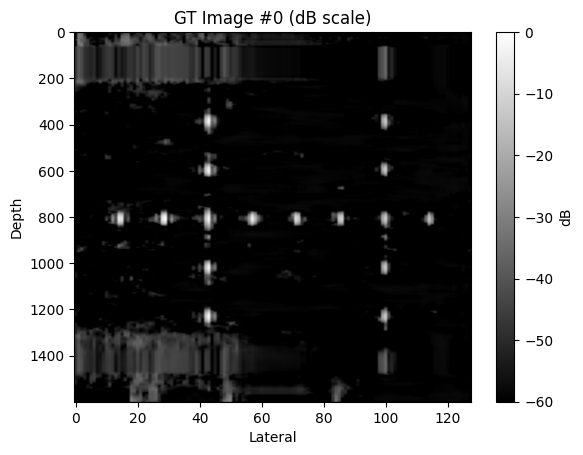

Training:  41%|████      | 82/200 [1:33:17<2:14:36, 68.45s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308106



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323710



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356430



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370835



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351366



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327306



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296085



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315941



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317430



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321144



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232766



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330545



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392501



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293300



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311721



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399260



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315740



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320605



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298051



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352530



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314473



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298478



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301551



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284177



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254960



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277760



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298011



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395755



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291216



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327360



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395658



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329561



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374729



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316044



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382737



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310760



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318713



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255378



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361061



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279302



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337737



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344382



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359402



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400162



 62%|██████▏   | 44/71 [00:41<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276435



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271336



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314150



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314827



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289353



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318091



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396219



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338175



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357670



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336048



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425846



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337397



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314272



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335574



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298041



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336249



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348609



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386420



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315858



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382250



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311336



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338143



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335493



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377843



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391726



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228731



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.370317



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.329453

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.302446, PSNR≈28.76, SSIM≈0.8358



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.89it/s]

Batch 2/7: Loss=0.251988, PSNR≈38.12, SSIM≈0.8930



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.90it/s]

Batch 3/7: Loss=0.348927, PSNR≈30.65, SSIM≈0.8595



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.298153, PSNR≈28.81, SSIM≈0.8437



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.292745, PSNR≈36.49, SSIM≈0.9288



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.303059, PSNR≈35.04, SSIM≈0.8071



Training:  42%|████▏     | 83/200 [1:34:25<2:13:13, 68.32s/it]

Batch 7/7: Loss=0.314428, PSNR≈39.43, SSIM≈0.9501

===> Validation finished. Avg Loss: 0.301678, Avg PSNR: 34.83, Avg SSIM: 0.8774
🔁 Learning Rate for next epoch: 0.002500
Epoch 83/200 | Train: 0.3295 | Val: 0.3017 | PSNR: 34.83 | SSIM: 0.8774
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369935



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291826



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308764



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302400



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303757



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357823



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330545



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334693



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282472



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374716



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373983



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342350



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255288



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280348



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301233



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392252



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336539



 24%|██▍       | 17/71 [00:15<00:50,  1.06it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311765



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284139



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308632



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343077



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241901



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367422



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225622



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393686



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262298



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328831



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270674



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284396



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349967



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316698



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364219



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319989



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251046



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392026



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283719



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317021



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368642



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295470



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373687



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334534



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398148



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331603



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305879



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331238



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293661



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345690



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386010



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385430



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284654



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325183



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221486



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317125



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306847



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359580



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315156



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388917



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264172



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323544



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381243



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371648



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319039



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320112



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363994



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267459



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324947



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357550



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.477375



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356470



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342646



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.302588



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.326729

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.305523, PSNR≈28.71, SSIM≈0.8473



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.72it/s]

Batch 2/7: Loss=0.256230, PSNR≈36.99, SSIM≈0.8506



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.80it/s]

Batch 3/7: Loss=0.351770, PSNR≈31.01, SSIM≈0.8751



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.83it/s]

Batch 4/7: Loss=0.299707, PSNR≈28.75, SSIM≈0.8304



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.294325, PSNR≈37.37, SSIM≈0.9319



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.306677, PSNR≈34.83, SSIM≈0.7909



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

Batch 7/7: Loss=0.320638, PSNR≈39.50, SSIM≈0.9551

===> Validation finished. Avg Loss: 0.304981, Avg PSNR: 34.68, Avg SSIM: 0.8733
🔁 Learning Rate for next epoch: 0.002500
Epoch 84/200 | Train: 0.3267 | Val: 0.3050 | PSNR: 34.68 | SSIM: 0.8733
torch.Size([16, 1, 1600, 128])


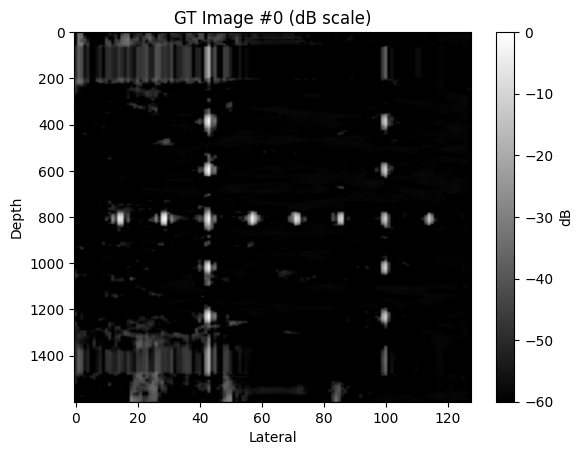

Training:  42%|████▏     | 84/200 [1:35:34<2:12:14, 68.40s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332208



  1%|▏         | 1/71 [00:00<01:03,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320775



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312453



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273235



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322772



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292984



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423581



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327097



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360489



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315702



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331806



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302851



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335861



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340617



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335183



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354592



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323745



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348669



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252220



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333426



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355263



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326219



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277622



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345866



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339736



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418912



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323606



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288203



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367767



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349318



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377013



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354675



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359681



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352841



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406334



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297732



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298118



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323034



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313109



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325795



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287396



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336540



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370624



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274485



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337913



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357549



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299086



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369074



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267835



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311054



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394912



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375486



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336995



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368286



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340326



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234043



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229420



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348112



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293312



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345339



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349277



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232082



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318173



 89%|████████▊ | 63/71 [00:58<00:07,  1.06it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314190



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325369



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314535



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395348



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365419



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283065



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339622



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.298497



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.328936

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.302999, PSNR≈28.84, SSIM≈0.8476



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.254583, PSNR≈38.16, SSIM≈0.8948



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.349180, PSNR≈30.92, SSIM≈0.8757



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.299452, PSNR≈28.82, SSIM≈0.8354



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.294448, PSNR≈36.72, SSIM≈0.9248



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.304619, PSNR≈34.94, SSIM≈0.8339



Training:  42%|████▎     | 85/200 [1:36:42<2:10:51, 68.28s/it]

Batch 7/7: Loss=0.316041, PSNR≈39.20, SSIM≈0.9491

===> Validation finished. Avg Loss: 0.303046, Avg PSNR: 34.77, Avg SSIM: 0.8770
🔁 Learning Rate for next epoch: 0.002500
Epoch 85/200 | Train: 0.3289 | Val: 0.3030 | PSNR: 34.77 | SSIM: 0.8770
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309817



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391086



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287852



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410247



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285233



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231476



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322103



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312260



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339519



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304541



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333848



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283941



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325266



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325512



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306507



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344137



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336856



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240489



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371903



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312237



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375734



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272076



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300800



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347488



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342137



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327132



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352261



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416245



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312347



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288304



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275231



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313114



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355547



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350488



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316696



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303956



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287458



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346025



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306670



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334647



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9083
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371097



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340829



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282915



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400193



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266319



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294238



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379106



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343754



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328965



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343251



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276324



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310012



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254268



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346830



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343324



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350494



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351048



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336485



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350028



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.456280



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300713



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277795



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353357



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283694



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298625



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362249



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314735



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366393



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332531



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339709



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2476
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.384067



100%|██████████| 71/71 [01:05<00:00,  1.09it/s]



===> Epoch finished. Avg loss: 0.327307

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.310562, PSNR≈28.53, SSIM≈0.8510



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.254764, PSNR≈38.24, SSIM≈0.8834



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.353970, PSNR≈30.69, SSIM≈0.8789



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.303430, PSNR≈28.62, SSIM≈0.8509



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.300298, PSNR≈35.96, SSIM≈0.9249



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.306503, PSNR≈34.73, SSIM≈0.8355



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]

Batch 7/7: Loss=0.318506, PSNR≈39.48, SSIM≈0.9529

===> Validation finished. Avg Loss: 0.306862, Avg PSNR: 34.71, Avg SSIM: 0.8798
🔁 Learning Rate for next epoch: 0.002500
Epoch 86/200 | Train: 0.3273 | Val: 0.3069 | PSNR: 34.71 | SSIM: 0.8798
torch.Size([16, 1, 1600, 128])


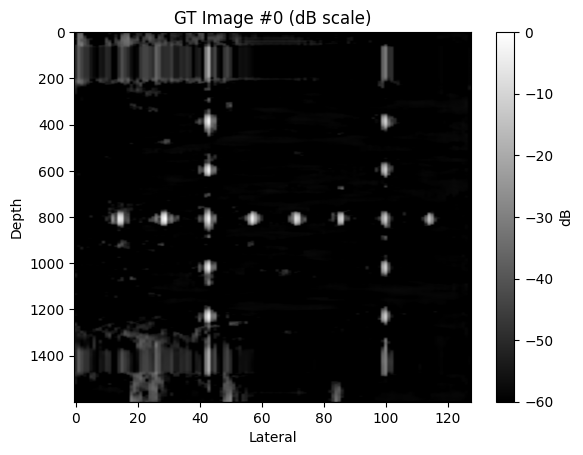

Training:  43%|████▎     | 86/200 [1:37:50<2:09:50, 68.34s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336508



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335592



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325117



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328042



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380429



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292288



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316982



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317699



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340437



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374622



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338714



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292215



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335010



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321364



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312432



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293609



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270609



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330558



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341952



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310158



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333654



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355191



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337002



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332603



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338081



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409453



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383746



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228881



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304039



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345883



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356851



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316332



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304001



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311689



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349233



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366410



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303674



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275839



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239221



 55%|█████▍    | 39/71 [00:36<00:30,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373043



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254998



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299757



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416112



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392805



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351296



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307920



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308359



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3686
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375715



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345015



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398376



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365078



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357869



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357346



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265469



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366020



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314773



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386051



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282789



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399955



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327187



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312918



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280959



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247642



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309619



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343455



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376895



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296666



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269198



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298058



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333523



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.190748



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.326644

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.306837, PSNR≈27.93, SSIM≈0.8353



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.255858, PSNR≈38.04, SSIM≈0.8933



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.352403, PSNR≈30.72, SSIM≈0.8732



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.302101, PSNR≈28.11, SSIM≈0.8294



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.297359, PSNR≈36.36, SSIM≈0.9155



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.83it/s]

Batch 6/7: Loss=0.307143, PSNR≈34.45, SSIM≈0.7889



Training:  44%|████▎     | 87/200 [1:38:58<2:08:31, 68.24s/it]

Batch 7/7: Loss=0.320402, PSNR≈39.38, SSIM≈0.9526

===> Validation finished. Avg Loss: 0.306015, Avg PSNR: 34.65, Avg SSIM: 0.8758
🔁 Learning Rate for next epoch: 0.002500
Epoch 87/200 | Train: 0.3266 | Val: 0.3060 | PSNR: 34.65 | SSIM: 0.8758
No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320318



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383127



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288865



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.385798



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302250



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315976



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332890



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290741



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314308



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243042



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388985



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374235



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296292



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340323



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404154



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286794



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347392



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334713



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330481



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320523



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311771



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287286



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265839



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351736



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331571



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370829



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254226



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366858



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292816



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293304



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371403



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273971



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369751



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358866



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324886



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313796



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341625



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367700



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.396681



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338437



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357938



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322655



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302284



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333968



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357939



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296012



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338035



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312727



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288236



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246303



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300892



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273599



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259952



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342135



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335770



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310211



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304941



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284171



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409352



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280554



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285585



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349592



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307951



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.450263



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306991



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307897



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263693



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366753



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357391



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416642



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.426733



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.327912

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.311063, PSNR≈28.79, SSIM≈0.8444



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.261893, PSNR≈37.95, SSIM≈0.8926



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.356587, PSNR≈30.93, SSIM≈0.8755



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.306573, PSNR≈28.79, SSIM≈0.8319



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.301131, PSNR≈34.91, SSIM≈0.9019



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.311118, PSNR≈34.03, SSIM≈0.7954



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

Batch 7/7: Loss=0.324313, PSNR≈38.25, SSIM≈0.9407

===> Validation finished. Avg Loss: 0.310383, Avg PSNR: 34.42, Avg SSIM: 0.8745
🔁 Learning Rate for next epoch: 0.002500
Epoch 88/200 | Train: 0.3279 | Val: 0.3104 | PSNR: 34.42 | SSIM: 0.8745
torch.Size([16, 1, 1600, 128])


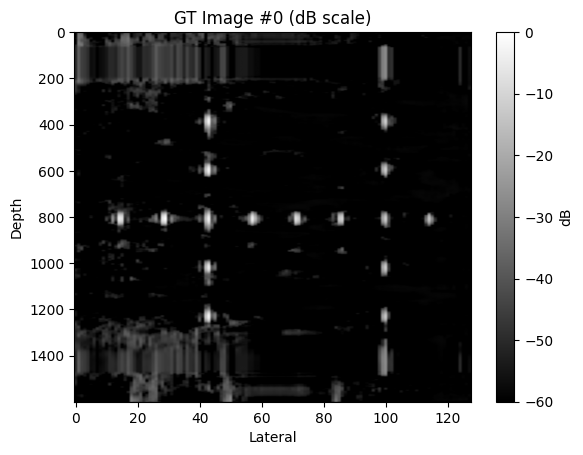

Training:  44%|████▍     | 88/200 [1:40:07<2:07:32, 68.33s/it]

No improvement (5/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273376



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344287



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324929



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377709



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352526



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354975



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328195



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343706



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274846



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298784



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315917



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306507



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298844



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393835



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307229



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305853



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431811



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310537



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324418



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291866



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314654



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309266



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353432



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284455



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280311



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324081



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351908



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357249



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345395



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351095



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313959



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273865



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373830



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333893



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342731



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285392



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289377



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338889



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379482



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342470



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353325



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348480



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359440



 61%|██████    | 43/71 [00:40<00:26,  1.06it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262374



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312058



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342526



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321164



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279389



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254690



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307088



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286032



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336159



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349368



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298166



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308092



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258536



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301254



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433441



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393771



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379756



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368576



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337642



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353804



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294134



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321980



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249452



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338408



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330388



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230316



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350725



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2484
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.401629



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.326311

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.302268, PSNR≈28.45, SSIM≈0.8456



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.251480, PSNR≈37.52, SSIM≈0.8807



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.345462, PSNR≈31.34, SSIM≈0.8807



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.296284, PSNR≈28.76, SSIM≈0.8367



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.290700, PSNR≈36.35, SSIM≈0.9278



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.303144, PSNR≈34.92, SSIM≈0.8055



Training:  44%|████▍     | 89/200 [1:41:15<2:06:15, 68.25s/it]

Batch 7/7: Loss=0.313419, PSNR≈39.54, SSIM≈0.9608

===> Validation finished. Avg Loss: 0.300394, Avg PSNR: 34.83, Avg SSIM: 0.8803
🔁 Learning Rate for next epoch: 0.002500
Epoch 89/200 | Train: 0.3263 | Val: 0.3004 | PSNR: 34.83 | SSIM: 0.8803
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286446



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327093



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347260



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315169



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295147



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342437



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375771



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375962



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330256



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297861



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303142



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337727



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297923



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392659



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.220819



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241271



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329864



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291366



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289777



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345916



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334028



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273866



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314398



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370916



 34%|███▍      | 24/71 [00:22<00:44,  1.06it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296550



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353437



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304418



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315141



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377634



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324288



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371881



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338747



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267933



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307971



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287924



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320663



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314609



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337908



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279025



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270643



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317792



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360700



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362968



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329191



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360691



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327106



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293173



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233457



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305153



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318539



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362689



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342444



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315208



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390981



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333402



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331137



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311959



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308908



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298584



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333686



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287289



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330223



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288513



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348059



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254957



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327787



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411984



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366502



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292190



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341772



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.434998



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.322928

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.77it/s]

Batch 1/7: Loss=0.301273, PSNR≈28.90, SSIM≈0.8539



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.77it/s]

Batch 2/7: Loss=0.252577, PSNR≈37.84, SSIM≈0.8883



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.347994, PSNR≈30.82, SSIM≈0.8821



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.81it/s]

Batch 4/7: Loss=0.298530, PSNR≈28.98, SSIM≈0.8530



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.78it/s]

Batch 5/7: Loss=0.293489, PSNR≈36.05, SSIM≈0.9184



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.83it/s]

Batch 6/7: Loss=0.303721, PSNR≈34.19, SSIM≈0.7924



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.81it/s]

Batch 7/7: Loss=0.312177, PSNR≈39.54, SSIM≈0.9566

===> Validation finished. Avg Loss: 0.301394, Avg PSNR: 34.67, Avg SSIM: 0.8769
🔁 Learning Rate for next epoch: 0.002500
Epoch 90/200 | Train: 0.3229 | Val: 0.3014 | PSNR: 34.67 | SSIM: 0.8769
torch.Size([16, 1, 1600, 128])


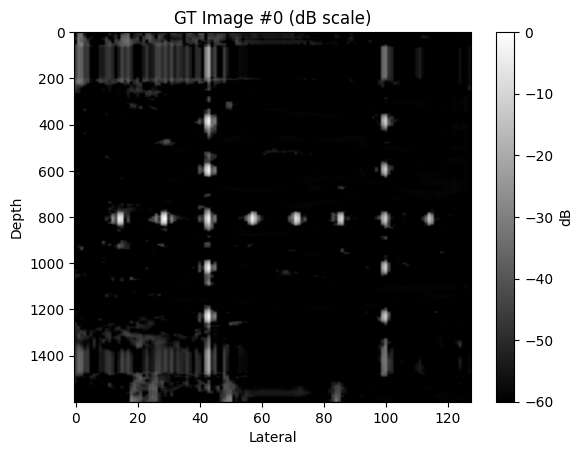

Training:  45%|████▌     | 90/200 [1:42:24<2:05:22, 68.38s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303770



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237635



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257575



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330291



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367767



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281962



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318209



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309589



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355198



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362001



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245318



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366644



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297357



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297008



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341879



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381304



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358224



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344452



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333925



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344987



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359932



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373051



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336734



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349320



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297820



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314328



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295103



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321732



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314843



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345989



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376409



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310012



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247776



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324522



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357365



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290703



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315237



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263771



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344290



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332172



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310999



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329948



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357013



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343013



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350408



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341025



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375760



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303634



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272723



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375430



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261924



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334479



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263828



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328503



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387084



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380241



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340785



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313741



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312903



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349506



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346817



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314804



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313314



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269107



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376369



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270087



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340683



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229361



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305365



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235832



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.394965



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.323040

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.301338, PSNR≈28.67, SSIM≈0.8486



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.252310, PSNR≈38.45, SSIM≈0.8970



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.347494, PSNR≈30.49, SSIM≈0.8804



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.297398, PSNR≈28.76, SSIM≈0.8454



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.295900, PSNR≈37.58, SSIM≈0.9243



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.305148, PSNR≈34.97, SSIM≈0.8348



Training:  46%|████▌     | 91/200 [1:43:32<2:04:00, 68.26s/it]

Batch 7/7: Loss=0.314129, PSNR≈39.46, SSIM≈0.9548

===> Validation finished. Avg Loss: 0.301960, Avg PSNR: 34.79, Avg SSIM: 0.8772
🔁 Learning Rate for next epoch: 0.002500
Epoch 91/200 | Train: 0.3230 | Val: 0.3020 | PSNR: 34.79 | SSIM: 0.8772
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319124



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357692



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337735



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404608



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280201



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302310



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313443



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283699



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303291



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343745



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324022



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389964



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315157



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360424



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327531



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320107



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250119



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383602



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295339



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283746



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360427



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342523



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337611



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317199



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310847



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302740



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300726



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317611



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398420



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302361



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293800



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303543



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318604



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356955



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403862



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278187



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263567



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333012



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328546



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258152



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364534



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293267



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313982



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279692



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355434



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346533



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348389



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265174



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346110



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333389



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334664



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368197



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299412



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320120



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252331



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387178



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232698



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340133



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292473



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379420



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346893



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239495



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375631



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373003



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398715



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350196



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301080



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273312



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329118



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253308



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.228225



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.321784

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.312166, PSNR≈28.52, SSIM≈0.8446



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.268793, PSNR≈37.81, SSIM≈0.8911



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.90it/s]

Batch 3/7: Loss=0.369449, PSNR≈30.83, SSIM≈0.8807



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.313841, PSNR≈28.83, SSIM≈0.8456



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.307480, PSNR≈36.91, SSIM≈0.9307



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.325631, PSNR≈34.26, SSIM≈0.7751



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.329648, PSNR≈38.76, SSIM≈0.9502

===> Validation finished. Avg Loss: 0.318144, Avg PSNR: 34.19, Avg SSIM: 0.8732
🔁 Learning Rate for next epoch: 0.002500
Epoch 92/200 | Train: 0.3218 | Val: 0.3181 | PSNR: 34.19 | SSIM: 0.8732
torch.Size([16, 1, 1600, 128])


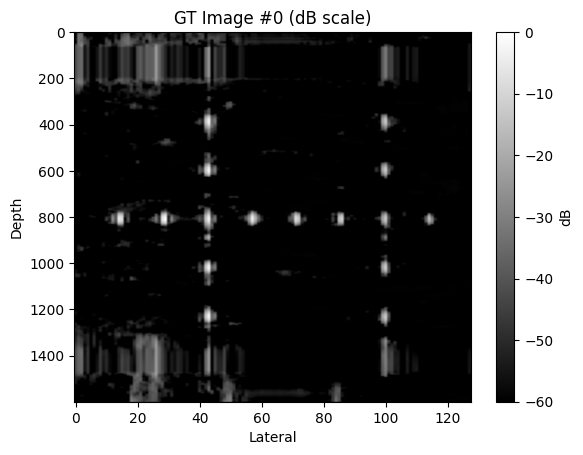

Training:  46%|████▌     | 92/200 [1:44:40<2:03:05, 68.39s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312777



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278927



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306262



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315565



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269022



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372184



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244775



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321712



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283005



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305111



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333879



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312055



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272905



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280326



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356897



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314097



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349458



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303346



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334113



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313481



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359225



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384631



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388384



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311722



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241757



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273672



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314505



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292824



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343241



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289996



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289551



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324968



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299750



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334061



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.395249



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343568



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363907



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424831



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301450



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338355



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295666



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308139



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324415



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330433



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382613



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313922



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304330



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290292



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294813



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319291



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276033



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296372



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312450



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340878



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.409178



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291458



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326280



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334701



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328143



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277520



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276753



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327748



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414948



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328892



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312806



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295916



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.393101



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300710



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277174



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344380



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2505
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.319310



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.320341

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.297075, PSNR≈29.05, SSIM≈0.8450



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.249236, PSNR≈38.28, SSIM≈0.8855



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.341945, PSNR≈31.25, SSIM≈0.8869



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.295414, PSNR≈28.99, SSIM≈0.8293



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.290311, PSNR≈36.19, SSIM≈0.9127



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.299309, PSNR≈34.28, SSIM≈0.8297



Training:  46%|████▋     | 93/200 [1:45:48<2:01:45, 68.28s/it]

Batch 7/7: Loss=0.309353, PSNR≈39.51, SSIM≈0.9605

===> Validation finished. Avg Loss: 0.297520, Avg PSNR: 34.98, Avg SSIM: 0.8823
🔁 Learning Rate for next epoch: 0.002500
Epoch 93/200 | Train: 0.3203 | Val: 0.2975 | PSNR: 34.98 | SSIM: 0.8823
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348687



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272819



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.2491
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.431240



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323976



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293364



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320437



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285279



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279393



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256627



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371026



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312756



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374209



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316868



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351939



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282843



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341743



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275760



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338791



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298161



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328676



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327962



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285833



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324173



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308919



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366934



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306286



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304826



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272844



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347534



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377294



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300095



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288955



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304912



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350674



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303633



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369244



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272385



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351869



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327446



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305138



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260511



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318492



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307688



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341485



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339514



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336760



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334596



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253719



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277305



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361223



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361810



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300117



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273371



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287167



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.412112



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264875



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315539



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322072



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384789



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271883



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346641



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332270



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295875



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307320



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253035



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354758



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262725



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284645



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.458357



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339422



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3685
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.309856



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.319317

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.86it/s]

Batch 1/7: Loss=0.297771, PSNR≈28.98, SSIM≈0.8541



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.90it/s]

Batch 2/7: Loss=0.250708, PSNR≈38.62, SSIM≈0.9001



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.343119, PSNR≈31.09, SSIM≈0.8815



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.88it/s]

Batch 4/7: Loss=0.297671, PSNR≈29.02, SSIM≈0.8425



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.291569, PSNR≈35.39, SSIM≈0.9109



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.302302, PSNR≈34.70, SSIM≈0.8061



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

Batch 7/7: Loss=0.310558, PSNR≈39.46, SSIM≈0.9539

===> Validation finished. Avg Loss: 0.299100, Avg PSNR: 34.86, Avg SSIM: 0.8817
🔁 Learning Rate for next epoch: 0.002500
Epoch 94/200 | Train: 0.3193 | Val: 0.2991 | PSNR: 34.86 | SSIM: 0.8817
torch.Size([16, 1, 1600, 128])


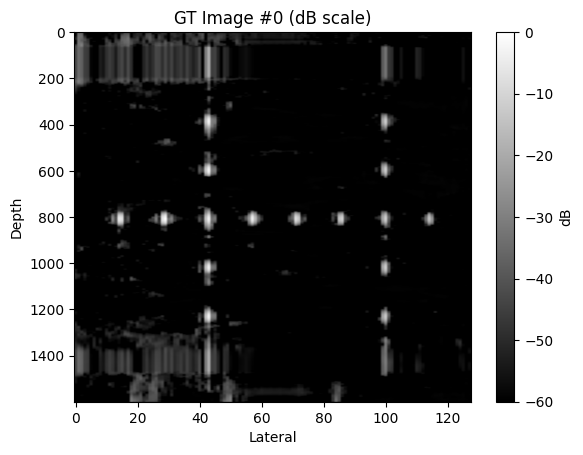

Training:  47%|████▋     | 94/200 [1:46:57<2:00:47, 68.38s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366701



  1%|▏         | 1/71 [00:00<01:05,  1.06it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374619



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242707



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341096



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241060



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319291



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299340



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296926



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369617



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406867



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307050



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372919



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297861



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302756



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343469



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351034



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300383



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302146



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307232



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313263



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285004



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312046



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353324



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386396



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321724



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297024



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317979



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317764



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300201



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313035



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297211



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377505



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284008



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320504



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242638



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278738



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309273



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301104



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351497



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381339



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362875



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283345



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321696



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259673



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281783



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375320



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400118



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351604



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362449



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287754



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335034



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328280



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290111



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289103



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281054



 77%|███████▋  | 55/71 [00:51<00:15,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391927



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276879



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284524



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303455



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328170



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285888



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315611



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291989



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322035



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323264



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320997



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276692



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324927



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307519



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293375



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0720
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.523644



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.320926

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.310518, PSNR≈28.45, SSIM≈0.8467



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.84it/s]

Batch 2/7: Loss=0.261186, PSNR≈38.19, SSIM≈0.8960



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.82it/s]

Batch 3/7: Loss=0.363183, PSNR≈30.28, SSIM≈0.8725



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.318534, PSNR≈28.55, SSIM≈0.8424



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.309350, PSNR≈35.73, SSIM≈0.9091



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.318886, PSNR≈34.07, SSIM≈0.8118



Training:  48%|████▊     | 95/200 [1:48:05<1:59:28, 68.27s/it]

Batch 7/7: Loss=0.322510, PSNR≈39.44, SSIM≈0.9559

===> Validation finished. Avg Loss: 0.314881, Avg PSNR: 34.32, Avg SSIM: 0.8748
🔁 Learning Rate for next epoch: 0.002500
Epoch 95/200 | Train: 0.3209 | Val: 0.3149 | PSNR: 34.32 | SSIM: 0.8748
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288685



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389369



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305558



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398072



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309967



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348071



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3685
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403831



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361760



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306844



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320532



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312630



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329118



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342535



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305859



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332210



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258282



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343140



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339977



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305381



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280264



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337454



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303471



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290796



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291908



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341632



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307830



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364718



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350127



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273845



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322015



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306116



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338735



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282846



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290368



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379932



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340537



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305857



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313068



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267597



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244654



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292198



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306633



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292996



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340302



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290407



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293037



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274129



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.416011



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348712



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272698



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246248



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344717



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329493



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331338



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371036



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367222



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308260



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337510



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345533



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343885



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289033



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267030



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339912



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364633



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256858



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348814



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339317



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305339



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340516



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315818



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2491
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.426382



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.322276

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.298306, PSNR≈28.75, SSIM≈0.8543



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.251462, PSNR≈37.83, SSIM≈0.8873



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.345570, PSNR≈31.05, SSIM≈0.8751



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.293740, PSNR≈28.98, SSIM≈0.8578



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.291061, PSNR≈37.50, SSIM≈0.9371



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.301054, PSNR≈34.94, SSIM≈0.8070



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

Batch 7/7: Loss=0.311910, PSNR≈39.25, SSIM≈0.9541

===> Validation finished. Avg Loss: 0.299015, Avg PSNR: 34.80, Avg SSIM: 0.8790
🔁 Learning Rate for next epoch: 0.002500
Epoch 96/200 | Train: 0.3223 | Val: 0.2990 | PSNR: 34.80 | SSIM: 0.8790
torch.Size([16, 1, 1600, 128])


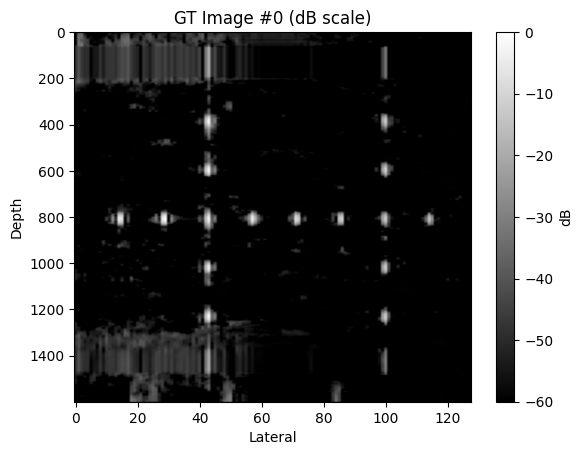

Training:  48%|████▊     | 96/200 [1:49:13<1:58:28, 68.35s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352149



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399708



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307029



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389019



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317475



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314951



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288747



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278633



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302749



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339236



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278296



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274343



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294376



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327730



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323724



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284735



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241773



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319389



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340486



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269366



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258082



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300894



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234907



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293353



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292826



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287382



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292989



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357617



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.2489
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.459859



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331732



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271114



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.422669



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319607



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353084



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343939



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354102



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377734



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381261



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315636



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324706



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362501



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362922



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356717



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367089



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243193



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302144



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.220304



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302065



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330698



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260282



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340533



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346406



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277057



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325172



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313276



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283861



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306150



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278269



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260972



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388607



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394780



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347618



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356549



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316516



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257791



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365254



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352946



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289944



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279879



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387048



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.253505



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.318978

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.303229, PSNR≈28.61, SSIM≈0.7962



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.253406, PSNR≈38.37, SSIM≈0.8954



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.345896, PSNR≈31.05, SSIM≈0.8561



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.294908, PSNR≈28.73, SSIM≈0.8014



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.292310, PSNR≈36.96, SSIM≈0.9048



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.303066, PSNR≈33.71, SSIM≈0.7944



Training:  48%|████▊     | 97/200 [1:50:21<1:57:06, 68.22s/it]

Batch 7/7: Loss=0.315604, PSNR≈39.26, SSIM≈0.9459

===> Validation finished. Avg Loss: 0.301203, Avg PSNR: 34.89, Avg SSIM: 0.8695
🔁 Learning Rate for next epoch: 0.002500
Epoch 97/200 | Train: 0.3190 | Val: 0.3012 | PSNR: 34.89 | SSIM: 0.8695
No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233760



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365236



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327929



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244831



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357643



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357051



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364905



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322759



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342404



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327242



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248672



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302994



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229437



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335484



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366801



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296450



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286948



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347834



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386879



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321782



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319773



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285787



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309959



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279768



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368400



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316644



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323066



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328698



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345050



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240349



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346404



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327022



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321892



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343700



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250731



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330229



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343459



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333257



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341959



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291551



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348991



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.218501



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363122



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423299



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337487



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343550



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345820



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288992



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337457



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312855



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282584



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274768



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264939



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363087



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358452



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319363



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304523



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276365



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260075



 83%|████████▎ | 59/71 [00:55<00:11,  1.06it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337183



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318733



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327291



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318503



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347788



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343831



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354774



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314419



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323274



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328219



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318862



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.288746



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.319163

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.84it/s]

Batch 1/7: Loss=0.296420, PSNR≈28.98, SSIM≈0.8386



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.85it/s]

Batch 2/7: Loss=0.248957, PSNR≈38.73, SSIM≈0.9032



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.341640, PSNR≈31.36, SSIM≈0.8832



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.293092, PSNR≈28.94, SSIM≈0.8251



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.85it/s]

Batch 5/7: Loss=0.288101, PSNR≈36.31, SSIM≈0.9299



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.86it/s]

Batch 6/7: Loss=0.299218, PSNR≈34.94, SSIM≈0.8056



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.84it/s]

Batch 7/7: Loss=0.310107, PSNR≈39.58, SSIM≈0.9578

===> Validation finished. Avg Loss: 0.296791, Avg PSNR: 35.02, Avg SSIM: 0.8845
🔁 Learning Rate for next epoch: 0.002500
Epoch 98/200 | Train: 0.3192 | Val: 0.2968 | PSNR: 35.02 | SSIM: 0.8845
torch.Size([16, 1, 1600, 128])


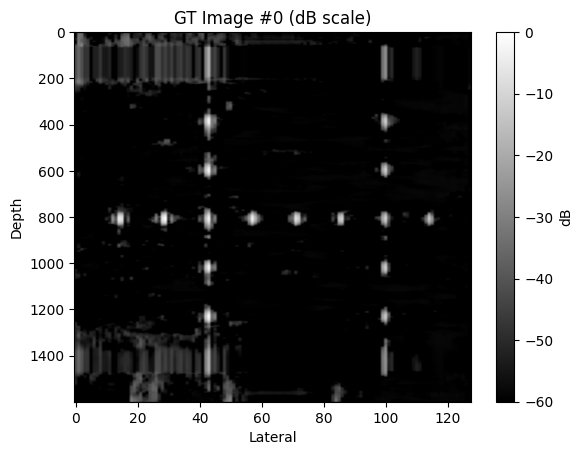

Training:  49%|████▉     | 98/200 [1:51:30<1:56:12, 68.36s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271309



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398720



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312781



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309338



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319203



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388320



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326546



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354620



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290937



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287162



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332543



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338997



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285491



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368237



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319068



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326611



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344224



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276045



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335682



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346609



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297529



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289650



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334632



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302293



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249429



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332702



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265452



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301174



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404651



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303053



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279716



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304187



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288585



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330023



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343310



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299660



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356275



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310875



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257750



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311707



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.415263



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394682



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328842



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333803



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313910



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281974



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290153



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249309



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335863



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369981



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278359



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339556



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319234



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248324



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322482



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325744



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261104



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311810



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280748



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320930



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384646



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303495



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366862



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316404



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301980



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269322



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375089



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317350



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331140



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333973



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2495
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.317815



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.318806

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.01it/s]

Batch 1/7: Loss=0.307651, PSNR≈28.58, SSIM≈0.8463



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.261984, PSNR≈37.89, SSIM≈0.8881



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.360512, PSNR≈30.34, SSIM≈0.8550



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.308634, PSNR≈28.59, SSIM≈0.8483



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.297822, PSNR≈36.42, SSIM≈0.9338



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.314519, PSNR≈33.22, SSIM≈0.7881



Training:  50%|████▉     | 99/200 [1:52:38<1:54:50, 68.22s/it]

Batch 7/7: Loss=0.327692, PSNR≈39.37, SSIM≈0.9553

===> Validation finished. Avg Loss: 0.311259, Avg PSNR: 34.44, Avg SSIM: 0.8731
🔁 Learning Rate for next epoch: 0.002500
Epoch 99/200 | Train: 0.3188 | Val: 0.3113 | PSNR: 34.44 | SSIM: 0.8731
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301600



  1%|▏         | 1/71 [00:00<01:04,  1.09it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299778



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293494



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329427



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294939



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319221



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305632



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316304



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367820



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301527



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340995



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397337



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.408744



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352181



 20%|█▉        | 14/71 [00:12<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269405



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.452714



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354632



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334496



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435159



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313790



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318670



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328002



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360877



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286393



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384411



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.394631



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328404



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350235



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315033



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348722



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382064



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388820



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279729



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323335



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262772



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292921



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260339



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282379



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399404



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333080



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353931



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280745



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308748



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258994



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327494



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285909



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281472



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258521



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310868



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332997



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285941



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324511



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356214



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304612



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254374



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292611



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336577



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268595



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319883



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266728



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373451



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285468



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321404



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343315



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304815



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309636



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382033



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322977



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304796



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288486



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.265901



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.322837

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.295909, PSNR≈29.02, SSIM≈0.8253



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.246576, PSNR≈38.57, SSIM≈0.9026



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.341852, PSNR≈31.03, SSIM≈0.8754



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.293342, PSNR≈28.99, SSIM≈0.8492



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.286737, PSNR≈36.04, SSIM≈0.9203



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.299247, PSNR≈34.34, SSIM≈0.8092



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

Batch 7/7: Loss=0.308310, PSNR≈39.59, SSIM≈0.9576

===> Validation finished. Avg Loss: 0.295996, Avg PSNR: 35.03, Avg SSIM: 0.8851
🔁 Learning Rate for next epoch: 0.002500
Epoch 100/200 | Train: 0.3228 | Val: 0.2960 | PSNR: 35.03 | SSIM: 0.8851
torch.Size([16, 1, 1600, 128])


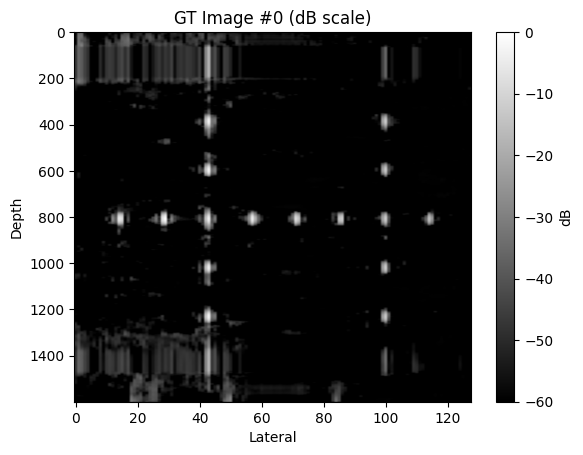

Training:  50%|█████     | 100/200 [1:53:47<1:53:51, 68.32s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350240



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357822



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289956



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288400



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377289



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301354



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350354



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338377



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306090



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358789



 14%|█▍        | 10/71 [00:09<00:57,  1.06it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307144



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271560



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321495



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311767



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326589



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307464



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358617



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324859



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336272



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248209



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255081



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293160



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329796



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371673



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311976



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342171



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253403



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310895



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295372



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330727



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328826



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254304



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365566



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239987



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305334



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296597



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274986



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338277



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.424635



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322274



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342107



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311814



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291581



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298451



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352433



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314974



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337104



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250045



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321539



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257181



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324563



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312733



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301116



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.435741



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322935



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273104



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237299



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278392



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292921



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350644



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352971



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333054



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350395



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329205



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344617



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279421



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263239



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321266



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333263



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315412



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.223455



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.314516

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.294430, PSNR≈29.09, SSIM≈0.8552



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.247763, PSNR≈38.30, SSIM≈0.8965



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.338307, PSNR≈31.39, SSIM≈0.8888



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.289941, PSNR≈29.11, SSIM≈0.8580



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.287692, PSNR≈37.55, SSIM≈0.9339



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.297933, PSNR≈35.16, SSIM≈0.8035



Training:  50%|█████     | 101/200 [1:54:55<1:52:35, 68.24s/it]

Batch 7/7: Loss=0.307804, PSNR≈39.43, SSIM≈0.9619

===> Validation finished. Avg Loss: 0.294839, Avg PSNR: 35.01, Avg SSIM: 0.8853
🔁 Learning Rate for next epoch: 0.002500
Epoch 101/200 | Train: 0.3145 | Val: 0.2948 | PSNR: 35.01 | SSIM: 0.8853
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376613



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286751



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329598



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330281



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345026



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356898



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336972



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287644



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287391



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294323



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.439185



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317134



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338571



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307398



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277106



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273092



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275667



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265060



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318043



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259712



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354245



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334984



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342813



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361184



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297134



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302036



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324820



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349416



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292499



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365965



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296098



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299147



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324014



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384665



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287364



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371463



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311385



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265666



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342992



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241431



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309871



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305986



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265560



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371591



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302326



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294657



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389975



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327603



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280196



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317324



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318172



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348072



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338187



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287132



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255364



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299490



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300409



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308920



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299584



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311968



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378795



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290092



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285956



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292275



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290834



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334289



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325051



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344866



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320308



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305132



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.396134



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.317576

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.292202, PSNR≈29.07, SSIM≈0.8554



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.96it/s]

Batch 2/7: Loss=0.248121, PSNR≈38.58, SSIM≈0.9016



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.96it/s]

Batch 3/7: Loss=0.341272, PSNR≈31.24, SSIM≈0.8828



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.290561, PSNR≈29.03, SSIM≈0.8406



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.286254, PSNR≈37.29, SSIM≈0.9381



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.300102, PSNR≈34.82, SSIM≈0.8239



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.308136, PSNR≈39.59, SSIM≈0.9576

===> Validation finished. Avg Loss: 0.295235, Avg PSNR: 35.07, Avg SSIM: 0.8866
🔁 Learning Rate for next epoch: 0.002500
Epoch 102/200 | Train: 0.3176 | Val: 0.2952 | PSNR: 35.07 | SSIM: 0.8866
torch.Size([16, 1, 1600, 128])


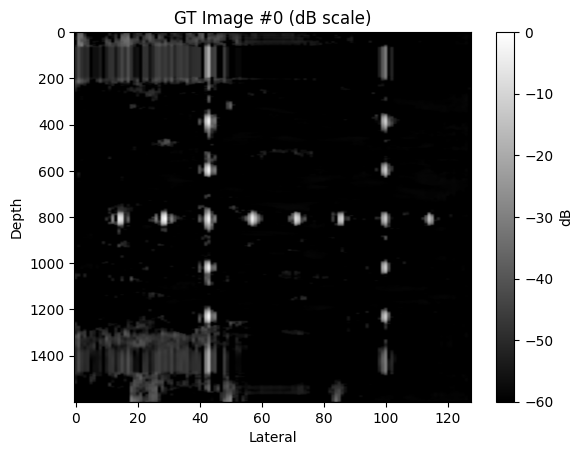

Training:  51%|█████     | 102/200 [1:56:03<1:51:36, 68.33s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291360



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319034



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319965



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302306



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291127



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303718



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358073



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237374



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265577



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340229



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274498



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315192



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377739



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284522



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340272



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294619



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271140



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323907



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.423183



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328622



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287100



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242030



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411157



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259898



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378376



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325984



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313173



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384585



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292808



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344129



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284573



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289163



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315287



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362715



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384065



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337980



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418048



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338386



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343700



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308406



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295921



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374424



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368314



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.222098



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341562



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266798



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337511



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309662



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.391982



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292536



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302873



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296991



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.214973



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288229



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285646



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293653



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324246



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300634



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405625



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.400388



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360106



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293880



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315167



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364767



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347146



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242047



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250730



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328324



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347072



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311758



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.374235



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.320188

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.79it/s]

Batch 1/7: Loss=0.298801, PSNR≈28.90, SSIM≈0.8116



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.250434, PSNR≈38.41, SSIM≈0.8935



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.79it/s]

Batch 3/7: Loss=0.346900, PSNR≈31.09, SSIM≈0.8721



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.297019, PSNR≈28.67, SSIM≈0.7819



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.290622, PSNR≈36.43, SSIM≈0.9262



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.301724, PSNR≈34.11, SSIM≈0.8126



Training:  52%|█████▏    | 103/200 [1:57:11<1:50:16, 68.21s/it]

Batch 7/7: Loss=0.311895, PSNR≈39.58, SSIM≈0.9562

===> Validation finished. Avg Loss: 0.299628, Avg PSNR: 34.82, Avg SSIM: 0.8770
🔁 Learning Rate for next epoch: 0.002500
Epoch 103/200 | Train: 0.3202 | Val: 0.2996 | PSNR: 34.82 | SSIM: 0.8770
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267663



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348902



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354159



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242126



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320003



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373972



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278959



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261547



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321537



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297609



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281721



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311363



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303952



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238502



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355813



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318416



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293134



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296907



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281945



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368597



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353751



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341015



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366541



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306899



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350979



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296002



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264646



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274032



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390109



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236634



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304949



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252845



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345270



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367873



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322392



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245843



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308559



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325196



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352894



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320463



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252286



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275648



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305461



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381316



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305676



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326727



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322445



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293547



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303222



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332904



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237887



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308936



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258533



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381920



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369614



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373573



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277089



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335046



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339218



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319336



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307837



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313440



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293465



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291529



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399976



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340510



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398909



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268360



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282509



 97%|█████████▋| 69/71 [01:04<00:01,  1.06it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322393



 99%|█████████▊| 70/71 [01:05<00:00,  1.06it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.216526



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.312388

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.76it/s]

Batch 1/7: Loss=0.299713, PSNR≈28.98, SSIM≈0.8477



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.85it/s]

Batch 2/7: Loss=0.254041, PSNR≈38.60, SSIM≈0.8933



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.347633, PSNR≈30.85, SSIM≈0.8858



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.302531, PSNR≈28.95, SSIM≈0.8555



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.298723, PSNR≈36.82, SSIM≈0.9230



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.306591, PSNR≈35.19, SSIM≈0.8397



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.316116, PSNR≈39.40, SSIM≈0.9614

===> Validation finished. Avg Loss: 0.303621, Avg PSNR: 34.69, Avg SSIM: 0.8801
🔁 Learning Rate for next epoch: 0.002500
Epoch 104/200 | Train: 0.3124 | Val: 0.3036 | PSNR: 34.69 | SSIM: 0.8801
torch.Size([16, 1, 1600, 128])


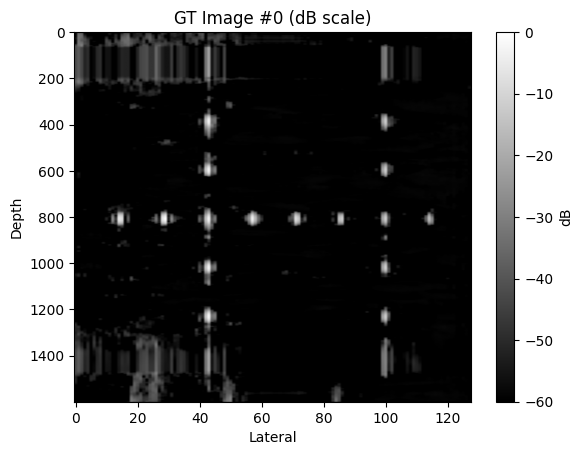

Training:  52%|█████▏    | 104/200 [1:58:20<1:49:19, 68.33s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346551



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322857



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280827



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367214



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.467978



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280463



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306461



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287695



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282185



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.433660



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369703



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321820



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297319



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288457



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295235



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344500



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296715



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299245



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331760



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251974



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237453



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329887



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276225



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308527



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322605



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297023



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263821



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309995



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262153



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331628



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318120



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307904



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286706



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327100



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353206



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309502



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284404



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243395



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327248



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309511



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336286



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264351



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344404



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357008



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262544



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330784



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332666



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363272



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386927



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299946



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261005



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354220



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360579



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301562



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263625



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339102



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305687



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260405



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.430414



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345263



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356026



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280815



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282693



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261307



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267569



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282281



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314565



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302739



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354036



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346794



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.375110



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.315535

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.293746, PSNR≈29.07, SSIM≈0.8583



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.245165, PSNR≈38.60, SSIM≈0.8941



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.339104, PSNR≈31.15, SSIM≈0.8798



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.293307, PSNR≈29.11, SSIM≈0.8535



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.286413, PSNR≈35.85, SSIM≈0.9194



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.296387, PSNR≈34.81, SSIM≈0.8344



Training:  52%|█████▎    | 105/200 [1:59:28<1:48:02, 68.24s/it]

Batch 7/7: Loss=0.305403, PSNR≈39.81, SSIM≈0.9575

===> Validation finished. Avg Loss: 0.294218, Avg PSNR: 35.11, Avg SSIM: 0.8868
🔁 Learning Rate for next epoch: 0.002500
Epoch 105/200 | Train: 0.3155 | Val: 0.2942 | PSNR: 35.11 | SSIM: 0.8868
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360294



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306687



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.2496
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.429649



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323540



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272621



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323720



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314990



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285103



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326582



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357472



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264072



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332419



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230911



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302552



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253554



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298047



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387048



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281849



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339982



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274271



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386737



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282630



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287885



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297051



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358844



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313393



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323790



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291100



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312711



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327025



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287252



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313032



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297652



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306988



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282986



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272228



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282515



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333941



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377430



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397818



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304752



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335948



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294412



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299638



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310073



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272617



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271398



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356660



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307324



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279404



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.399357



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280609



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282290



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405390



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305811



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316204



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.2494
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.402587



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275526



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317582



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268271



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358806



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364155



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358894



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301639



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364610



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347406



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296768



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.224982



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269572



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324220



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.236979



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.314539

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.299391, PSNR≈28.41, SSIM≈0.8566



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.249705, PSNR≈38.51, SSIM≈0.8973



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.347811, PSNR≈30.74, SSIM≈0.8503



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.296490, PSNR≈28.25, SSIM≈0.8534



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.289729, PSNR≈36.74, SSIM≈0.9218



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.303848, PSNR≈34.27, SSIM≈0.8124



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.90it/s]

Batch 7/7: Loss=0.312307, PSNR≈39.59, SSIM≈0.9583

===> Validation finished. Avg Loss: 0.299897, Avg PSNR: 34.86, Avg SSIM: 0.8811
🔁 Learning Rate for next epoch: 0.002500
Epoch 106/200 | Train: 0.3145 | Val: 0.2999 | PSNR: 34.86 | SSIM: 0.8811
torch.Size([16, 1, 1600, 128])


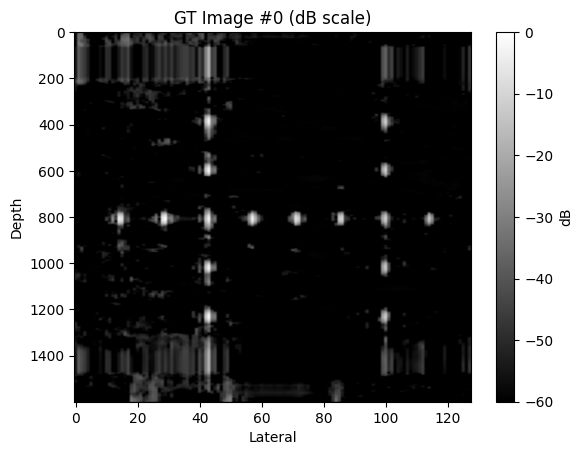

Training:  53%|█████▎    | 106/200 [2:00:36<1:47:02, 68.33s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420196



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326780



  3%|▎         | 2/71 [00:01<01:05,  1.06it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346290



  4%|▍         | 3/71 [00:02<01:03,  1.06it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266654



  6%|▌         | 4/71 [00:03<01:02,  1.06it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323389



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316005



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352364



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312148



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372253



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311481



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305148



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284836



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263674



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274534



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389808



 21%|██        | 15/71 [00:14<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375647



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307949



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334438



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295095



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336250



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378892



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298053



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381926



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311611



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318514



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330241



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403994



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309504



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382011



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332076



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327044



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345131



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299326



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320071



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323949



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245895



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335314



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320980



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289854



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302271



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307772



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256890



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303732



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407010



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339283



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312986



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271928



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294263



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238485



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298750



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282643



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333677



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356746



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300219



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336785



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289423



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296429



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291733



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300550



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252061



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316414



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287162



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291299



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355692



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285308



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361029



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323180



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322436



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362231



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317406



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2484
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.381398



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.320373

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.88it/s]

Batch 1/7: Loss=0.295057, PSNR≈29.15, SSIM≈0.8441



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.81it/s]

Batch 2/7: Loss=0.247860, PSNR≈38.50, SSIM≈0.8998



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.72it/s]

Batch 3/7: Loss=0.340764, PSNR≈31.21, SSIM≈0.8820



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.81it/s]

Batch 4/7: Loss=0.294147, PSNR≈29.18, SSIM≈0.8529



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.289194, PSNR≈36.15, SSIM≈0.9062



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.80it/s]

Batch 6/7: Loss=0.298845, PSNR≈34.24, SSIM≈0.8238



Training:  54%|█████▎    | 107/200 [2:01:44<1:45:47, 68.26s/it]

Batch 7/7: Loss=0.305818, PSNR≈39.80, SSIM≈0.9595

===> Validation finished. Avg Loss: 0.295955, Avg PSNR: 35.03, Avg SSIM: 0.8864
🔁 Learning Rate for next epoch: 0.002500
Epoch 107/200 | Train: 0.3204 | Val: 0.2960 | PSNR: 35.03 | SSIM: 0.8864
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290470



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315753



  3%|▎         | 2/71 [00:01<01:03,  1.09it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259454



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336418



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334746



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419750



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346250



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283672



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284377



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318351



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313223



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249169



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351924



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357024



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304754



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314454



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269994



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359205



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279773



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337141



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344577



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265958



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288456



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281294



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273697



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324526



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236737



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320826



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347402



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277632



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327353



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312481



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254466



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291356



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294382



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330951



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276950



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286737



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369605



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319250



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332595



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310449



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401230



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298037



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312591



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349547



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326172



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286709



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379104



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268989



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265806



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277204



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267921



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289728



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373621



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298622



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312956



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325071



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277157



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315293



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362584



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244858



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246341



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341957



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300436



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344399



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232742



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373194



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361541



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282947



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2481
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.490878



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.312693

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.88it/s]

Batch 1/7: Loss=0.297443, PSNR≈28.98, SSIM≈0.8500



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.79it/s]

Batch 2/7: Loss=0.252080, PSNR≈37.62, SSIM≈0.8898



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.73it/s]

Batch 3/7: Loss=0.345532, PSNR≈31.01, SSIM≈0.8379



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.75it/s]

Batch 4/7: Loss=0.297202, PSNR≈29.06, SSIM≈0.8258



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.80it/s]

Batch 5/7: Loss=0.291212, PSNR≈36.37, SSIM≈0.9206



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.83it/s]

Batch 6/7: Loss=0.301566, PSNR≈34.54, SSIM≈0.8125



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

Batch 7/7: Loss=0.308695, PSNR≈39.58, SSIM≈0.9603

===> Validation finished. Avg Loss: 0.299104, Avg PSNR: 34.80, Avg SSIM: 0.8817
🔁 Learning Rate for next epoch: 0.002500
Epoch 108/200 | Train: 0.3127 | Val: 0.2991 | PSNR: 34.80 | SSIM: 0.8817
torch.Size([16, 1, 1600, 128])


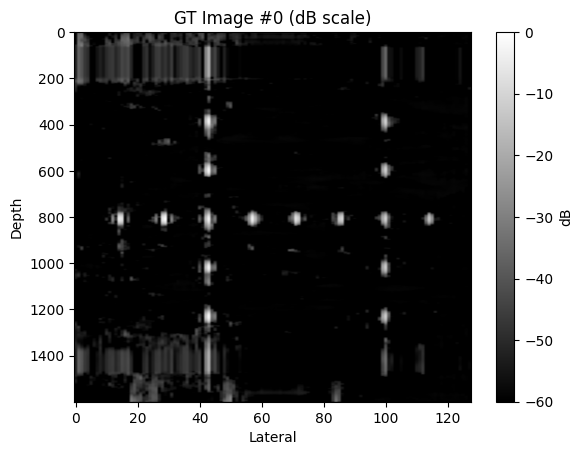

Training:  54%|█████▍    | 108/200 [2:02:53<1:44:48, 68.36s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354921



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268269



  3%|▎         | 2/71 [00:01<01:03,  1.09it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366719



  4%|▍         | 3/71 [00:02<01:02,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267403



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304143



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335577



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263201



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290903



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.397446



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316379



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355585



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367437



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248587



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318410



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356690



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296181



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270159



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379739



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312478



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301407



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314314



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366414



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234214



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249738



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377617



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244806



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298819



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354359



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258035



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371816



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243975



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305940



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274698



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251166



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288416



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294779



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315246



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307185



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281788



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333507



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329515



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300947



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317959



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404973



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330161



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334969



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305852



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345466



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285534



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255249



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388541



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260374



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330924



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286967



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341954



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296585



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314168



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331788



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294319



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282399



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275681



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321847



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287590



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383172



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337974



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278541



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342927



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313551



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322123



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272205



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.279526



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.311158

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.296605, PSNR≈28.96, SSIM≈0.8482



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.251169, PSNR≈37.92, SSIM≈0.8862



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.348508, PSNR≈31.04, SSIM≈0.8404



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.296760, PSNR≈29.01, SSIM≈0.8402



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.288886, PSNR≈37.16, SSIM≈0.9296



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.306755, PSNR≈34.82, SSIM≈0.8102



Training:  55%|█████▍    | 109/200 [2:04:01<1:43:28, 68.23s/it]

Batch 7/7: Loss=0.313363, PSNR≈39.62, SSIM≈0.9582

===> Validation finished. Avg Loss: 0.300292, Avg PSNR: 34.84, Avg SSIM: 0.8744
🔁 Learning Rate for next epoch: 0.002500
Epoch 109/200 | Train: 0.3112 | Val: 0.3003 | PSNR: 34.84 | SSIM: 0.8744
No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306626



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304022



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272481



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281043



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319487



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268165



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344415



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286678



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312218



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315741



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315495



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288352



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315621



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425519



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327325



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358406



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334710



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298570



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326993



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352565



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311473



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.2500
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404891



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298949



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305792



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315896



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262857



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315020



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268524



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308175



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322944



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315316



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329582



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316175



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308508



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.206822



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312496



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293408



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356042



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299270



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.420788



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330989



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342631



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285730



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254531



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267116



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269420



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330485



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283643



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350172



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311372



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360454



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331777



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309214



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288961



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279820



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295132



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300424



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247647



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251846



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296838



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323518



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301119



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295628



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298225



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255591



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310116



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254843



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370305



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384627



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350961



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.251548



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.310029

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.291560, PSNR≈29.20, SSIM≈0.8605



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.245531, PSNR≈38.38, SSIM≈0.8904



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.339254, PSNR≈31.15, SSIM≈0.8875



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.291690, PSNR≈29.16, SSIM≈0.8527



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.285702, PSNR≈36.56, SSIM≈0.9327



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.299032, PSNR≈33.80, SSIM≈0.7976



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

Batch 7/7: Loss=0.304110, PSNR≈39.78, SSIM≈0.9609

===> Validation finished. Avg Loss: 0.293840, Avg PSNR: 35.09, Avg SSIM: 0.8872
🔁 Learning Rate for next epoch: 0.002500
Epoch 110/200 | Train: 0.3100 | Val: 0.2938 | PSNR: 35.09 | SSIM: 0.8872
torch.Size([16, 1, 1600, 128])


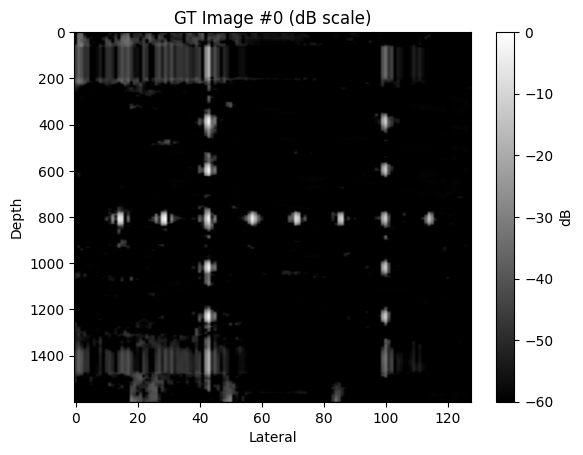

Training:  55%|█████▌    | 110/200 [2:05:09<1:42:31, 68.34s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264667



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258182



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337809



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304785



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349182



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283590



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265382



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308275



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345925



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247954



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247271



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280780



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302249



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307632



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296413



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306317



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289374



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272989



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279957



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351030



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228541



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295571



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235341



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314832



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286899



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329359



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302868



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346599



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288869



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285155



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289485



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291228



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357090



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270237



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358304



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303878



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317688



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359635



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.3685
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377177



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352776



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322727



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326953



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320608



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273628



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304978



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355059



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271951



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.388419



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304676



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272760



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296936



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301900



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280789



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357868



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313856



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272130



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301073



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297439



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294966



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370431



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346649



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286355



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303998



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377250



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344537



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305199



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338156



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351287



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323327



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352456



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.250093



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.308447

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.82it/s]

Batch 1/7: Loss=0.299361, PSNR≈28.93, SSIM≈0.8412



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.255894, PSNR≈36.98, SSIM≈0.8509



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.364140, PSNR≈28.90, SSIM≈0.8085



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.301445, PSNR≈29.07, SSIM≈0.8512



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.82it/s]

Batch 5/7: Loss=0.295331, PSNR≈37.43, SSIM≈0.9327



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.80it/s]

Batch 6/7: Loss=0.312493, PSNR≈34.60, SSIM≈0.8199



Training:  56%|█████▌    | 111/200 [2:06:17<1:41:12, 68.22s/it]

Batch 7/7: Loss=0.316361, PSNR≈39.43, SSIM≈0.9566

===> Validation finished. Avg Loss: 0.306432, Avg PSNR: 34.59, Avg SSIM: 0.8745
🔁 Learning Rate for next epoch: 0.002500
Epoch 111/200 | Train: 0.3084 | Val: 0.3064 | PSNR: 34.59 | SSIM: 0.8745
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311378



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251148



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295638



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285699



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297841



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268430



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272526



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295080



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260447



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313143



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249942



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307222



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366141



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315639



 20%|█▉        | 14/71 [00:13<00:53,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324348



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330343



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342630



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340158



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271816



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299889



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294711



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328773



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285859



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353961



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304126



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298927



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324558



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300790



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352849



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315591



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354098



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303893



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257612



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288126



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273611



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255343



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406852



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321000



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269314



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341913



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334355



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290255



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332409



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295045



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285059



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324086



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313480



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363575



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276810



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343611



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274492



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358500



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318504



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252570



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340837



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365210



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259434



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316922



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370906



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298598



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343238



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335510



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359287



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340196



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316890



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419831



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280837



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265434



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217684



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262655



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.297038



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.309643

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.84it/s]

Batch 1/7: Loss=0.298509, PSNR≈28.91, SSIM≈0.8370



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.81it/s]

Batch 2/7: Loss=0.251546, PSNR≈38.29, SSIM≈0.8993



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.73it/s]

Batch 3/7: Loss=0.347500, PSNR≈30.49, SSIM≈0.8764



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.81it/s]

Batch 4/7: Loss=0.300260, PSNR≈29.08, SSIM≈0.8304



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.295174, PSNR≈35.58, SSIM≈0.8915



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.304387, PSNR≈34.79, SSIM≈0.8191



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.85it/s]

Batch 7/7: Loss=0.309523, PSNR≈39.44, SSIM≈0.9637

===> Validation finished. Avg Loss: 0.300986, Avg PSNR: 34.76, Avg SSIM: 0.8814
🔁 Learning Rate for next epoch: 0.002500
Epoch 112/200 | Train: 0.3096 | Val: 0.3010 | PSNR: 34.76 | SSIM: 0.8814
torch.Size([16, 1, 1600, 128])


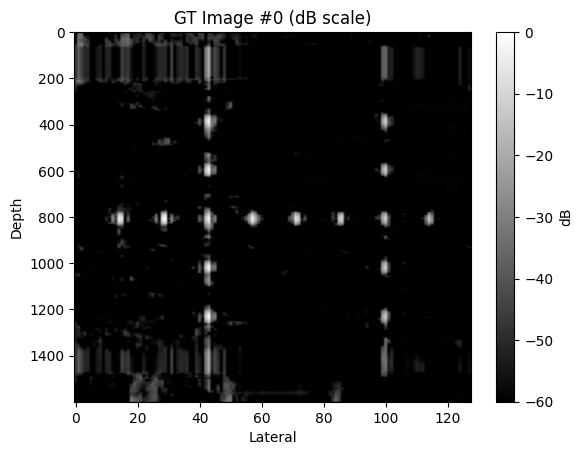

Training:  56%|█████▌    | 112/200 [2:07:26<1:40:21, 68.43s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348864



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292020



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320607



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254316



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285812



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274660



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305248



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355490



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366154



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262293



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324886



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283617



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239806



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292114



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360050



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392166



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288880



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276198



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.212482



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307912



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231921



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334122



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319385



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289077



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304365



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292044



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335355



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327857



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300303



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348759



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370926



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311614



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306178



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320606



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343185



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291698



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232820



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298750



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299835



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283513



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318570



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247085



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.220689



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304170



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305057



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350325



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329556



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270173



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281608



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332661



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370187



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375810



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294173



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277532



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434414



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345312



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354706



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367682



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278701



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380158



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316315



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335863



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368211



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235502



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337631



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308540



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361251



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293294



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281740



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340688



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2496
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.502283



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.314166

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.292007, PSNR≈29.23, SSIM≈0.8293



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.88it/s]

Batch 2/7: Loss=0.244634, PSNR≈38.44, SSIM≈0.8879



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.337701, PSNR≈31.03, SSIM≈0.8704



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.289694, PSNR≈29.29, SSIM≈0.8556



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.285048, PSNR≈37.13, SSIM≈0.9152



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.293716, PSNR≈35.05, SSIM≈0.8447



Training:  56%|█████▋    | 113/200 [2:08:34<1:39:04, 68.33s/it]

Batch 7/7: Loss=0.303642, PSNR≈39.53, SSIM≈0.9562

===> Validation finished. Avg Loss: 0.292349, Avg PSNR: 35.03, Avg SSIM: 0.8835
🔁 Learning Rate for next epoch: 0.002500
Epoch 113/200 | Train: 0.3142 | Val: 0.2923 | PSNR: 35.03 | SSIM: 0.8835
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349562



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276978



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241123



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333738



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309007



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377176



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288442



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306619



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314407



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350368



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339538



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370708



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253681



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280822



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325076



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318430



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.224792



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297908



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279421



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338293



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320104



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326804



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352928



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328328



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284746



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306763



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296314



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383579



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267644



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403929



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304223



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274160



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368304



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293667



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309343



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373217



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260322



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320279



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288146



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298687



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326125



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237174



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307627



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319873



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354576



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282186



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294542



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343630



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322547



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365885



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306990



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314291



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255097



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263310



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287339



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357075



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338186



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314030



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297370



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232247



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296634



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317712



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355736



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308784



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369826



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270947



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306330



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345015



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329110



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271829



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.239600



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.310834

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.295621, PSNR≈28.93, SSIM≈0.8607



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.246473, PSNR≈38.74, SSIM≈0.9052



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.339771, PSNR≈31.20, SSIM≈0.8837



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.290762, PSNR≈29.09, SSIM≈0.8624



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.288889, PSNR≈37.00, SSIM≈0.9323



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.94it/s]

Batch 6/7: Loss=0.299165, PSNR≈33.97, SSIM≈0.8060



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

Batch 7/7: Loss=0.305490, PSNR≈39.63, SSIM≈0.9652

===> Validation finished. Avg Loss: 0.295167, Avg PSNR: 35.10, Avg SSIM: 0.8892
🔁 Learning Rate for next epoch: 0.002500
Epoch 114/200 | Train: 0.3108 | Val: 0.2952 | PSNR: 35.10 | SSIM: 0.8892
torch.Size([16, 1, 1600, 128])


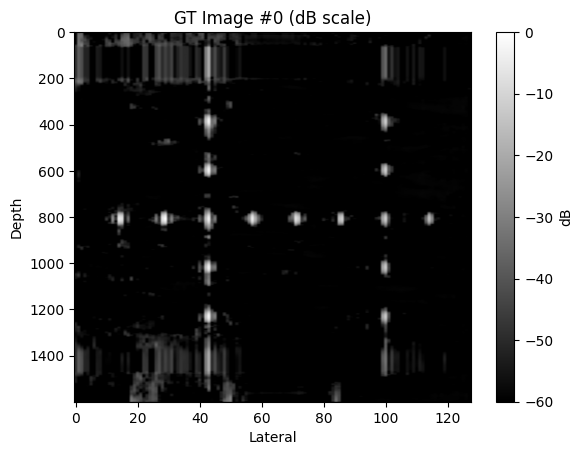

Training:  57%|█████▋    | 114/200 [2:09:43<1:38:02, 68.40s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275113



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275464



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325160



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330498



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340886



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296991



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323337



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300253



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312444



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278067



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310121



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307154



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376035



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362466



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316224



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273392



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333793



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340393



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342644



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333834



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308096



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323140



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282537



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293177



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346622



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316577



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326333



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319485



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308831



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343542



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280598



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270717



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315380



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337207



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307748



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378969



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320011



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256562



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292534



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314976



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316515



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240139



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258579



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296373



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340059



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287439



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302317



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320445



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361224



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329615



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344768



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280375



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328169



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321883



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340665



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289900



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298250



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310819



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280911



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293172



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311377



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299720



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372230



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258465



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344975



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265196



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217657



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.410265



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253140



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323730



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2487
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.396940



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.312572

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.298000, PSNR≈28.73, SSIM≈0.8484



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.250207, PSNR≈37.86, SSIM≈0.8730



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.343282, PSNR≈31.08, SSIM≈0.8904



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.297368, PSNR≈28.72, SSIM≈0.8513



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.84it/s]

Batch 5/7: Loss=0.293284, PSNR≈36.44, SSIM≈0.9083



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.81it/s]

Batch 6/7: Loss=0.302965, PSNR≈34.16, SSIM≈0.8204



Training:  57%|█████▊    | 115/200 [2:10:51<1:36:41, 68.26s/it]

Batch 7/7: Loss=0.309728, PSNR≈39.71, SSIM≈0.9570

===> Validation finished. Avg Loss: 0.299262, Avg PSNR: 34.89, Avg SSIM: 0.8845
🔁 Learning Rate for next epoch: 0.002500
Epoch 115/200 | Train: 0.3126 | Val: 0.2993 | PSNR: 34.89 | SSIM: 0.8845
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298073



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332349



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279793



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380746



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307585



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327135



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281621



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298660



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303654



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291944



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288025



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328055



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281988



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235494



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275356



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293402



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301096



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366601



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.387661



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269218



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335105



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300876



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280380



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287059



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322765



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361977



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240098



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258027



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290660



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336631



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302406



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297852



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.2494
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366684



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298959



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305555



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296415



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300295



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274791



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343731



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297813



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368126



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241336



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326525



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319205



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246056



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369519



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337398



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316795



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290135



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323913



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292004



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264934



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344716



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335602



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375341



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321951



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363734



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283763



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266108



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284886



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303447



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279892



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313031



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333587



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284298



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254593



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318350



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318212



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334295



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334696



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.247034



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.307324

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.81it/s]

Batch 1/7: Loss=0.293491, PSNR≈29.11, SSIM≈0.8637



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.78it/s]

Batch 2/7: Loss=0.245399, PSNR≈38.64, SSIM≈0.9061



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.81it/s]

Batch 3/7: Loss=0.338081, PSNR≈31.37, SSIM≈0.8880



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.80it/s]

Batch 4/7: Loss=0.290450, PSNR≈29.14, SSIM≈0.8624



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.77it/s]

Batch 5/7: Loss=0.287154, PSNR≈36.41, SSIM≈0.9067



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.296502, PSNR≈34.39, SSIM≈0.7979



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.82it/s]

Batch 7/7: Loss=0.305991, PSNR≈39.80, SSIM≈0.9556

===> Validation finished. Avg Loss: 0.293867, Avg PSNR: 35.05, Avg SSIM: 0.8867
🔁 Learning Rate for next epoch: 0.002500
Epoch 116/200 | Train: 0.3073 | Val: 0.2939 | PSNR: 35.05 | SSIM: 0.8867
torch.Size([16, 1, 1600, 128])


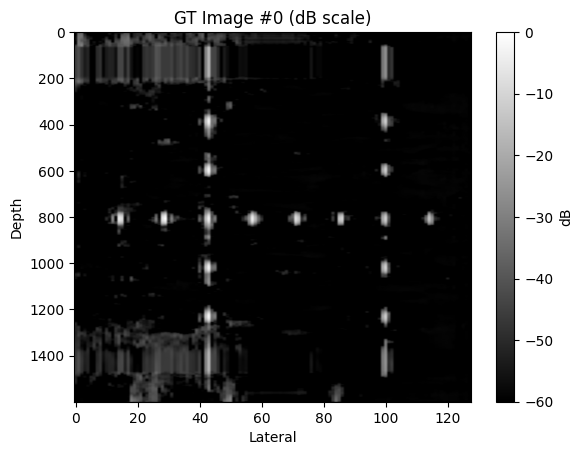

Training:  58%|█████▊    | 116/200 [2:12:00<1:35:43, 68.37s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266250



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337903



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288686



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300957



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332410



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331866



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303330



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.2499
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413835



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263373



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313633



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302685



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340556



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339724



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304755



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270485



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232646



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282037



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346615



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.222183



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309030



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239262



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371584



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343142



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253752



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304849



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305300



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303712



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.227276



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240995



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339337



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287460



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354076



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307602



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296732



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295215



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382307



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382396



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338387



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327702



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313579



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288423



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346155



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376676



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326572



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327823



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283939



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251023



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284335



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291597



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282709



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310044



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361606



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313194



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305721



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294449



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285626



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360446



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346755



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.404604



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255279



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262573



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.414674



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246061



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335792



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337607



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347152



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268471



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263223



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336239



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290890



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3684
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.415656



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.311732

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.304544, PSNR≈28.84, SSIM≈0.8571



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.254578, PSNR≈38.24, SSIM≈0.9023



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.349985, PSNR≈30.63, SSIM≈0.8794



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.301901, PSNR≈28.74, SSIM≈0.8511



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.95it/s]

Batch 5/7: Loss=0.299884, PSNR≈35.35, SSIM≈0.8812



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.94it/s]

Batch 6/7: Loss=0.306197, PSNR≈34.22, SSIM≈0.7990



Training:  58%|█████▊    | 117/200 [2:13:08<1:34:25, 68.26s/it]

Batch 7/7: Loss=0.314639, PSNR≈39.68, SSIM≈0.9507

===> Validation finished. Avg Loss: 0.304533, Avg PSNR: 34.72, Avg SSIM: 0.8754
🔁 Learning Rate for next epoch: 0.002500
Epoch 117/200 | Train: 0.3117 | Val: 0.3045 | PSNR: 34.72 | SSIM: 0.8754
No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317022



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291168



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285808



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379763



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315991



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392512



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290275



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323573



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357109



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331994



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355162



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354987



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356870



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306091



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342284



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323772



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299824



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320834



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329917



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317220



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351992



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287503



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316575



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311532



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225374



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328593



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274280



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323423



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351561



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313017



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307656



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258847



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264155



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341146



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282675



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335422



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274364



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293452



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328803



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376856



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264893



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359838



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339559



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300355



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313305



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293261



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258438



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322095



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286584



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310080



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244546



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.195975



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343594



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354446



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288330



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232987



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369446



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247581



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316678



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381034



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361523



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258581



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298886



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251618



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269644



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316728



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344066



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269036



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361922



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320882



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.293891



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.311397

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.98it/s]

Batch 1/7: Loss=0.310874, PSNR≈27.58, SSIM≈0.8205



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.98it/s]

Batch 2/7: Loss=0.266968, PSNR≈38.02, SSIM≈0.8915



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.96it/s]

Batch 3/7: Loss=0.382284, PSNR≈30.16, SSIM≈0.8785



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.97it/s]

Batch 4/7: Loss=0.348789, PSNR≈28.13, SSIM≈0.8280



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.97it/s]

Batch 5/7: Loss=0.320266, PSNR≈36.19, SSIM≈0.9168



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.97it/s]

Batch 6/7: Loss=0.342075, PSNR≈34.00, SSIM≈0.7807



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.97it/s]

Batch 7/7: Loss=0.334343, PSNR≈39.78, SSIM≈0.9620

===> Validation finished. Avg Loss: 0.329371, Avg PSNR: 33.92, Avg SSIM: 0.8630
🔁 Learning Rate for next epoch: 0.002500
Epoch 118/200 | Train: 0.3114 | Val: 0.3294 | PSNR: 33.92 | SSIM: 0.8630
torch.Size([16, 1, 1600, 128])


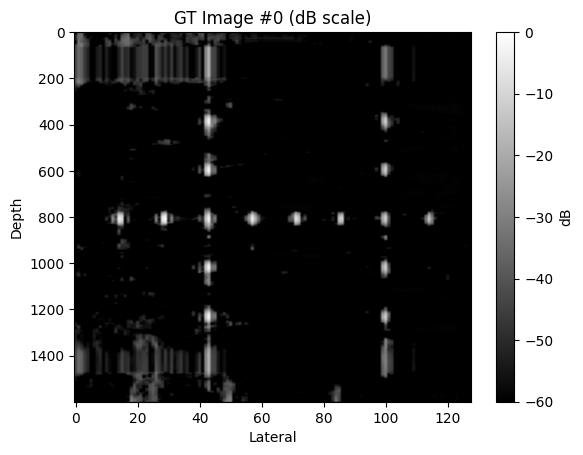

Training:  59%|█████▉    | 118/200 [2:14:16<1:33:22, 68.32s/it]

No improvement (5/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290415



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287862



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280102



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253349



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281194



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308776



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373082



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284855



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.392716



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277143



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253421



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371718



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.421029



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372619



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.373664



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267234



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340492



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333458



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364247



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294987



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289444



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362008



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413190



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327853



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367306



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314369



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285008



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371676



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328333



 41%|████      | 29/71 [00:26<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346662



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260674



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332650



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287393



 46%|████▋     | 33/71 [00:30<00:35,  1.08it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270208



 48%|████▊     | 34/71 [00:31<00:34,  1.08it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223658



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294976



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295647



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374762



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290422



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322937



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.220414



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351651



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401658



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347720



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274968



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345103



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239771



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281166



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346599



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.403979



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329547



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377523



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277496



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304338



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312036



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365870



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316191



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352668



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320340



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338610



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350092



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285088



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311324



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359557



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278610



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309903



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337397



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243183



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299490



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295675



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.323459



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.319478

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.301907, PSNR≈29.13, SSIM≈0.8597



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.96it/s]

Batch 2/7: Loss=0.256316, PSNR≈38.38, SSIM≈0.9027



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.87it/s]

Batch 3/7: Loss=0.348061, PSNR≈30.80, SSIM≈0.8808



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.88it/s]

Batch 4/7: Loss=0.305652, PSNR≈29.10, SSIM≈0.8594



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.300654, PSNR≈34.99, SSIM≈0.8747



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.309070, PSNR≈33.94, SSIM≈0.7933



Training:  60%|█████▉    | 119/200 [2:15:24<1:32:04, 68.21s/it]

Batch 7/7: Loss=0.314176, PSNR≈38.46, SSIM≈0.9604

===> Validation finished. Avg Loss: 0.305120, Avg PSNR: 34.48, Avg SSIM: 0.8848
🔁 Learning Rate for next epoch: 0.001250
Epoch 119/200 | Train: 0.3195 | Val: 0.3051 | PSNR: 34.48 | SSIM: 0.8848
No improvement (6/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379957



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273356



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319823



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294738



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360296



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246472



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287476



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275562



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289743



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345942



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300120



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335240



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276855



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297549



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287178



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307022



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287729



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271789



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320315



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.398231



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359610



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288280



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325304



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318882



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283810



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258673



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283986



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308475



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271079



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382890



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303679



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355126



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305941



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323670



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358375



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337869



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303345



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260148



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223832



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297102



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342007



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272970



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285448



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.364365



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322245



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312576



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277298



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301160



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292498



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323778



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257935



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316086



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321292



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316390



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283208



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272636



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314300



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357862



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264005



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263953



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246943



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301698



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354375



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311178



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368327



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250956



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374621



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327402



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282244



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318765



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.275491



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.306753

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.01it/s]

Batch 1/7: Loss=0.290937, PSNR≈29.28, SSIM≈0.8671



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.96it/s]

Batch 2/7: Loss=0.243743, PSNR≈38.49, SSIM≈0.9028



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.333793, PSNR≈31.25, SSIM≈0.8912



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.96it/s]

Batch 4/7: Loss=0.288826, PSNR≈29.33, SSIM≈0.8585



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.96it/s]

Batch 5/7: Loss=0.282941, PSNR≈36.41, SSIM≈0.9267



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.294649, PSNR≈34.04, SSIM≈0.8032



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.92it/s]

Batch 7/7: Loss=0.301703, PSNR≈38.66, SSIM≈0.9672

===> Validation finished. Avg Loss: 0.290942, Avg PSNR: 34.95, Avg SSIM: 0.8929
🔁 Learning Rate for next epoch: 0.001250
Epoch 120/200 | Train: 0.3068 | Val: 0.2909 | PSNR: 34.95 | SSIM: 0.8929
torch.Size([16, 1, 1600, 128])


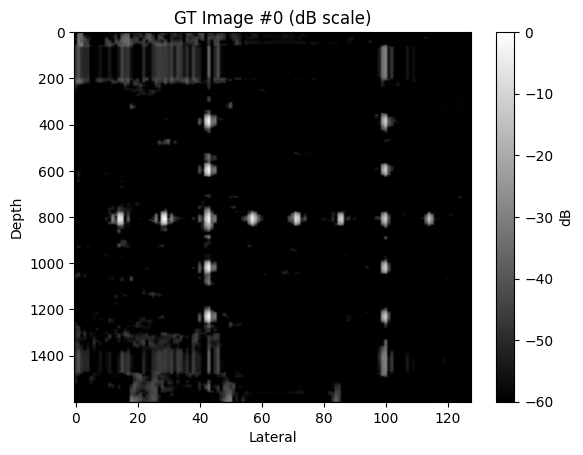

Training:  60%|██████    | 120/200 [2:16:33<1:31:08, 68.36s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305901



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320903



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274457



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338548



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298204



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324299



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300716



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268488



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291231



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277090



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308692



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348645



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282232



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300064



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296155



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378424



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289705



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327537



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251312



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269317



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339819



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331303



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298004



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282859



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413522



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305721



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288914



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288147



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259521



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319986



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258117



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.376214



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342729



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278999



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314025



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295837



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271107



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342680



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325599



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286127



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300502



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300770



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280685



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349823



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296037



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327851



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328370



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258256



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307992



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288044



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266405



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302398



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242422



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273076



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370721



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369886



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305199



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324697



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278375



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334616



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302931



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316103



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230108



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.212661



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332474



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239669



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287985



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298888



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259450



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390321



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.349691



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.304191

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.288592, PSNR≈29.28, SSIM≈0.8702



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.241140, PSNR≈38.71, SSIM≈0.9041



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.86it/s]

Batch 3/7: Loss=0.331328, PSNR≈31.66, SSIM≈0.8942



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.90it/s]

Batch 4/7: Loss=0.284719, PSNR≈29.37, SSIM≈0.8359



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.92it/s]

Batch 5/7: Loss=0.280310, PSNR≈36.30, SSIM≈0.9108



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.91it/s]

Batch 6/7: Loss=0.290671, PSNR≈34.25, SSIM≈0.8074



Training:  60%|██████    | 121/200 [2:17:41<1:29:53, 68.27s/it]

Batch 7/7: Loss=0.299369, PSNR≈39.21, SSIM≈0.9687

===> Validation finished. Avg Loss: 0.288019, Avg PSNR: 35.20, Avg SSIM: 0.8936
🔁 Learning Rate for next epoch: 0.001250
Epoch 121/200 | Train: 0.3042 | Val: 0.2880 | PSNR: 35.20 | SSIM: 0.8936
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340225



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308523



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302482



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352181



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293380



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360395



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333212



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301921



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322928



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305333



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285327



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281652



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261958



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253483



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279262



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379760



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267545



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313046



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260784



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338108



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260011



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301108



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238933



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221150



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225350



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370976



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259633



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360223



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425198



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249717



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274706



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337188



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303452



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283842



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274839



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295087



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343440



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278973



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325615



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352137



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345144



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247345



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320658



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371406



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326388



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312512



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304360



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341621



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238770



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344208



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276854



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301786



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290142



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274755



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325897



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281774



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258006



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318267



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312223



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340187



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321968



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246770



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273401



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349399



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313770



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343751



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259812



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293361



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262515



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307199



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.218715



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.302057

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.96it/s]

Batch 1/7: Loss=0.287793, PSNR≈29.29, SSIM≈0.8485



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.240430, PSNR≈38.93, SSIM≈0.9071



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.85it/s]

Batch 3/7: Loss=0.331221, PSNR≈31.49, SSIM≈0.8945



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.285432, PSNR≈29.35, SSIM≈0.8450



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.281147, PSNR≈36.98, SSIM≈0.9185



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.290821, PSNR≈34.75, SSIM≈0.7976



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.298962, PSNR≈39.60, SSIM≈0.9674

===> Validation finished. Avg Loss: 0.287972, Avg PSNR: 35.25, Avg SSIM: 0.8917
🔁 Learning Rate for next epoch: 0.001250
Epoch 122/200 | Train: 0.3021 | Val: 0.2880 | PSNR: 35.25 | SSIM: 0.8917
torch.Size([16, 1, 1600, 128])


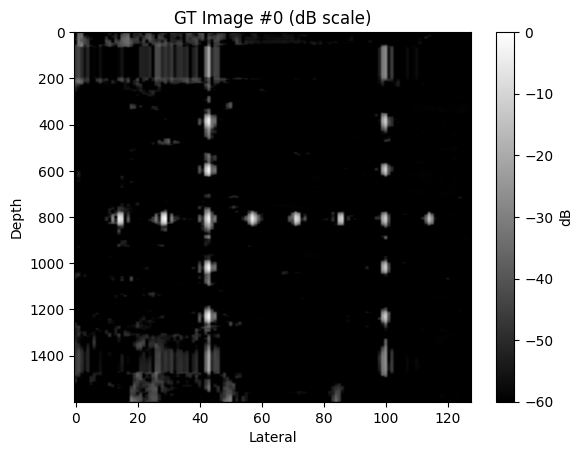

Training:  61%|██████    | 122/200 [2:18:49<1:28:52, 68.37s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290612



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293307



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368768



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301701



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291540



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303667



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350786



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371301



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359982



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323592



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275966



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298352



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297401



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307670



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338630



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300651



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331849



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324709



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357779



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287582



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242874



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284170



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302893



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341302



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264709



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310280



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323624



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256065



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356045



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252035



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260737



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272275



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319151



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257707



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288739



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332147



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278383



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268653



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312200



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268298



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288932



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233532



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342292



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297025



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314171



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284023



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245779



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239917



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301570



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328163



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357968



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280994



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281390



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276951



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290791



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304521



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325905



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267542



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265386



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319668



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381120



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342535



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343737



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316984



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228757



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324414



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282358



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260258



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245216



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299625



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.280611



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.300285

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.287129, PSNR≈29.38, SSIM≈0.8598



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.240052, PSNR≈38.69, SSIM≈0.9091



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.330314, PSNR≈31.43, SSIM≈0.8915



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.286067, PSNR≈29.42, SSIM≈0.8454



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.280976, PSNR≈35.95, SSIM≈0.9181



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.291232, PSNR≈34.45, SSIM≈0.8077



Training:  62%|██████▏   | 123/200 [2:19:57<1:27:37, 68.28s/it]

Batch 7/7: Loss=0.296901, PSNR≈39.68, SSIM≈0.9620

===> Validation finished. Avg Loss: 0.287525, Avg PSNR: 35.16, Avg SSIM: 0.8896
🔁 Learning Rate for next epoch: 0.001250
Epoch 123/200 | Train: 0.3003 | Val: 0.2875 | PSNR: 35.16 | SSIM: 0.8896
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300536



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293429



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237328



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293786



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306959



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348611



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306188



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230250



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336063



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332541



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274879



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322838



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286278



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.418036



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311158



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297675



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292771



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374829



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284364



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278557



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296063



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.375359



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329717



 32%|███▏      | 23/71 [00:21<00:45,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297113



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231646



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308027



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305323



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246449



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390971



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237824



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256565



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310314



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273601



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331414



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261001



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267963



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281118



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247970



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284696



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264989



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309896



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326766



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329278



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346673



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271250



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307623



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254656



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269069



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245430



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235607



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289616



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347809



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.227877



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322471



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367513



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369349



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248292



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317759



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281260



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284536



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337817



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330018



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322740



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292335



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381110



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279087



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291424



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381814



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289051



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306476



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.335739



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.301768

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.285343, PSNR≈29.38, SSIM≈0.8676



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.240392, PSNR≈38.59, SSIM≈0.9074



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.89it/s]

Batch 3/7: Loss=0.330730, PSNR≈31.38, SSIM≈0.8888



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.283513, PSNR≈29.49, SSIM≈0.8577



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.278879, PSNR≈36.75, SSIM≈0.9043



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.85it/s]

Batch 6/7: Loss=0.289989, PSNR≈34.27, SSIM≈0.8069



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.87it/s]

Batch 7/7: Loss=0.297330, PSNR≈39.73, SSIM≈0.9591

===> Validation finished. Avg Loss: 0.286597, Avg PSNR: 35.31, Avg SSIM: 0.8919
🔁 Learning Rate for next epoch: 0.001250
Epoch 124/200 | Train: 0.3018 | Val: 0.2866 | PSNR: 35.31 | SSIM: 0.8919
torch.Size([16, 1, 1600, 128])


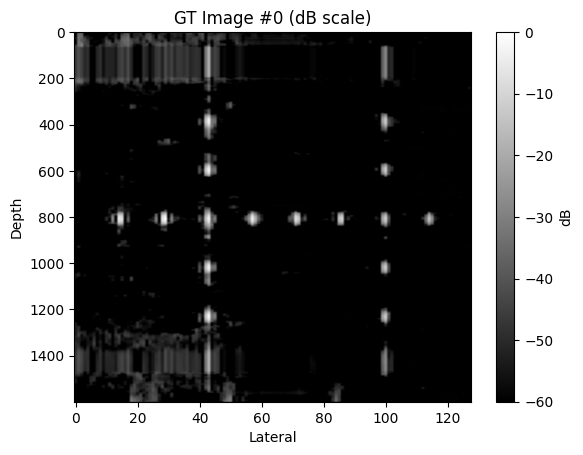

Training:  62%|██████▏   | 124/200 [2:21:06<1:26:37, 68.39s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292212



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275344



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270908



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246876



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333493



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325676



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326159



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324475



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290028



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279294



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299300



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352587



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276089



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337499



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290310



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291453



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309208



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269483



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298150



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283970



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363044



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265484



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301949



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312953



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275290



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270203



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365789



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294831



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.199915



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259198



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315400



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335967



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332270



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298090



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348413



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321028



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274077



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300301



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279423



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312850



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.200588



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313741



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312165



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280939



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295612



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314078



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306225



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271045



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365150



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263138



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284276



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294845



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298656



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372762



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306407



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371296



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257866



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291836



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320555



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280456



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291528



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312406



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321897



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296001



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248844



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333847



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262002



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311191



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333676



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315442



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.0703
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.393695



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.301706

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.288477, PSNR≈29.39, SSIM≈0.8667



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.242781, PSNR≈38.95, SSIM≈0.9048



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.335303, PSNR≈31.15, SSIM≈0.8901



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.290254, PSNR≈29.26, SSIM≈0.8338



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.286368, PSNR≈36.43, SSIM≈0.9031



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.296483, PSNR≈34.08, SSIM≈0.7904



Training:  62%|██████▎   | 125/200 [2:22:14<1:25:19, 68.26s/it]

Batch 7/7: Loss=0.299810, PSNR≈39.86, SSIM≈0.9651

===> Validation finished. Avg Loss: 0.291354, Avg PSNR: 35.16, Avg SSIM: 0.8882
🔁 Learning Rate for next epoch: 0.001250
Epoch 125/200 | Train: 0.3017 | Val: 0.2914 | PSNR: 35.16 | SSIM: 0.8882
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303785



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305865



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276856



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311978



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234319



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.188475



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369784



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295055



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273297



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286072



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312471



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276188



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346196



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312864



 20%|█▉        | 14/71 [00:13<00:53,  1.06it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284624



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321274



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318587



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332478



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280591



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246822



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296842



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311290



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335091



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297772



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310219



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308123



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259807



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283456



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360100



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302993



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.401622



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271160



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317142



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278657



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351593



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256656



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245119



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308321



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297000



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.425820



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345390



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361129



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377893



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328422



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260612



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301424



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297215



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245322



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289888



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257316



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286343



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322776



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298760



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368899



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225824



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258326



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290498



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278252



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335068



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289767



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282350



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287868



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313723



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286677



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292340



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.205615



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281114



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335208



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356065



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309155



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2484
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.433654



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.302806

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:01,  3.01it/s]

Batch 1/7: Loss=0.286811, PSNR≈29.41, SSIM≈0.8733



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.97it/s]

Batch 2/7: Loss=0.241252, PSNR≈38.68, SSIM≈0.9055



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.331486, PSNR≈31.53, SSIM≈0.8924



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.284401, PSNR≈29.48, SSIM≈0.8665



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.93it/s]

Batch 5/7: Loss=0.280107, PSNR≈36.63, SSIM≈0.9064



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.290015, PSNR≈34.50, SSIM≈0.8080



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.94it/s]

Batch 7/7: Loss=0.298201, PSNR≈39.54, SSIM≈0.9638

===> Validation finished. Avg Loss: 0.287468, Avg PSNR: 35.24, Avg SSIM: 0.8928
🔁 Learning Rate for next epoch: 0.001250
Epoch 126/200 | Train: 0.3028 | Val: 0.2875 | PSNR: 35.24 | SSIM: 0.8928
torch.Size([16, 1, 1600, 128])


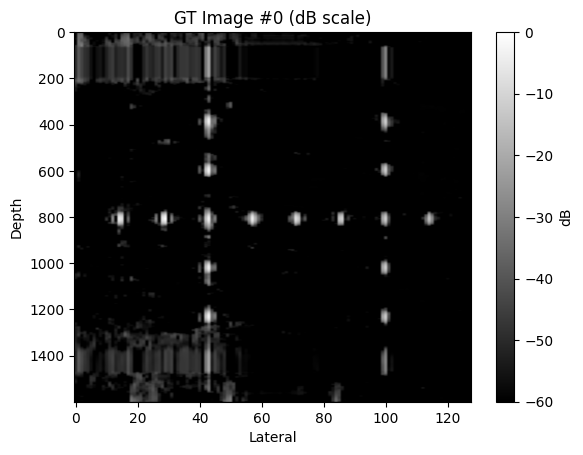

Training:  63%|██████▎   | 126/200 [2:23:23<1:24:17, 68.35s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343172



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298947



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336653



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290844



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329431



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309484



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242791



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323660



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.201311



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317407



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.407341



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313997



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326818



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238324



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246559



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359501



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.2490
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377835



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285229



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279101



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352982



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326500



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263887



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275815



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381694



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329631



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331978



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.214680



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287816



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272147



 41%|████      | 29/71 [00:27<00:39,  1.08it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291331



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308259



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295426



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244359



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356849



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262789



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329449



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241110



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249272



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324384



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314241



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257737



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290046



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310116



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379867



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355212



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252718



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318522



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277885



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277979



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269568



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324334



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.222188



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292984



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272230



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324157



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346581



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292305



 80%|████████  | 57/71 [00:53<00:12,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355863



 82%|████████▏ | 58/71 [00:53<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265946



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289249



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272061



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.419416



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293711



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279314



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306668



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223402



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307220



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326710



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284294



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229673



 99%|█████████▊| 70/71 [01:05<00:00,  1.08it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.313245



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.300200

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.91it/s]

Batch 1/7: Loss=0.284302, PSNR≈29.33, SSIM≈0.8711



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.92it/s]

Batch 2/7: Loss=0.237923, PSNR≈38.74, SSIM≈0.9084



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.329390, PSNR≈31.52, SSIM≈0.8843



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.96it/s]

Batch 4/7: Loss=0.281771, PSNR≈29.47, SSIM≈0.8705



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.96it/s]

Batch 5/7: Loss=0.277930, PSNR≈36.62, SSIM≈0.9205



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.95it/s]

Batch 6/7: Loss=0.288716, PSNR≈34.32, SSIM≈0.8080



Training:  64%|██████▎   | 127/200 [2:24:30<1:23:00, 68.22s/it]

Batch 7/7: Loss=0.296409, PSNR≈39.98, SSIM≈0.9634

===> Validation finished. Avg Loss: 0.285206, Avg PSNR: 35.37, Avg SSIM: 0.8937
🔁 Learning Rate for next epoch: 0.001250
Epoch 127/200 | Train: 0.3002 | Val: 0.2852 | PSNR: 35.37 | SSIM: 0.8937
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304566



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359312



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316678



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3682
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307002



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345571



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238939



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329978



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257149



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349973



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310253



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294067



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297614



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366237



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331235



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274935



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363323



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336281



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301826



 25%|██▌       | 18/71 [00:16<00:49,  1.08it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316851



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303106



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304087



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347133



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275373



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.212412



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245752



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312344



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.367581



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332181



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356418



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287096



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303082



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251461



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300046



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306361



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317900



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361417



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290853



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278782



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304153



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273664



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280485



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260242



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271709



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355038



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312281



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302038



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313849



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225954



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269876



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229979



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273099



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276709



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267016



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.212114



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257479



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360512



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290189



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346021



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262495



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315070



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265983



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259830



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303045



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246155



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377246



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331113



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294901



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294992



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286656



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291478



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.290447



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.299394

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.77it/s]

Batch 1/7: Loss=0.286281, PSNR≈29.38, SSIM≈0.8702



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.89it/s]

Batch 2/7: Loss=0.239784, PSNR≈38.72, SSIM≈0.9054



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.331303, PSNR≈31.67, SSIM≈0.8918



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.283990, PSNR≈29.39, SSIM≈0.8723



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.279382, PSNR≈36.32, SSIM≈0.9332



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.290380, PSNR≈34.45, SSIM≈0.8129



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.88it/s]

Batch 7/7: Loss=0.297882, PSNR≈39.79, SSIM≈0.9650

===> Validation finished. Avg Loss: 0.287000, Avg PSNR: 35.30, Avg SSIM: 0.8950
🔁 Learning Rate for next epoch: 0.001250
Epoch 128/200 | Train: 0.2994 | Val: 0.2870 | PSNR: 35.30 | SSIM: 0.8950
torch.Size([16, 1, 1600, 128])


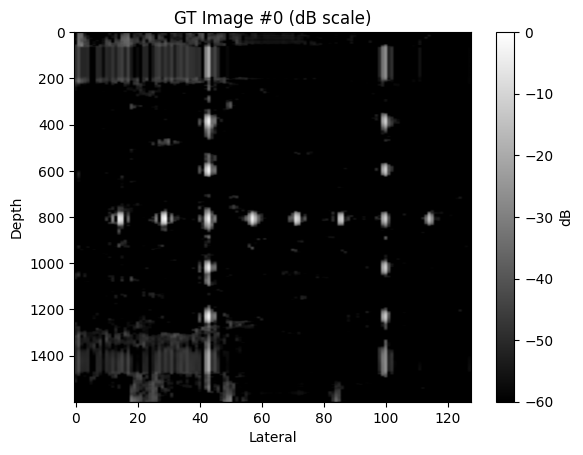

Training:  64%|██████▍   | 128/200 [2:25:39<1:21:59, 68.32s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267511



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251466



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288419



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287517



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302969



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266125



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3703
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316426



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308563



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228256



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297901



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290819



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286866



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291503



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325969



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250041



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304820



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.222178



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303066



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330225



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329812



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322472



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301451



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284137



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315860



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304536



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268398



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250645



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254147



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354364



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313845



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225085



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299892



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351546



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263465



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327841



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380317



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245112



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315728



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276844



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286169



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266208



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338179



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359437



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282881



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299366



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3699
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314351



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352254



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301714



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225567



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272631



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366291



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357654



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281234



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349342



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278675



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276503



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266860



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299071



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293082



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304945



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295984



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242519



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.380433



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347137



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325926



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.390603



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290049



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306312



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326841



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278664



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.212923



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.298253

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.285893, PSNR≈29.35, SSIM≈0.8700



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.237655, PSNR≈38.60, SSIM≈0.9038



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.330675, PSNR≈31.54, SSIM≈0.8925



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.284268, PSNR≈29.42, SSIM≈0.8647



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.278850, PSNR≈36.19, SSIM≈0.9334



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.289519, PSNR≈33.91, SSIM≈0.8048



Training:  64%|██████▍   | 129/200 [2:26:47<1:20:42, 68.21s/it]

Batch 7/7: Loss=0.295575, PSNR≈39.96, SSIM≈0.9688

===> Validation finished. Avg Loss: 0.286062, Avg PSNR: 35.30, Avg SSIM: 0.8953
🔁 Learning Rate for next epoch: 0.001250
Epoch 129/200 | Train: 0.2983 | Val: 0.2861 | PSNR: 35.30 | SSIM: 0.8953
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298824



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.434663



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289229



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257754



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334816



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309778



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243014



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303511



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265559



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309336



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312729



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281162



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386137



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302713



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305569



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297855



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295783



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313823



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310663



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324680



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245794



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3689
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290817



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333048



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272961



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304882



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327987



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322670



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336181



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284480



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248093



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288341



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270220



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302743



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312406



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282177



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279708



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292820



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267508



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293166



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277636



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331984



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315854



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277438



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272592



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314486



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303585



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298900



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245828



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221509



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310074



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320886



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328171



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279660



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295451



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300369



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278912



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372001



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301680



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323886



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295817



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279142



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345385



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264308



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327304



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325900



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259953



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237688



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317440



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250192



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329457



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.334135



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.299595

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.286331, PSNR≈29.31, SSIM≈0.8715



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.241703, PSNR≈38.78, SSIM≈0.9077



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.336077, PSNR≈31.17, SSIM≈0.8796



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.288626, PSNR≈29.43, SSIM≈0.8630



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.280475, PSNR≈36.29, SSIM≈0.9169



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.294416, PSNR≈34.32, SSIM≈0.8121



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

Batch 7/7: Loss=0.300222, PSNR≈39.77, SSIM≈0.9621

===> Validation finished. Avg Loss: 0.289693, Avg PSNR: 35.18, Avg SSIM: 0.8922
🔁 Learning Rate for next epoch: 0.001250
Epoch 130/200 | Train: 0.2996 | Val: 0.2897 | PSNR: 35.18 | SSIM: 0.8922
torch.Size([16, 1, 1600, 128])


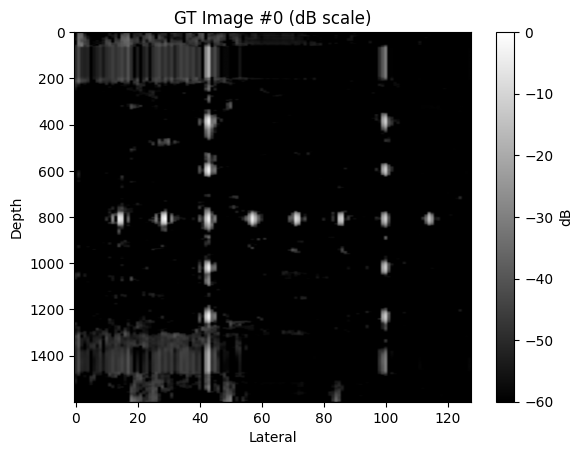

Training:  65%|██████▌   | 130/200 [2:27:55<1:19:40, 68.29s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302203



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242646



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366257



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356712



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251929



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243602



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353173



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272884



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260880



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312013



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286731



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263151



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327016



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289971



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232341



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326479



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.413095



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306257



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239143



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276376



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329322



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321237



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311608



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289247



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365904



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283050



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279638



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350140



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262658



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314122



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272588



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241051



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288267



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310053



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327495



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342562



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302854



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.406881



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277042



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276781



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323056



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.210746



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335271



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306800



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.198379



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297218



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308148



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307997



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273454



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.218526



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306152



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329338



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307220



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255959



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274560



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300948



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276847



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281685



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279038



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328234



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298552



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379845



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315068



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297972



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312201



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314865



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320671



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324579



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334891



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297447



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.399493



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.301275

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.90it/s]

Batch 1/7: Loss=0.287023, PSNR≈29.32, SSIM≈0.8698



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.241048, PSNR≈38.69, SSIM≈0.9069



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.92it/s]

Batch 3/7: Loss=0.335411, PSNR≈30.93, SSIM≈0.8786



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.284414, PSNR≈29.48, SSIM≈0.8619



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.281502, PSNR≈37.13, SSIM≈0.9361



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.89it/s]

Batch 6/7: Loss=0.291819, PSNR≈34.12, SSIM≈0.8135



Training:  66%|██████▌   | 131/200 [2:29:03<1:18:26, 68.21s/it]

Batch 7/7: Loss=0.298435, PSNR≈39.62, SSIM≈0.9582

===> Validation finished. Avg Loss: 0.288522, Avg PSNR: 35.21, Avg SSIM: 0.8937
🔁 Learning Rate for next epoch: 0.001250
Epoch 131/200 | Train: 0.3013 | Val: 0.2885 | PSNR: 35.21 | SSIM: 0.8937
No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314569



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308048



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328879



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281151



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234374



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291533



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325468



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341011



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349035



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258530



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334879



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350948



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294800



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298817



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261108



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248030



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279937



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233692



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255064



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345743



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274412



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351706



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253890



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299586



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284609



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356348



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285120



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271732



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319425



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245815



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281088



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269473



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292587



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286203



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321377



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350473



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259769



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289559



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352707



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260590



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326294



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269460



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327239



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337870



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314577



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341830



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321994



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221948



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290435



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316632



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274977



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362413



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378046



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330041



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343935



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327890



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308826



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320507



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264521



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299893



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261115



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333435



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281333



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298728



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298848



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263054



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305753



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311816



 96%|█████████▌| 68/71 [01:03<00:02,  1.08it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280821



 97%|█████████▋| 69/71 [01:04<00:01,  1.08it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217200



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.369449



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.300605

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.83it/s]

Batch 1/7: Loss=0.288111, PSNR≈29.26, SSIM≈0.8722



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.76it/s]

Batch 2/7: Loss=0.239441, PSNR≈38.99, SSIM≈0.9109



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.79it/s]

Batch 3/7: Loss=0.332968, PSNR≈31.08, SSIM≈0.8925



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.288043, PSNR≈29.35, SSIM≈0.8727



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.283508, PSNR≈35.90, SSIM≈0.9285



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.292869, PSNR≈34.18, SSIM≈0.7998



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.83it/s]

Batch 7/7: Loss=0.297033, PSNR≈39.81, SSIM≈0.9652

===> Validation finished. Avg Loss: 0.288854, Avg PSNR: 35.18, Avg SSIM: 0.8950
🔁 Learning Rate for next epoch: 0.001250
Epoch 132/200 | Train: 0.3006 | Val: 0.2889 | PSNR: 35.18 | SSIM: 0.8950
torch.Size([16, 1, 1600, 128])


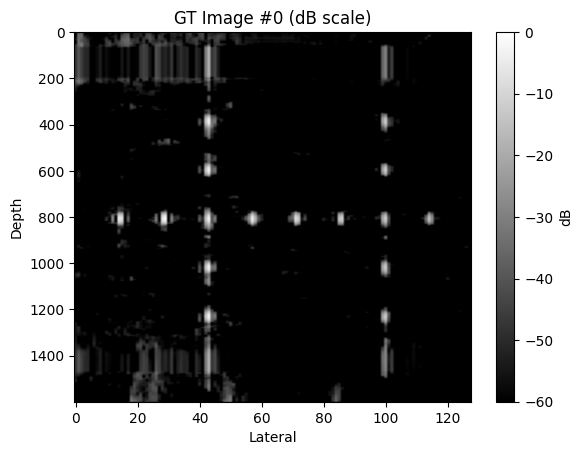

Training:  66%|██████▌   | 132/200 [2:30:12<1:17:27, 68.35s/it]

No improvement (5/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317996



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316584



  3%|▎         | 2/71 [00:01<01:04,  1.06it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284544



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322576



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287558



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290178



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281206



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266639



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236881



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253737



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303239



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283820



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339134



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294095



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335547



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314045



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346266



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289590



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257910



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245189



 28%|██▊       | 20/71 [00:18<00:47,  1.06it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338939



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299278



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268988



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284986



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354479



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327582



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242509



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267416



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302526



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.358667



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369063



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267012



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257262



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260774



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338946



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378551



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251193



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332577



 54%|█████▎    | 38/71 [00:35<00:31,  1.06it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295980



 55%|█████▍    | 39/71 [00:36<00:30,  1.06it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273306



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322417



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253034



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350244



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382922



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335610



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279866



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360348



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256737



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302803



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319283



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316138



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262086



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372215



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303208



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291777



 77%|███████▋  | 55/71 [00:51<00:15,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307318



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277419



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233027



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264145



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336113



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307145



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246480



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241585



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269188



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255814



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294879



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342569



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313809



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279546



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335362



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.191963



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.297772

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.288131, PSNR≈29.32, SSIM≈0.8715



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.241943, PSNR≈38.70, SSIM≈0.9078



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.83it/s]

Batch 3/7: Loss=0.333686, PSNR≈31.45, SSIM≈0.8940



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.81it/s]

Batch 4/7: Loss=0.286386, PSNR≈29.37, SSIM≈0.8622



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.80it/s]

Batch 5/7: Loss=0.282775, PSNR≈36.42, SSIM≈0.9156



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.84it/s]

Batch 6/7: Loss=0.292723, PSNR≈34.69, SSIM≈0.8005



Training:  66%|██████▋   | 133/200 [2:31:20<1:16:15, 68.29s/it]

Batch 7/7: Loss=0.299269, PSNR≈39.83, SSIM≈0.9633

===> Validation finished. Avg Loss: 0.289273, Avg PSNR: 35.15, Avg SSIM: 0.8902
🔁 Learning Rate for next epoch: 0.000625
Epoch 133/200 | Train: 0.2978 | Val: 0.2893 | PSNR: 35.15 | SSIM: 0.8902
No improvement (6/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312174



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311931



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314057



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266672



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286078



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330931



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299097



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228496



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350522



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303771



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259294



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264832



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285631



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340334



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274742



 21%|██        | 15/71 [00:14<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321841



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349432



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272249



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286284



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320316



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279756



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314045



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308263



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283961



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294955



 35%|███▌      | 25/71 [00:23<00:43,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321362



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357252



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287884



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268213



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310964



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277051



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285311



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271920



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235227



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311072



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335299



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.220953



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317125



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271963



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232846



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344786



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9084
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303037



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288892



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311840



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249372



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332423



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301215



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9080
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269844



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.227062



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327386



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309148



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276982



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279397



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313912



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.226002



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306611



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320172



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277263



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.199301



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339596



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.386205



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331439



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304099



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335426



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305345



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271180



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256418



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310329



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355327



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294918



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3690
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.315130



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.296256

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.283083, PSNR≈29.47, SSIM≈0.8748



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.235600, PSNR≈38.92, SSIM≈0.9118



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.326238, PSNR≈31.69, SSIM≈0.8950



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.93it/s]

Batch 4/7: Loss=0.280995, PSNR≈29.56, SSIM≈0.8635



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.276211, PSNR≈36.03, SSIM≈0.9106



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.93it/s]

Batch 6/7: Loss=0.286850, PSNR≈34.18, SSIM≈0.8134



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.93it/s]

Batch 7/7: Loss=0.292702, PSNR≈39.91, SSIM≈0.9671

===> Validation finished. Avg Loss: 0.283097, Avg PSNR: 35.42, Avg SSIM: 0.8965
🔁 Learning Rate for next epoch: 0.000625
Epoch 134/200 | Train: 0.2963 | Val: 0.2831 | PSNR: 35.42 | SSIM: 0.8965
torch.Size([16, 1, 1600, 128])


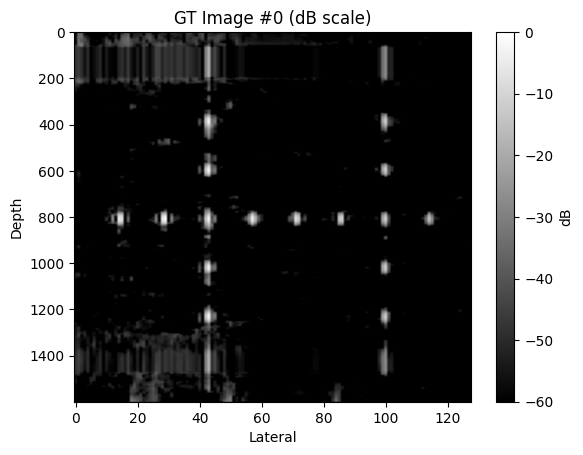

Training:  67%|██████▋   | 134/200 [2:32:29<1:15:15, 68.42s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287372



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302659



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309257



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278116



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336132



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290224



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275743



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308236



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298102



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276712



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217783



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354549



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298170



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288085



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336569



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271376



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286280



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306112



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297139



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285213



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301392



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275835



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278509



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280174



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265739



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259538



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9081
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371655



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371958



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360597



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272734



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.382526



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315278



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262153



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346152



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313340



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259478



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350177



 52%|█████▏    | 37/71 [00:34<00:31,  1.08it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267810



 54%|█████▎    | 38/71 [00:35<00:30,  1.08it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265417



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289754



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.227684



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267003



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307412



 61%|██████    | 43/71 [00:40<00:25,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282688



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310064



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255948



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328846



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295040



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320271



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326594



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233888



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238365



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292042



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331876



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236489



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368988



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282370



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352771



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368286



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359942



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294960



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280360



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302916



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310327



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251430



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298320



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.209694



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236918



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305117



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242142



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.225003



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.294899

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.285209, PSNR≈29.39, SSIM≈0.8739



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.237465, PSNR≈39.04, SSIM≈0.9112



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.329940, PSNR≈31.32, SSIM≈0.8851



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.91it/s]

Batch 4/7: Loss=0.284463, PSNR≈29.52, SSIM≈0.8706



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.279928, PSNR≈36.25, SSIM≈0.9164



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.289975, PSNR≈34.38, SSIM≈0.8018



Training:  68%|██████▊   | 135/200 [2:33:37<1:13:57, 68.27s/it]

Batch 7/7: Loss=0.294789, PSNR≈39.94, SSIM≈0.9676

===> Validation finished. Avg Loss: 0.285967, Avg PSNR: 35.34, Avg SSIM: 0.8944
🔁 Learning Rate for next epoch: 0.000625
Epoch 135/200 | Train: 0.2949 | Val: 0.2860 | PSNR: 35.34 | SSIM: 0.8944
No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276344



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.377816



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271394



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255157



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287463



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292333



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261554



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239948



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.344876



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326760



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285576



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284908



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253023



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286915



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252123



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251101



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276829



 24%|██▍       | 17/71 [00:15<00:50,  1.08it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311934



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315591



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320555



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319755



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320436



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235647



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.372312



 34%|███▍      | 24/71 [00:22<00:44,  1.06it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310664



 35%|███▌      | 25/71 [00:23<00:43,  1.06it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323506



 37%|███▋      | 26/71 [00:24<00:42,  1.06it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275948



 38%|███▊      | 27/71 [00:25<00:41,  1.06it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338515



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259840



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.213816



 42%|████▏     | 30/71 [00:28<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297762



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313639



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297675



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331136



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3685
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.374031



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301607



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312147



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.378155



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330685



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321178



 56%|█████▋    | 40/71 [00:37<00:29,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319884



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317708



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266284



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231562



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314048



 63%|██████▎   | 45/71 [00:42<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238380



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282620



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266644



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295754



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292519



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.203473



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321227



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337229



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287137



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271767



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282504



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292052



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285239



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332133



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349070



 85%|████████▍ | 60/71 [00:56<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336383



 86%|████████▌ | 61/71 [00:57<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299345



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272713



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280961



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333478



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316108



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266107



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250935



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273044



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268109



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2477
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.330152



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.295989

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.83it/s]

Batch 1/7: Loss=0.289262, PSNR≈29.30, SSIM≈0.8590



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.240095, PSNR≈38.83, SSIM≈0.9097



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.85it/s]

Batch 3/7: Loss=0.333604, PSNR≈31.13, SSIM≈0.8931



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.84it/s]

Batch 4/7: Loss=0.288956, PSNR≈29.33, SSIM≈0.8636



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.284626, PSNR≈35.99, SSIM≈0.9100



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.293125, PSNR≈34.35, SSIM≈0.7917



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]

Batch 7/7: Loss=0.298554, PSNR≈39.97, SSIM≈0.9690

===> Validation finished. Avg Loss: 0.289746, Avg PSNR: 35.20, Avg SSIM: 0.8893
🔁 Learning Rate for next epoch: 0.000625
Epoch 136/200 | Train: 0.2960 | Val: 0.2897 | PSNR: 35.20 | SSIM: 0.8893
torch.Size([16, 1, 1600, 128])


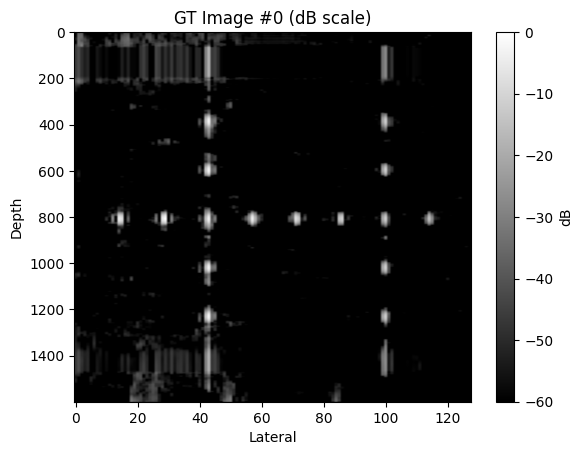

Training:  68%|██████▊   | 136/200 [2:34:46<1:13:00, 68.44s/it]

No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326947



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319945



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254764



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254959



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305854



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323476



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233196



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285109



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294223



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328136



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268892



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341131



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261804



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283224



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325016



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295947



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354839



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289999



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319929



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301123



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261520



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295413



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.203061



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252860



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305808



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255118



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293539



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278797



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336350



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319840



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316155



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233293



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348738



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317308



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322175



 49%|████▉     | 35/71 [00:32<00:33,  1.08it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332035



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338602



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270182



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332822



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283802



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221499



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285840



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291384



 61%|██████    | 43/71 [00:40<00:26,  1.08it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289772



 62%|██████▏   | 44/71 [00:40<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290710



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252805



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279191



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369989



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326842



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259478



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405437



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266041



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305342



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250900



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266771



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295306



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318437



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311957



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341554



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279175



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321824



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254336



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260197



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250061



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280705



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317289



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287960



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347089



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326062



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270774



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.278611



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.295342

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.282810, PSNR≈29.46, SSIM≈0.8648



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.87it/s]

Batch 2/7: Loss=0.235428, PSNR≈39.01, SSIM≈0.9123



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.84it/s]

Batch 3/7: Loss=0.326791, PSNR≈31.55, SSIM≈0.8941



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.281497, PSNR≈29.55, SSIM≈0.8684



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.81it/s]

Batch 5/7: Loss=0.277338, PSNR≈36.28, SSIM≈0.9206



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.80it/s]

Batch 6/7: Loss=0.286582, PSNR≈34.50, SSIM≈0.8087



Training:  68%|██████▊   | 137/200 [2:35:54<1:11:42, 68.29s/it]

Batch 7/7: Loss=0.292819, PSNR≈40.02, SSIM≈0.9697

===> Validation finished. Avg Loss: 0.283324, Avg PSNR: 35.43, Avg SSIM: 0.8977
🔁 Learning Rate for next epoch: 0.000625
Epoch 137/200 | Train: 0.2953 | Val: 0.2833 | PSNR: 35.43 | SSIM: 0.8977
No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274139



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256089



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273313



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252432



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228747



  7%|▋         | 5/71 [00:04<01:01,  1.08it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288322



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350671



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250201



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.352346



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259274



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348550



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251614



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318823



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309132



 20%|█▉        | 14/71 [00:12<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289208



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334794



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289886



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349507



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246135



 27%|██▋       | 19/71 [00:17<00:48,  1.08it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.363583



 28%|██▊       | 20/71 [00:18<00:47,  1.08it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280615



 30%|██▉       | 21/71 [00:19<00:46,  1.08it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283246



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330809



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289452



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366531



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309297



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297546



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336470



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307126



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303472



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225315



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304952



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281855



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273276



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274357



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318464



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332908



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321310



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265700



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280234



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276884



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361358



 59%|█████▉    | 42/71 [00:39<00:26,  1.08it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264697



 61%|██████    | 43/71 [00:39<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285214



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292186



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272809



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299473



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290569



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255029



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221972



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234778



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324388



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354992



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281551



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333548



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264972



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308753



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247810



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260374



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308064



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310572



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332621



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235719



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338001



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263419



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310708



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341079



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286660



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321837



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327858



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.326549



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.295833

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.94it/s]

Batch 1/7: Loss=0.284012, PSNR≈29.41, SSIM≈0.8754



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.236773, PSNR≈38.94, SSIM≈0.9113



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.328351, PSNR≈31.61, SSIM≈0.8966



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.89it/s]

Batch 4/7: Loss=0.282056, PSNR≈29.50, SSIM≈0.8767



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.90it/s]

Batch 5/7: Loss=0.278078, PSNR≈36.47, SSIM≈0.9287



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.288065, PSNR≈34.09, SSIM≈0.8009



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]

Batch 7/7: Loss=0.293827, PSNR≈39.83, SSIM≈0.9618

===> Validation finished. Avg Loss: 0.284452, Avg PSNR: 35.36, Avg SSIM: 0.8976
🔁 Learning Rate for next epoch: 0.000625
Epoch 138/200 | Train: 0.2958 | Val: 0.2845 | PSNR: 35.36 | SSIM: 0.8976
torch.Size([16, 1, 1600, 128])


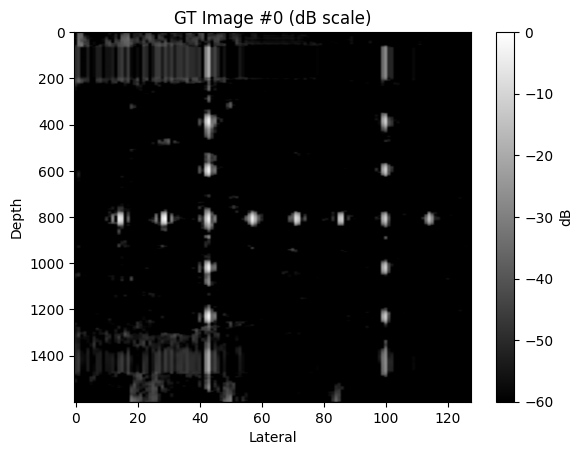

Training:  69%|██████▉   | 138/200 [2:37:02<1:10:37, 68.35s/it]

No improvement (4/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351987



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343379



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255214



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292092



  6%|▌         | 4/71 [00:03<01:02,  1.08it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324903



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291213



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370171



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275699



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320429



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278554



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347280



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285403



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305898



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265307



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296381



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325782



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249812



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261948



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279772



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270373



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355326



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292510



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319295



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310596



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257327



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.411736



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298927



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273160



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.216285



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332839



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290331



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299249



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305048



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253787



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292860



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290753



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238640



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288311



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.3705
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305661



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235471



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296178



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276941



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334424



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313398



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246129



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297120



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306991



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264062



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339111



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322194



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346114



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276663



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313157



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329191



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348627



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285926



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298512



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.225236



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311755



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242826



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267303



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223551



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255532



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316732



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292907



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345701



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318754



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267633



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298519



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273957



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.171284



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.293889

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.283493, PSNR≈29.34, SSIM≈0.8759



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.237032, PSNR≈38.78, SSIM≈0.9115



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.93it/s]

Batch 3/7: Loss=0.327631, PSNR≈31.59, SSIM≈0.8952



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.282957, PSNR≈29.51, SSIM≈0.8780



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.95it/s]

Batch 5/7: Loss=0.277955, PSNR≈36.40, SSIM≈0.9235



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.95it/s]

Batch 6/7: Loss=0.287651, PSNR≈34.47, SSIM≈0.8094



Training:  70%|██████▉   | 139/200 [2:38:10<1:09:22, 68.24s/it]

Batch 7/7: Loss=0.293632, PSNR≈39.86, SSIM≈0.9719

===> Validation finished. Avg Loss: 0.284336, Avg PSNR: 35.34, Avg SSIM: 0.8974
🔁 Learning Rate for next epoch: 0.000625
Epoch 139/200 | Train: 0.2939 | Val: 0.2843 | PSNR: 35.34 | SSIM: 0.8974
No improvement (5/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322733



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323158



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290748



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307522



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326879



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231369



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328441



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314614



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301625



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.3693
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332020



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285832



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297991



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384740



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.214651



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286211



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230946



 23%|██▎       | 16/71 [00:14<00:51,  1.08it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301503



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217743



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245504



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316747



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315053



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285896



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249602



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288712



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260873



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319631



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341577



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389036



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345007



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303010



 42%|████▏     | 30/71 [00:27<00:38,  1.08it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276493



 44%|████▎     | 31/71 [00:28<00:37,  1.08it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.354685



 45%|████▌     | 32/71 [00:29<00:36,  1.08it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308758



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304278



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236868



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260193



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305485



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276784



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330629



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292394



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276130



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259414



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306638



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303207



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264354



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297626



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251510



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276940



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355232



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237056



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289353



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277613



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307182



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.343972



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240632



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282268



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.205884



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282337



 82%|████████▏ | 58/71 [00:53<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322095



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288099



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292455



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346099



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.3691
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.361847



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299003



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299527



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308432



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291158



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290354



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333943



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278718



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.327301



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.295807

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.84it/s]

Batch 1/7: Loss=0.283538, PSNR≈29.41, SSIM≈0.8730



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.93it/s]

Batch 2/7: Loss=0.236146, PSNR≈38.80, SSIM≈0.9080



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.95it/s]

Batch 3/7: Loss=0.327675, PSNR≈31.64, SSIM≈0.8943



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.94it/s]

Batch 4/7: Loss=0.282583, PSNR≈29.54, SSIM≈0.8692



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.94it/s]

Batch 5/7: Loss=0.276405, PSNR≈35.83, SSIM≈0.9114



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.287667, PSNR≈33.79, SSIM≈0.8025



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]

Batch 7/7: Loss=0.292919, PSNR≈39.92, SSIM≈0.9685

===> Validation finished. Avg Loss: 0.283848, Avg PSNR: 35.40, Avg SSIM: 0.8960
🔁 Learning Rate for next epoch: 0.000313
Epoch 140/200 | Train: 0.2958 | Val: 0.2838 | PSNR: 35.40 | SSIM: 0.8960
torch.Size([16, 1, 1600, 128])


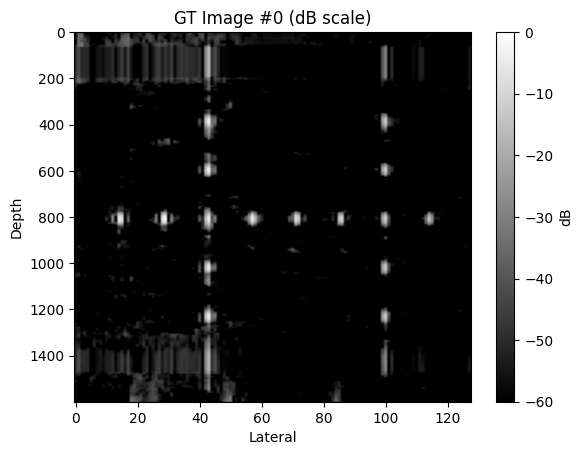

Training:  70%|███████   | 140/200 [2:39:19<1:08:18, 68.31s/it]

No improvement (6/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270143



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303099



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291998



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305390



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286606



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264792



  8%|▊         | 6/71 [00:05<01:00,  1.08it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290478



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296688



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247668



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331136



 14%|█▍        | 10/71 [00:09<00:56,  1.08it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270060



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345281



 17%|█▋        | 12/71 [00:11<00:54,  1.08it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278617



 18%|█▊        | 13/71 [00:12<00:53,  1.08it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333340



 20%|█▉        | 14/71 [00:13<00:52,  1.08it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252059



 21%|██        | 15/71 [00:13<00:52,  1.08it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284673



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310282



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236092



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257903



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324284



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289971



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268682



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340924



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.304595



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279038



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.3687
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331732



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229151



 38%|███▊      | 27/71 [00:25<00:40,  1.08it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324903



 39%|███▉      | 28/71 [00:26<00:39,  1.08it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247303



 41%|████      | 29/71 [00:26<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311180



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283566



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223323



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301703



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370189



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.226051



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290021



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317759



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337245



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272875



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273473



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266470



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313967



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289619



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278344



 62%|██████▏   | 44/71 [00:40<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246088



 63%|██████▎   | 45/71 [00:41<00:24,  1.08it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323737



 65%|██████▍   | 46/71 [00:42<00:23,  1.08it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269507



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303634



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299657



 69%|██████▉   | 49/71 [00:45<00:20,  1.08it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325799



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311863



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303082



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.345222



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.233879



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235278



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297495



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284985



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357198



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295002



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325343



 85%|████████▍ | 60/71 [00:55<00:10,  1.08it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.247667



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333889



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267773



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.224979



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286046



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.405731



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331685



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322021



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320687



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333511



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.351273



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.294869

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.81it/s]

Batch 1/7: Loss=0.283793, PSNR≈29.51, SSIM≈0.8767



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.80it/s]

Batch 2/7: Loss=0.236788, PSNR≈38.92, SSIM≈0.9106



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.81it/s]

Batch 3/7: Loss=0.328498, PSNR≈31.40, SSIM≈0.8965



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.79it/s]

Batch 4/7: Loss=0.283974, PSNR≈29.55, SSIM≈0.8773



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.83it/s]

Batch 5/7: Loss=0.279169, PSNR≈36.38, SSIM≈0.9201



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.87it/s]

Batch 6/7: Loss=0.288247, PSNR≈34.32, SSIM≈0.7976



Training:  70%|███████   | 141/200 [2:40:27<1:07:04, 68.21s/it]

Batch 7/7: Loss=0.292889, PSNR≈40.05, SSIM≈0.9707

===> Validation finished. Avg Loss: 0.284765, Avg PSNR: 35.38, Avg SSIM: 0.8968
🔁 Learning Rate for next epoch: 0.000313
Epoch 141/200 | Train: 0.2949 | Val: 0.2848 | PSNR: 35.38 | SSIM: 0.8968
No improvement (7/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.383444



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298681



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327856



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3706
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300408



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309494



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307594



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.277090



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9079
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294855



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259321



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245813



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289914



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302357



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319059



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264096



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355419



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307484



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379567



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293347



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370479



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288814



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.218933



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326193



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3697
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349423



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261628



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.349472



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329359



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340068



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.223677



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298042



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.224022



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276839



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274642



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287135



 46%|████▋     | 33/71 [00:30<00:35,  1.06it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285406



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294735



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317700



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288480



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298822



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.350734



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.256940



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340807



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295839



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293012



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281696



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282169



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241092



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294784



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261135



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295223



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251399



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301376



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286009



 73%|███████▎  | 52/71 [00:48<00:17,  1.08it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298214



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289961



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263104



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313919



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246563



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239630



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269382



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.379580



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337427



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250627



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266852



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267337



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288661



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281256



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312271



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326823



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250947



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255460



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.202185



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.292846

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.88it/s]

Batch 1/7: Loss=0.281977, PSNR≈29.48, SSIM≈0.8748



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.91it/s]

Batch 2/7: Loss=0.234949, PSNR≈38.93, SSIM≈0.9126



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.91it/s]

Batch 3/7: Loss=0.325836, PSNR≈31.62, SSIM≈0.8970



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.87it/s]

Batch 4/7: Loss=0.281308, PSNR≈29.57, SSIM≈0.8738



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.86it/s]

Batch 5/7: Loss=0.276142, PSNR≈36.12, SSIM≈0.9193



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.88it/s]

Batch 6/7: Loss=0.285696, PSNR≈34.32, SSIM≈0.8020



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.89it/s]

Batch 7/7: Loss=0.291626, PSNR≈40.02, SSIM≈0.9713

===> Validation finished. Avg Loss: 0.282505, Avg PSNR: 35.41, Avg SSIM: 0.8975
🔁 Learning Rate for next epoch: 0.000313
Epoch 142/200 | Train: 0.2928 | Val: 0.2825 | PSNR: 35.41 | SSIM: 0.8975
torch.Size([16, 1, 1600, 128])


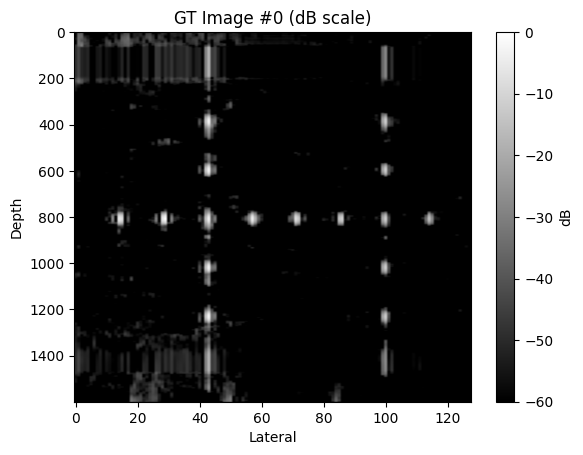

Training:  71%|███████   | 142/200 [2:41:35<1:06:04, 68.36s/it]

✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335157



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337121



  3%|▎         | 2/71 [00:01<01:03,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.217155



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297186



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322311



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284044



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253499



 10%|▉         | 7/71 [00:06<00:59,  1.08it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285572



 11%|█▏        | 8/71 [00:07<00:58,  1.08it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267548



 13%|█▎        | 9/71 [00:08<00:57,  1.08it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336189



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320885



 15%|█▌        | 11/71 [00:10<00:56,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282465



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.228718



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.211712



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351884



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279928



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323730



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282561



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307422



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253345



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340809



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289798



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318069



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284117



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291443



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270148



 37%|███▋      | 26/71 [00:24<00:42,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321159



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262245



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336199



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287093



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323300



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285639



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275568



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296097



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252343



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283280



 51%|█████     | 36/71 [00:33<00:32,  1.08it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272509



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301323



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264120



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.369991



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263565



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.230917



 59%|█████▉    | 42/71 [00:39<00:26,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265661



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299413



 62%|██████▏   | 44/71 [00:41<00:25,  1.08it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360113



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280943



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348348



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294025



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292183



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278414



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241585



 72%|███████▏  | 51/71 [00:47<00:18,  1.08it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.3688
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.368311



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280881



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327003



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254727



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.201529



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318278



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262360



 82%|████████▏ | 58/71 [00:54<00:12,  1.08it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.305195



 83%|████████▎ | 59/71 [00:54<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259608



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.3701
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.371049



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294936



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340551



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257492



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286919



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246327



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301831



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316595



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333339



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356609



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.304813



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.293623

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.92it/s]

Batch 1/7: Loss=0.281678, PSNR≈29.54, SSIM≈0.8781



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.85it/s]

Batch 2/7: Loss=0.234250, PSNR≈38.90, SSIM≈0.9124



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.88it/s]

Batch 3/7: Loss=0.325624, PSNR≈31.59, SSIM≈0.8958



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.92it/s]

Batch 4/7: Loss=0.280823, PSNR≈29.61, SSIM≈0.8796



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.91it/s]

Batch 5/7: Loss=0.276316, PSNR≈36.25, SSIM≈0.9224



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.92it/s]

Batch 6/7: Loss=0.285771, PSNR≈34.27, SSIM≈0.8069



Training:  72%|███████▏  | 143/200 [2:42:43<1:04:50, 68.26s/it]

Batch 7/7: Loss=0.290643, PSNR≈40.07, SSIM≈0.9714

===> Validation finished. Avg Loss: 0.282158, Avg PSNR: 35.45, Avg SSIM: 0.8989
🔁 Learning Rate for next epoch: 0.000313
Epoch 143/200 | Train: 0.2936 | Val: 0.2822 | PSNR: 35.45 | SSIM: 0.8989
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306820



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311192



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272713



  4%|▍         | 3/71 [00:02<01:03,  1.08it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260837



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9085
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289311



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259374



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234357



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.255764



 11%|█▏        | 8/71 [00:07<00:59,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257531



 13%|█▎        | 9/71 [00:08<00:58,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321432



 14%|█▍        | 10/71 [00:09<00:57,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347187



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246606



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293483



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238381



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270549



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.330743



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.205003



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266193



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325596



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319866



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.264762



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285969



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.331627



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.339830



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334159



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268557



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9086
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341377



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329252



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268894



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296038



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329939



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267558



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295628



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320986



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311491



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334001



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.236102



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300014



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324572



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250142



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341499



 58%|█████▊    | 41/71 [00:38<00:28,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267878



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262562



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300695



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232571



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321160



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333589



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.227676



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295429



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299684



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273943



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329799



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.245228



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318145



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328349



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332468



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300564



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323440



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284568



 83%|████████▎ | 59/71 [00:55<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306298



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263949



 86%|████████▌ | 61/71 [00:56<00:09,  1.08it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324127



 87%|████████▋ | 62/71 [00:57<00:08,  1.08it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241363



 89%|████████▊ | 63/71 [00:58<00:07,  1.08it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.334551



 90%|█████████ | 64/71 [00:59<00:06,  1.08it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.252171



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284901



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327156



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306830



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296131



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346407



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.256951



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.293013

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.87it/s]

Batch 1/7: Loss=0.282195, PSNR≈29.49, SSIM≈0.8755



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.79it/s]

Batch 2/7: Loss=0.235441, PSNR≈38.87, SSIM≈0.9116



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.80it/s]

Batch 3/7: Loss=0.326503, PSNR≈31.58, SSIM≈0.8949



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.85it/s]

Batch 4/7: Loss=0.281378, PSNR≈29.55, SSIM≈0.8739



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.85it/s]

Batch 5/7: Loss=0.276755, PSNR≈36.15, SSIM≈0.9164



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.286259, PSNR≈34.23, SSIM≈0.8075



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.86it/s]

Batch 7/7: Loss=0.291813, PSNR≈40.03, SSIM≈0.9704

===> Validation finished. Avg Loss: 0.282907, Avg PSNR: 35.39, Avg SSIM: 0.8967
🔁 Learning Rate for next epoch: 0.000313
Epoch 144/200 | Train: 0.2930 | Val: 0.2829 | PSNR: 35.39 | SSIM: 0.8967
torch.Size([16, 1, 1600, 128])


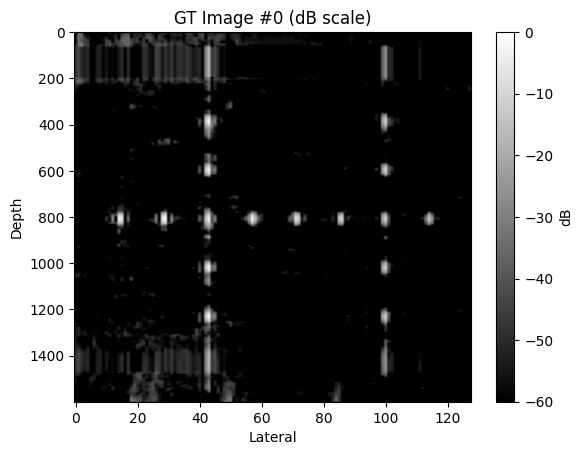

Training:  72%|███████▏  | 144/200 [2:43:52<1:03:48, 68.37s/it]

No improvement (1/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298734



  1%|▏         | 1/71 [00:00<01:04,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287058



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347297



  4%|▍         | 3/71 [00:02<01:03,  1.06it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.311181



  6%|▌         | 4/71 [00:03<01:02,  1.06it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328139



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.253071



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.249087



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325114



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.262570



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.266608



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.261587



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291855



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308817



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.229998



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318976



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.320217



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309985



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291926



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.207794



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278420



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278170



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272979



 31%|███       | 22/71 [00:20<00:45,  1.08it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279855



 32%|███▏      | 23/71 [00:21<00:44,  1.08it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267610



 34%|███▍      | 24/71 [00:22<00:43,  1.08it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.265455



 35%|███▌      | 25/71 [00:23<00:42,  1.08it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254675



 37%|███▋      | 26/71 [00:24<00:41,  1.08it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359231



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.244901



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280166



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.207281



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282335



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302572



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299501



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297475



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315893



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315928



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315067



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300016



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276787



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241931



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335845



 58%|█████▊    | 41/71 [00:38<00:27,  1.08it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.268640



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.335333



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243612



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285551



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.232916



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298097



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291744



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296537



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281364



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.308117



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289034



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293180



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275881



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297054



 77%|███████▋  | 55/71 [00:51<00:14,  1.07it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310742



 79%|███████▉  | 56/71 [00:52<00:14,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281640



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325399



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289467



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282149



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.340410



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.353207



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319234



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296259



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.2493
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.389912



 92%|█████████▏| 65/71 [01:00<00:05,  1.08it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269860



 93%|█████████▎| 66/71 [01:01<00:04,  1.08it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318628



 94%|█████████▍| 67/71 [01:02<00:03,  1.08it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.3704
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365361



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297853



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318876



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2505
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.372549



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.293954

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.93it/s]

Batch 1/7: Loss=0.283201, PSNR≈29.51, SSIM≈0.8740



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.85it/s]

Batch 2/7: Loss=0.235321, PSNR≈38.96, SSIM≈0.9112



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.81it/s]

Batch 3/7: Loss=0.326627, PSNR≈31.56, SSIM≈0.8974



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.82it/s]

Batch 4/7: Loss=0.282533, PSNR≈29.56, SSIM≈0.8723



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.76it/s]

Batch 5/7: Loss=0.277395, PSNR≈36.02, SSIM≈0.9153



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.82it/s]

Batch 6/7: Loss=0.286616, PSNR≈33.96, SSIM≈0.8008



Training:  72%|███████▎  | 145/200 [2:45:00<1:02:34, 68.27s/it]

Batch 7/7: Loss=0.291992, PSNR≈39.98, SSIM≈0.9710

===> Validation finished. Avg Loss: 0.283383, Avg PSNR: 35.40, Avg SSIM: 0.8976
🔁 Learning Rate for next epoch: 0.000313
Epoch 145/200 | Train: 0.2940 | Val: 0.2834 | PSNR: 35.40 | SSIM: 0.8976
No improvement (2/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290766



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.257117



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.338244



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267279



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.322344



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9087
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.288811



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310072



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291925



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300530



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.272136



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282897



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282271



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.312295



 18%|█▊        | 13/71 [00:12<00:53,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355405



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.384981



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.321654



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242127



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270947



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.315343



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.231087



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.366603



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259387



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300739



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9089
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.319941



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302157



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.346489



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.332839



 38%|███▊      | 27/71 [00:25<00:40,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295227



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.234403



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274370



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316402



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314464



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.365108



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248294



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.317889



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.276248



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318526



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283166



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295554



 55%|█████▍    | 39/71 [00:36<00:29,  1.07it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.239485



 56%|█████▋    | 40/71 [00:37<00:28,  1.07it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.314960



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.296884



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.208737



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.310509



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273162



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283676



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.238963



 66%|██████▌   | 47/71 [00:43<00:22,  1.08it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327202



 68%|██████▊   | 48/71 [00:44<00:21,  1.08it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.309424



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292709



 70%|███████   | 50/71 [00:46<00:19,  1.08it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.246066



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.263448



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279246



 75%|███████▍  | 53/71 [00:49<00:16,  1.07it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326850



 76%|███████▌  | 54/71 [00:50<00:15,  1.07it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285309



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248926



 79%|███████▉  | 56/71 [00:52<00:13,  1.08it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269249



 80%|████████  | 57/71 [00:53<00:13,  1.08it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221527



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9097
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.328566



 83%|████████▎ | 59/71 [00:54<00:11,  1.07it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.381008



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.362213



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.307066



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274815



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284403



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.237281



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9101
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.207478



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341844



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293870



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251538



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286242



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.3692
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.330872



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.293374

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.95it/s]

Batch 1/7: Loss=0.281682, PSNR≈29.49, SSIM≈0.8764



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.94it/s]

Batch 2/7: Loss=0.234676, PSNR≈38.87, SSIM≈0.9118



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.326127, PSNR≈31.58, SSIM≈0.8967



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.95it/s]

Batch 4/7: Loss=0.280492, PSNR≈29.61, SSIM≈0.8767



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.89it/s]

Batch 5/7: Loss=0.275813, PSNR≈36.23, SSIM≈0.9251



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.285622, PSNR≈34.04, SSIM≈0.8020



Validating: 100%|██████████| 7/7 [00:02<00:00,  2.91it/s]

Batch 7/7: Loss=0.291275, PSNR≈40.07, SSIM≈0.9708

===> Validation finished. Avg Loss: 0.282241, Avg PSNR: 35.43, Avg SSIM: 0.8982
🔁 Learning Rate for next epoch: 0.000313
Epoch 146/200 | Train: 0.2934 | Val: 0.2822 | PSNR: 35.43 | SSIM: 0.8982
torch.Size([16, 1, 1600, 128])


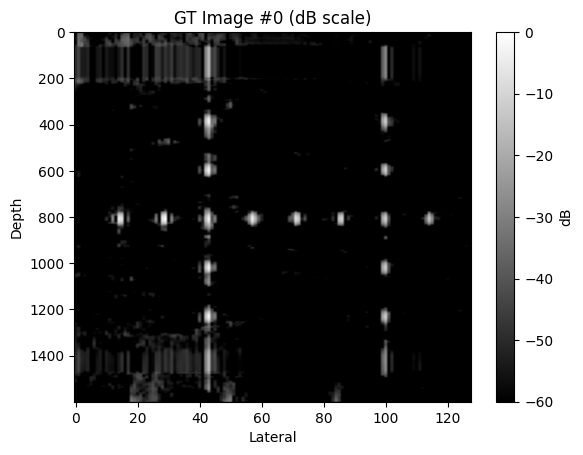

Training:  73%|███████▎  | 146/200 [2:46:09<1:01:31, 68.36s/it]

No improvement (3/8)

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306072



  1%|▏         | 1/71 [00:00<01:05,  1.07it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9093
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.301185



  3%|▎         | 2/71 [00:01<01:04,  1.07it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.3702
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.342374



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355953



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284106



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.254443



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280051



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242964



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250784



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259229



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.370795



 15%|█▌        | 11/71 [00:10<00:55,  1.08it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.270939



 17%|█▋        | 12/71 [00:11<00:55,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275041



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9088
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.267094



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.260575



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.283373



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.200258



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327316



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.306115



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.337032



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.347571



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.359350



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284692



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.348269



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.357557



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290092



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291081



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.323654



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.299881



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.278041



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250474



 44%|████▎     | 31/71 [00:28<00:37,  1.07it/s]


--- Batch 32/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.297955



 45%|████▌     | 32/71 [00:29<00:36,  1.07it/s]


--- Batch 33/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280514



 46%|████▋     | 33/71 [00:30<00:35,  1.07it/s]


--- Batch 34/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.302285



 48%|████▊     | 34/71 [00:31<00:34,  1.07it/s]


--- Batch 35/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279514



 49%|████▉     | 35/71 [00:32<00:33,  1.07it/s]


--- Batch 36/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.235944



 51%|█████     | 36/71 [00:33<00:32,  1.07it/s]


--- Batch 37/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.360250



 52%|█████▏    | 37/71 [00:34<00:31,  1.07it/s]


--- Batch 38/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.240796



 54%|█████▎    | 38/71 [00:35<00:30,  1.07it/s]


--- Batch 39/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.298810



 55%|█████▍    | 39/71 [00:36<00:29,  1.08it/s]


--- Batch 40/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.279585



 56%|█████▋    | 40/71 [00:37<00:28,  1.08it/s]


--- Batch 41/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275449



 58%|█████▊    | 41/71 [00:38<00:27,  1.07it/s]


--- Batch 42/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303029



 59%|█████▉    | 42/71 [00:39<00:27,  1.07it/s]


--- Batch 43/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303491



 61%|██████    | 43/71 [00:40<00:26,  1.07it/s]


--- Batch 44/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.329076



 62%|██████▏   | 44/71 [00:41<00:25,  1.07it/s]


--- Batch 45/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.251135



 63%|██████▎   | 45/71 [00:41<00:24,  1.07it/s]


--- Batch 46/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300585



 65%|██████▍   | 46/71 [00:42<00:23,  1.07it/s]


--- Batch 47/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.248852



 66%|██████▌   | 47/71 [00:43<00:22,  1.07it/s]


--- Batch 48/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.219481



 68%|██████▊   | 48/71 [00:44<00:21,  1.07it/s]


--- Batch 49/71 ---
Raw target range: 0.0000 to 0.9091
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.273267



 69%|██████▉   | 49/71 [00:45<00:20,  1.07it/s]


--- Batch 50/71 ---
Raw target range: 0.0000 to 0.3696
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.355285



 70%|███████   | 50/71 [00:46<00:19,  1.07it/s]


--- Batch 51/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.285736



 72%|███████▏  | 51/71 [00:47<00:18,  1.07it/s]


--- Batch 52/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336710



 73%|███████▎  | 52/71 [00:48<00:17,  1.07it/s]


--- Batch 53/71 ---
Raw target range: 0.0000 to 0.3713
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.341969



 75%|███████▍  | 53/71 [00:49<00:16,  1.08it/s]


--- Batch 54/71 ---
Raw target range: 0.0000 to 0.9111
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293429



 76%|███████▌  | 54/71 [00:50<00:15,  1.08it/s]


--- Batch 55/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.289167



 77%|███████▋  | 55/71 [00:51<00:14,  1.08it/s]


--- Batch 56/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.351176



 79%|███████▉  | 56/71 [00:52<00:13,  1.07it/s]


--- Batch 57/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.325325



 80%|████████  | 57/71 [00:53<00:13,  1.07it/s]


--- Batch 58/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.318321



 82%|████████▏ | 58/71 [00:54<00:12,  1.07it/s]


--- Batch 59/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271622



 83%|████████▎ | 59/71 [00:55<00:11,  1.08it/s]


--- Batch 60/71 ---
Raw target range: 0.0000 to 0.9114
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.316550



 85%|████████▍ | 60/71 [00:55<00:10,  1.07it/s]


--- Batch 61/71 ---
Raw target range: 0.0000 to 0.9095
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269378



 86%|████████▌ | 61/71 [00:56<00:09,  1.07it/s]


--- Batch 62/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.326771



 87%|████████▋ | 62/71 [00:57<00:08,  1.07it/s]


--- Batch 63/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290776



 89%|████████▊ | 63/71 [00:58<00:07,  1.07it/s]


--- Batch 64/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294104



 90%|█████████ | 64/71 [00:59<00:06,  1.07it/s]


--- Batch 65/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.281361



 92%|█████████▏| 65/71 [01:00<00:05,  1.07it/s]


--- Batch 66/71 ---
Raw target range: 0.0000 to 0.9096
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.271339



 93%|█████████▎| 66/71 [01:01<00:04,  1.07it/s]


--- Batch 67/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.221295



 94%|█████████▍| 67/71 [01:02<00:03,  1.07it/s]


--- Batch 68/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.313078



 96%|█████████▌| 68/71 [01:03<00:02,  1.07it/s]


--- Batch 69/71 ---
Raw target range: 0.0000 to 0.9092
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333646



 97%|█████████▋| 69/71 [01:04<00:01,  1.07it/s]


--- Batch 70/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.218192



 99%|█████████▊| 70/71 [01:05<00:00,  1.07it/s]


--- Batch 71/71 ---
Raw target range: 0.0000 to 0.2489
Prediction shape before interpolation: torch.Size([5, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([5, 1, 192, 304])
Loss value: 0.368956



100%|██████████| 71/71 [01:05<00:00,  1.08it/s]



===> Epoch finished. Avg loss: 0.295219

===> Starting validation
Loss function: combined
Total batches: 7



Validating:  14%|█▍        | 1/7 [00:00<00:02,  2.88it/s]

Batch 1/7: Loss=0.281893, PSNR≈29.51, SSIM≈0.8683



Validating:  29%|██▊       | 2/7 [00:00<00:01,  2.95it/s]

Batch 2/7: Loss=0.234372, PSNR≈39.06, SSIM≈0.9107



Validating:  43%|████▎     | 3/7 [00:01<00:01,  2.94it/s]

Batch 3/7: Loss=0.325264, PSNR≈31.68, SSIM≈0.8928



Validating:  57%|█████▋    | 4/7 [00:01<00:01,  2.86it/s]

Batch 4/7: Loss=0.280495, PSNR≈29.57, SSIM≈0.8700



Validating:  71%|███████▏  | 5/7 [00:01<00:00,  2.88it/s]

Batch 5/7: Loss=0.275855, PSNR≈36.22, SSIM≈0.9092



Validating:  86%|████████▌ | 6/7 [00:02<00:00,  2.90it/s]

Batch 6/7: Loss=0.285384, PSNR≈34.28, SSIM≈0.8076



Training:  74%|███████▎  | 147/200 [2:47:17<1:00:18, 68.27s/it]

Batch 7/7: Loss=0.291667, PSNR≈40.02, SSIM≈0.9704

===> Validation finished. Avg Loss: 0.282133, Avg PSNR: 35.46, Avg SSIM: 0.8958
🔁 Learning Rate for next epoch: 0.000313
Epoch 147/200 | Train: 0.2952 | Val: 0.2821 | PSNR: 35.46 | SSIM: 0.8958
✓ New best model saved to /content/drive/MyDrive/SoCDAML-Project/checkpoints/unet

===> Starting training epoch
Model is on device: cuda:0
Loss function: combined
Total batches: 71



  0%|          | 0/71 [00:00<?, ?it/s]


--- Batch 1/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.241795



  1%|▏         | 1/71 [00:00<01:05,  1.08it/s]


--- Batch 2/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.324479



  3%|▎         | 2/71 [00:01<01:04,  1.08it/s]


--- Batch 3/71 ---
Raw target range: 0.0000 to 0.9108
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.294852



  4%|▍         | 3/71 [00:02<01:03,  1.07it/s]


--- Batch 4/71 ---
Raw target range: 0.0000 to 0.3695
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292209



  6%|▌         | 4/71 [00:03<01:02,  1.07it/s]


--- Batch 5/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.275190



  7%|▋         | 5/71 [00:04<01:01,  1.07it/s]


--- Batch 6/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.274798



  8%|▊         | 6/71 [00:05<01:00,  1.07it/s]


--- Batch 7/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291302



 10%|▉         | 7/71 [00:06<00:59,  1.07it/s]


--- Batch 8/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.287741



 11%|█▏        | 8/71 [00:07<00:58,  1.07it/s]


--- Batch 9/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327912



 13%|█▎        | 9/71 [00:08<00:57,  1.07it/s]


--- Batch 10/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.282563



 14%|█▍        | 10/71 [00:09<00:56,  1.07it/s]


--- Batch 11/71 ---
Raw target range: 0.0000 to 0.9100
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.269343



 15%|█▌        | 11/71 [00:10<00:55,  1.07it/s]


--- Batch 12/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.333733



 17%|█▋        | 12/71 [00:11<00:54,  1.07it/s]


--- Batch 13/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.293551



 18%|█▊        | 13/71 [00:12<00:54,  1.07it/s]


--- Batch 14/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.336246



 20%|█▉        | 14/71 [00:13<00:53,  1.07it/s]


--- Batch 15/71 ---
Raw target range: 0.0000 to 0.9109
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.290563



 21%|██        | 15/71 [00:13<00:52,  1.07it/s]


--- Batch 16/71 ---
Raw target range: 0.0000 to 0.9094
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.258401



 23%|██▎       | 16/71 [00:14<00:51,  1.07it/s]


--- Batch 17/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.295597



 24%|██▍       | 17/71 [00:15<00:50,  1.07it/s]


--- Batch 18/71 ---
Raw target range: 0.0000 to 0.9082
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.436790



 25%|██▌       | 18/71 [00:16<00:49,  1.07it/s]


--- Batch 19/71 ---
Raw target range: 0.0000 to 0.9104
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.327148



 27%|██▋       | 19/71 [00:17<00:48,  1.07it/s]


--- Batch 20/71 ---
Raw target range: 0.0000 to 0.9105
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.259002



 28%|██▊       | 20/71 [00:18<00:47,  1.07it/s]


--- Batch 21/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.286319



 30%|██▉       | 21/71 [00:19<00:46,  1.07it/s]


--- Batch 22/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.250778



 31%|███       | 22/71 [00:20<00:45,  1.07it/s]


--- Batch 23/71 ---
Raw target range: 0.0000 to 0.3698
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.356794



 32%|███▏      | 23/71 [00:21<00:44,  1.07it/s]


--- Batch 24/71 ---
Raw target range: 0.0000 to 0.3694
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.280025



 34%|███▍      | 24/71 [00:22<00:43,  1.07it/s]


--- Batch 25/71 ---
Raw target range: 0.0000 to 0.9099
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.284151



 35%|███▌      | 25/71 [00:23<00:42,  1.07it/s]


--- Batch 26/71 ---
Raw target range: 0.0000 to 0.9102
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.300649



 37%|███▋      | 26/71 [00:24<00:41,  1.07it/s]


--- Batch 27/71 ---
Raw target range: 0.0000 to 0.9107
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.242378



 38%|███▊      | 27/71 [00:25<00:41,  1.07it/s]


--- Batch 28/71 ---
Raw target range: 0.0000 to 0.9090
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.291684



 39%|███▉      | 28/71 [00:26<00:40,  1.07it/s]


--- Batch 29/71 ---
Raw target range: 0.0000 to 0.9106
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.303302



 41%|████      | 29/71 [00:27<00:39,  1.07it/s]


--- Batch 30/71 ---
Raw target range: 0.0000 to 0.9103
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.292020



 42%|████▏     | 30/71 [00:27<00:38,  1.07it/s]


--- Batch 31/71 ---
Raw target range: 0.0000 to 0.9098
Prediction shape before interpolation: torch.Size([16, 1, 1600, 128])
Normalized prediction range: 0.0000 to 1.0000
Normalized target range: 0.0000 to 1.0000
Prediction shape after interpolation: torch.Size([16, 1, 192, 304])
Loss value: 0.243584


Training:  74%|███████▎  | 147/200 [2:47:46<1:00:29, 68.48s/it]


KeyboardInterrupt: 

In [28]:
best_model_path = CONFIG['checkpoints_dir']
best_val_loss = float('inf')
epochs_no_improve = 0
patience = 8

###### Training Loop ######
for epoch in trange(CONFIG['epochs'], desc="Training"):
    train_loss = train_one_epoch(model, train_loader, optimizer)
    val_loss, val_psnr, val_ssim = validate(model, val_loader)
    scheduler.step(val_loss) # I need to include val loss if I am using On Plateau one

    # Print current learning rate
    current_lr = optimizer.param_groups[0]['lr']
    print(f"🔁 Learning Rate for next epoch: {current_lr:.6f}")

    print(f"Epoch {epoch+1}/{CONFIG['epochs']} | "
          f"Train: {train_loss:.4f} | Val: {val_loss:.4f} | "
          f"PSNR: {val_psnr:.2f} | SSIM: {val_ssim:.4f}")

    ###### Visualization (every 2 epochs) ######
    if (epoch + 1) % 2 == 0:
        model.eval()
        with torch.no_grad():
            sample_x, sample_y = next(iter(val_loader))
            sample_pred = model(sample_x.to(CONFIG['device']))  # forward pass
            print(sample_pred.shape)
            visualize_gt_db(sample_pred.cpu().squeeze(1), idx=0)

    ###### Early Stopping + Checkpoint ######
    if val_loss < best_val_loss:
        best_val_loss = val_loss
        epochs_no_improve = 0
        # This goes to a clean file used for deployment/inference only
        torch.save(model.state_dict(), os.path.join(CONFIG['checkpoints_dir'], 'model_weights.pth'))
        # thish is checkpoint style file to resume training
        checkpoint = {
            'epoch': epoch,
            'model_state_dict': model.state_dict(),
            'optimizer_state_dict': optimizer.state_dict(),
            'scheduler_state_dict': scheduler.state_dict(),
            'val_loss': best_val_loss
        }
        torch.save(model.state_dict(), os.path.join(CONFIG['checkpoints_dir'], 'training_state.pth'))

        print(f"✓ New best model saved to {best_model_path}")
    else:
        epochs_no_improve += 1
        print(f"No improvement ({epochs_no_improve}/{patience})")

        if epochs_no_improve >= patience:
            print(f"⛔ Early stopping at epoch {epoch+1}")
            break

## Model Testing
Here, we want to test the model learned.

## Model Visualization
We visualize one example of the reconstructed images.

In [ ]:
def visualize_prediction_vs_gt_db(gt_tensor, pred_tensor, idx=0, clim=(-60, 0)):
    """
    Visualizes GT and predicted images side by side in dB scale.

    Args:
        gt_tensor (torch.Tensor): shape [B, 1, H, W]
        pred_tensor (torch.Tensor): shape [B, 1, H, W]
        idx (int): index in the batch to visualize
        clim (tuple): dB range to clip the display, e.g., (-60, 0)
    """
    gt = gt_tensor[idx, 0].detach().cpu().numpy()
    pred = pred_tensor[idx, 0].detach().cpu().numpy()

    gt_db = 20 * np.log10(np.abs(gt) / np.max(gt) + 1e-8)
    pred_db = 20 * np.log10(np.abs(pred) / np.max(pred) + 1e-8)

    fig, axs = plt.subplots(1, 2, figsize=(12, 5))
    im0 = axs[0].imshow(gt_db, cmap='gray', aspect='auto', vmin=clim[0], vmax=clim[1])
    axs[0].set_title("Ground Truth (dB)")
    axs[0].axis('off')
    fig.colorbar(im0, ax=axs[0], label='dB')

    im1 = axs[1].imshow(pred_db, cmap='gray', aspect='auto', vmin=clim[0], vmax=clim[1])
    axs[1].set_title("Reconstruction (dB)")
    axs[1].axis('off')
    fig.colorbar(im1, ax=axs[1], label='dB')

    plt.suptitle(f"Sample #{idx}")
    plt.tight_layout()
    plt.show()


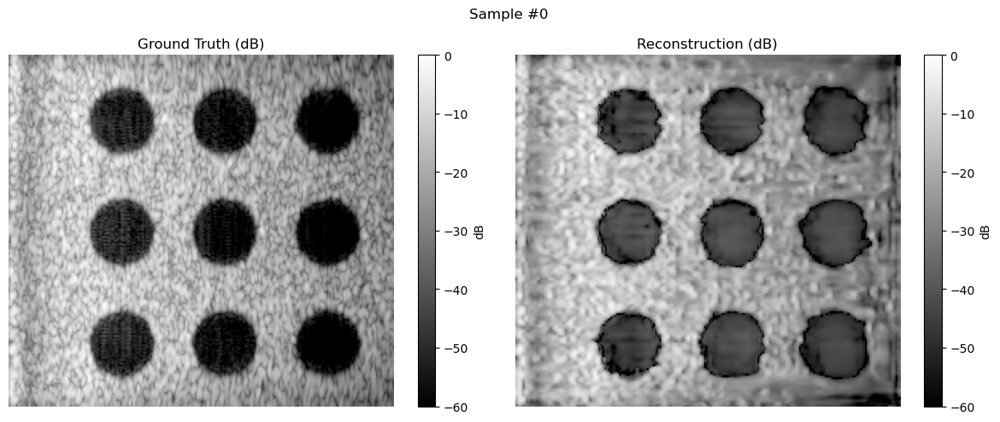

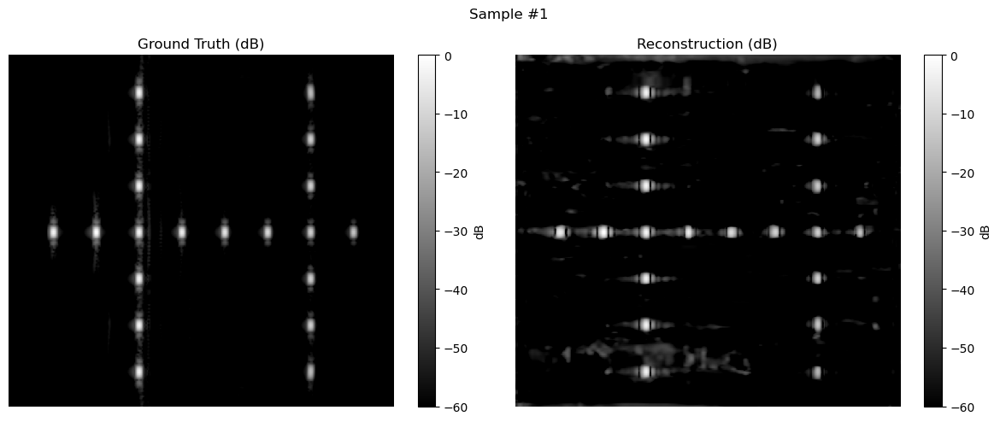

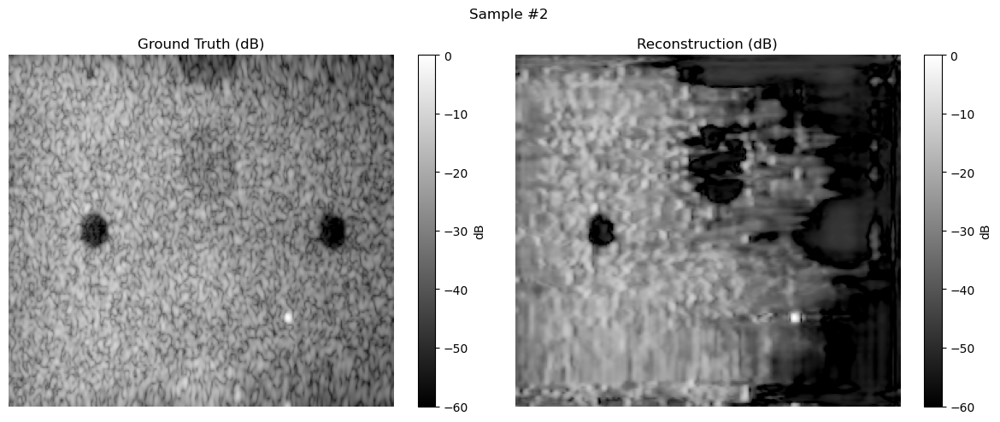

In [ ]:
#970k param model
model.load_state_dict(torch.load(r"C:\Users\jdszk\OneDrive - ETH Zurich\Desktop\best970k16ch\effunet_970k_best.pth", map_location="cpu"))
model.eval()

# Get validation batch
x_val, y_val = next(iter(test_loader))
x_val, y_val = x_val.to(CONFIG['device']), y_val.to(CONFIG['device'])

# Predict
with torch.no_grad():
    preds = model(x_val)

# Visualize a few samples
for i in range(3):
    visualize_prediction_vs_gt_db(y_val, preds, idx=i)